In [1]:
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy import units as u
from astropy import constants as const
import matplotlib.pyplot as plt
#import os.path
#import glob

In [2]:
plt.rcParams['figure.facecolor'] = 'white'
import matplotlib.colors as mcolors
cmap_grey = mcolors.LinearSegmentedColormap.from_list('mycmap',['#e6e6e6','#000000'])#'#d8d8d8'
#make plots look nicer (from PyStructure notebook)
from matplotlib import rc
rc('font',family='DejaVu Sans',size=20)
#rc('font',family='DejaVu',size=20)
rc('mathtext',fontset='dejavusans')
rc('figure', figsize=(1.41421356237*6.,6.)) 
rc('lines', linewidth=1.8,marker=None,markersize=8 )
rc('axes', linewidth=1.5,labelsize=19)#,prop_cycle=plt.cycler(color=('k','r','b','darkorange','steelblue','hotpink','gold','c','maroon','darkgreen')) )
rc(('xtick.major','ytick.major'), size=5.2,width=1.5)
rc(('xtick.minor','ytick.minor'), size=3.2,width=1.5,visible=True)
rc(('xtick','ytick'), labelsize=15, direction='in' )
rc(('xtick'), top=True,bottom=True ) # For some stupid reason you have to do these seperately
rc(('ytick'), left=True,right=True )
rc('legend',numpoints=1,scatterpoints=1,labelspacing=0.2,fontsize=15,fancybox=True,handlelength=1.5,
            handletextpad=0.5)
rc('savefig', dpi=150,format='pdf',bbox='tight' )
rc('errorbar',capsize=3.)

In [3]:
from scipy.stats import linregress
from scipy.stats import ks_2samp
from scipy import odr
#from scipy.stats import entropy
#from scipy.stats import wasserstein_distance
#from scipy.stats import cramervonmises_2samp
import seaborn as sns
import linmix

In [4]:
from astropy.cosmology import LambdaCDM#, FlatLambdaCDM
cosmo = LambdaCDM(H0=69.7,Om0=0.3,Ode0=0.7)

In [5]:
colloquiumpath = '/users/brodriguez/Documents/Notebooks/colloquiumfigures/'
databasepath = '/vol/aibn1081/data1/brodriguez/Databases/'
figurepath   = '/vol/aibn1081/data1/brodriguez/Figures/'
#califaoutpath = '/vol/aibn1081/data1/brodriguez/CALIFA/'
#acaoutpath    = '/vol/aibn1081/data1/brodriguez/ACA/'
#califainpath  = '/vol/alcina/data1/shared/EDGE/PIPE3DS_v2.3/'
#acainpath     = '/vol/alcina/data1/shared/EDGE/aca_edge_natv/cubes/'

In [6]:
def create_bins(number,bin_width=1):
    q = np.floor(number/bin_width)
    return q*bin_width

In [7]:
G = const.G.to(u.kpc**3/(u.Msun*u.s**2)).value # gravitational constant
k_B = (const.k_B).to(u.Msun*u.kpc**2/u.s**2/u.K).value # Boltzmann constant
S_H1 = 7.*10**6 # average atomic gas mass surface density in M_sun kpc^-2
Z_sun = 4.9*10**-4 # solar metallicity, Baumgartner & Mushotzky 2006
alphaCO_MW = 4.3 # M_sun/(K km s^-1 pc^2) from Milky Way observations

In [9]:
def S_mol(CO_int,inc,alphaCO=alphaCO_MW,R_21=0.65):
    cos = np.cos(np.deg2rad(inc))
    Smol = CO_int*cos*alphaCO*10**6/R_21
    return Smol

def star_vdisp(S_Mstar,Re):
    hs = Re/(1.68*7.3)
    return np.sqrt(2*np.pi*G*S_Mstar*hs)*u.kpc.to(u.km)

def Ph(S_mol,S_Mstar,star_vdisp,CO_vdisp=11):
    Ph = (np.pi*G/2)*(S_mol+S_H1)*((S_mol+S_H1)+S_Mstar*CO_vdisp/star_vdisp)
    #Ph = (np.pi*G/2)*(S_mol+S_H1)*((S_mol+S_H1)+S_Mstar/1.6*CO_vdisp/(star_vdisp/np.sqrt(1.6)))
    return Ph/k_B/(u.kpc**3).to(u.cm**3)

def Pde(S_mol,S_Mstar,Re,CO_vdisp=11):
    hs = Re/(1.68*7.3)
    Pde = (np.pi*G/2)*(S_mol+S_H1)**2 + (S_mol+S_H1)*np.sqrt(G*S_Mstar/hs/2)*CO_vdisp/u.kpc.to(u.km)
    #Pde = (np.pi*G/2)*(S_mol+S_H1)**2 + (S_mol+S_H1)*np.sqrt(G*S_Mstar/1.6/hs/2)*CO_vdisp/u.kpc.to(u.km)
    return Pde/k_B/(u.kpc**3).to(u.cm**3)

In [14]:
def S_mol(CO_int,inc,alphaCO=alphaCO_MW,R_21=0.65,unc=False,eCO_int=None,ealpha_CO=alphaCO_MW*0.3):
    cos = np.cos(np.deg2rad(inc))
    Smol = CO_int*cos*alphaCO*10**6/R_21
    if unc:
        if (eCO_int is None) or (ealpha_CO is None):
            print('Need to provide error for integrated intensity or alphaCO')
            return None
        else:
            eSmol = Smol*np.sqrt((eCO_int/CO_int)**2 + (ealpha_CO/alphaCO)**2)
            return Smol, eSmol
    else:
        return Smol

def star_vdisp(S_Mstar,Re):
    hs = Re/(1.68*7.3)
    return np.sqrt(2*np.pi*G*S_Mstar*hs)*u.kpc.to(u.km)

def Ph(S_mol,S_Mstar,star_vdisp,CO_vdisp=11,unc=False,eS_mol=None,eS_Mstar=None,Re=None):
    S_gas = S_mol+S_H1
    Ph = (np.pi*G/2)*S_gas*(S_gas+S_Mstar*CO_vdisp/star_vdisp)
    Ph = Ph/k_B/(u.kpc**3).to(u.cm**3)
    
    if unc:
        if (eS_mol is None) or (eS_Mstar is None):
            print('Need to provide error for stellar or molecualer gas mass surface density')
            return None
        else:
            hs = Re/(1.68*7.3)
            COvdisp_root = CO_vdisp*np.sqrt(np.pi*G*S_Mstar/hs/8)/u.kpc.to(u.km)
            ePh = np.sqrt(((np.pi*G*S_gas + COvdisp_root)*eS_mol)**2 + (S_gas*COvdisp_root*eS_Mstar/S_Mstar/2)**2)
            ePh = ePh/k_B/(u.kpc**3).to(u.cm**3)
            return Ph, ePh
    else:
        return Ph

def Pde(S_mol,S_Mstar,Re,CO_vdisp=11):
    hs = Re/(1.68*7.3)
    S_gas = S_mol+S_H1
    Pde = (np.pi*G/2)*S_gas**2 + S_gas*np.sqrt(G*S_Mstar/hs/2)*CO_vdisp/u.kpc.to(u.km)
    return Pde/k_B/(u.kpc**3).to(u.cm**3)

In [11]:
#from matplotlib.patches import Ellipse

def eigsorted(cov):
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    return vals[order], vecs[:,order]

def get_pca(x,y,angle=False):
    cov = np.cov(x, y)
    vals, vecs = eigsorted(cov)
    m = np.tan(np.arctan2(*vecs[:,0][::-1]))
    b = np.mean(y) - m*np.mean(x)
    if angle:
        theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
        return m, b, theta
    else:
        return m, b

In [9]:
stages = ['SF','QnR','cQ','MX','nR','fR']
A = 0.3
b = 0.95

In [10]:
rng = np.random.default_rng()
sample1 = rng.standard_normal(size=150)
sample2 = rng.standard_normal(size=100)
ks_2samp(sample1, sample2)

KstestResult(statistic=0.1, pvalue=0.562861170580314, statistic_location=-0.3490306849517616, statistic_sign=-1)

In [234]:
Database = pd.read_csv(databasepath+'ACA_database_2024-07-23.csv')
#Database = pd.read_csv(databasepath+'ACA_database_2024-08-09.csv')
Database['Source'] = Database['Source'].astype("category")
Database['Final_QS'] = Database['Final_QS'].astype("category")
Database['Final_NA'] = Database['Final_NA'].astype("category")
Database.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67869 entries, 0 to 67868
Data columns (total 34 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Source         67869 non-null  category
 1   Final_QS       67869 non-null  category
 2   Final_NA       67869 non-null  category
 3   Inclination    67869 non-null  float64 
 4   PA             67869 non-null  float64 
 5   Area_kpc2      67869 non-null  float64 
 6   Re_kpc         67869 non-null  float64 
 7   Rgal_kpc       67869 non-null  float64 
 8   RA             67869 non-null  float64 
 9   DEC            67869 non-null  float64 
 10  T_gal          67869 non-null  float64 
 11  S_Mstar        67869 non-null  float64 
 12  eS_Mstar       67869 non-null  float64 
 13  S_SFR          67869 non-null  float64 
 14  eS_SFR         67869 non-null  float64 
 15  S_SFR2         67869 non-null  float64 
 16  eS_SFR2        67869 non-null  float64 
 17  S_SFR_D4       67869 non-null  

In [235]:
Database = Database[Database['Inclination']<70]

In [236]:
print(len(np.unique(Database['Source'])))
print(np.unique(Database['Source']))

40
['CGCG429-012' 'IC1079' 'IC1528' 'IC2341' 'MCG-01-52-012' 'MCG-02-02-030'
 'NGC0001' 'NGC0155' 'NGC0171' 'NGC0180' 'NGC0693' 'NGC0731' 'NGC0768'
 'NGC1056' 'NGC1542' 'NGC2449' 'NGC2540' 'NGC2554' 'NGC2595' 'NGC3300'
 'NGC7025' 'NGC7194' 'NGC7311' 'NGC7321' 'NGC7364' 'NGC7466' 'NGC7489'
 'NGC7625' 'NGC7716' 'UGC00312' 'UGC00335NED02' 'UGC02099' 'UGC04455'
 'UGC08781' 'UGC11649' 'UGC11680NED02' 'UGC12224' 'UGC12250' 'UGC12274'
 'UGC12348']


In [237]:
Database['star_vdisp'] = star_vdisp(Database['S_Mstar'],Database['Re_kpc'])
Database['S_mol_MW'] = S_mol(Database['CO_int'],Database['Inclination'])
Database['S_mol_O3'] = S_mol(Database['CO_int'],Database['Inclination'],alphaCO=Database['alphaCO_O3N2'])
Database['P_h_MW'] = Ph(Database['S_mol_MW'],Database['S_Mstar'],Database['star_vdisp'])
Database['P_h_O3'] = Ph(Database['S_mol_O3'],Database['S_Mstar'],Database['star_vdisp'])
Database['P_h_MW_vdisp'] = Ph(Database['S_mol_MW'],Database['S_Mstar'],Database['star_vdisp'],Database['CO_vdisp'])
Database['P_h_O3_vdisp'] = Ph(Database['S_mol_O3'],Database['S_Mstar'],Database['star_vdisp'],Database['CO_vdisp'])
Database['P_DE_O3'] = Pde(Database['S_mol_O3'],Database['S_Mstar'],Database['Re_kpc'])

In [238]:
Database['S_mol_O3'], Database['eS_mol_O3'] = S_mol(Database['CO_int'],Database['Inclination'],alphaCO=Database['alphaCO_O3N2'],unc=True,eCO_int=Database['eCO_int'],ealpha_CO=Database['ealphaCO_O3N2'])
Database['P_h_O3'], Database['eP_h_O3'] = Ph(Database['S_mol_O3'],Database['S_Mstar'],Database['star_vdisp'],unc=True,eS_mol=Database['eS_mol_O3'],eS_Mstar=Database['eS_Mstar'],Re=Database['Re_kpc'])

In [239]:
Database['S_mol_MW'], Database['eS_mol_MW'] = S_mol(Database['CO_int'],Database['Inclination'],alphaCO=alphaCO_MW,unc=True,eCO_int=Database['eCO_int'])#,ealpha_CO=0.2)
Database['P_h_MW'], Database['eP_h_MW'] = Ph(Database['S_mol_MW'],Database['S_Mstar'],Database['star_vdisp'],unc=True,eS_mol=Database['eS_mol_MW'],eS_Mstar=Database['eS_Mstar'],Re=Database['Re_kpc'])

In [240]:
Database['Rgal_Re'] = Database['Rgal_kpc']/Database['Re_kpc']
Database['log_S_Mstar'] = np.log10(Database['S_Mstar'])
Database['log_S_SFR'] = np.log10(Database['S_SFR'])
Database['log_S_SFR2'] = np.log10(Database['S_SFR2'])
Database['log_S_SFR_D4'] = np.log10(Database['S_SFR_D4'])
Database['log_S_mol_MW'] = np.log10(Database['S_mol_MW'])
Database['log_S_mol_O3'] = np.log10(Database['S_mol_O3'])
Database['log_P_h_MW'] = np.log10(Database['P_h_MW'])
Database['log_P_h_O3'] = np.log10(Database['P_h_O3'])
Database['log_P_h_MW_vdisp'] = np.log10(Database['P_h_MW_vdisp'])
Database['log_P_h_O3_vdisp'] = np.log10(Database['P_h_O3_vdisp'])
#Database['log_P_DE_O3'] = np.log10(Database['P_DE_O3'])
#Database['log_S_SFR2'] = np.log10(Database['S_SFR2'])

/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [241]:
#Database['S_SFR_final'] = Database['S_SFR']
Database.loc[np.floor(Database['Ha_mask'])==1,'S_SFR_final'] = Database.loc[np.floor(Database['Ha_mask'])==1,'S_SFR']
Database.loc[(np.floor(Database['Ha_mask'])!=1)&(np.floor(Database['D4_mask'])==1),'S_SFR_final'] = Database.loc[(np.floor(Database['Ha_mask'])!=1)&(np.floor(Database['D4_mask'])==1),'S_SFR_D4']
Database.loc[np.floor(Database['Ha_mask'])==1,'eS_SFR_final'] = Database.loc[np.floor(Database['Ha_mask'])==1,'eS_SFR']
Database.loc[(np.floor(Database['Ha_mask'])!=1)&(np.floor(Database['D4_mask'])==1),'eS_SFR_final'] = Database.loc[(np.floor(Database['Ha_mask'])!=1)&(np.floor(Database['D4_mask'])==1),'eS_SFR_D4']
Database['log_S_SFR_final'] = np.log10(Database['S_SFR_final'])
Database['log_sSFR_final'] = Database['log_S_SFR_final']-Database['log_S_Mstar']
Database['log_SFE_O3_final'] = Database['log_S_SFR_final']-Database['log_S_mol_O3']
Database['log_f_CO_O3'] = Database['log_S_mol_O3']-Database['log_S_Mstar']

/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [19]:
Database['log_sSFR'] = Database['log_S_SFR']-Database['log_S_Mstar']
Database['log_sSFR_D4'] = Database['log_S_SFR_D4']-Database['log_S_Mstar']
Database['log_SFE_O3'] = Database['log_S_SFR']-Database['log_S_mol_O3']
Database['log_SFE_O3_D4'] = Database['log_S_SFR_D4']-Database['log_S_mol_O3']
Database['log_f_CO_O3'] = Database['log_S_mol_O3']-Database['log_S_Mstar']
Database['log_SFE_MW'] = Database['log_S_SFR']-Database['log_S_mol_MW']
Database['log_SFE_MW_D4'] = Database['log_S_SFR_D4']-Database['log_S_mol_MW']
Database['log_f_CO_MW'] = Database['log_S_mol_MW']-Database['log_S_Mstar']

In [ ]:
Database['SFR_D4_Ha'] = Database['log_S_SFR_D4']-Database['log_S_SFR']
Database['log_S_SFR_final'] = Database['log_S_SFR']
Database.loc[np.floor(Database['Ha_mask'])!=1,'log_S_SFR_final'] = Database.loc[np.floor(Database['Ha_mask'])!=1,'log_S_SFR_D4']
Database['log_SFE_O3_final'] = Database['log_SFE_O3']
Database.loc[np.floor(Database['Ha_mask'])!=1,'log_SFE_O3_final'] = Database.loc[np.floor(Database['Ha_mask'])!=1,'log_SFE_O3_D4']
Database['log_sSFR_final'] = Database['log_sSFR']
Database.loc[np.floor(Database['Ha_mask'])!=1,'log_sSFR_final'] = Database.loc[np.floor(Database['Ha_mask'])!=1,'log_sSFR_D4']

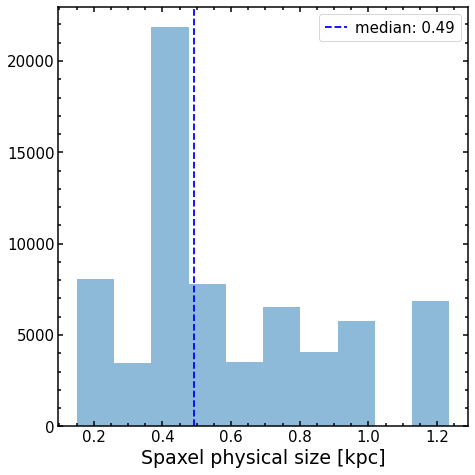

In [45]:
fig, ax = plt.subplots(figsize=(7,7))#,sharey='row')
ax.hist(np.sqrt(Database['Area_kpc2']),alpha=0.5)#,label=r'H$\alpha$ SFR')#,bins=np.linspace(-6,0,31))
median = np.nanmedian(np.sqrt(Database['Area_kpc2']))
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
#ax.hist(Database['log_S_SFR_D4'],alpha=0.5,label=r'D4000 SFR',bins=np.linspace(-6.,0,31))
#median = np.nanmedian(Database['log_S_SFR_D4'])
#ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'Spaxel physical size [kpc]')#,size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

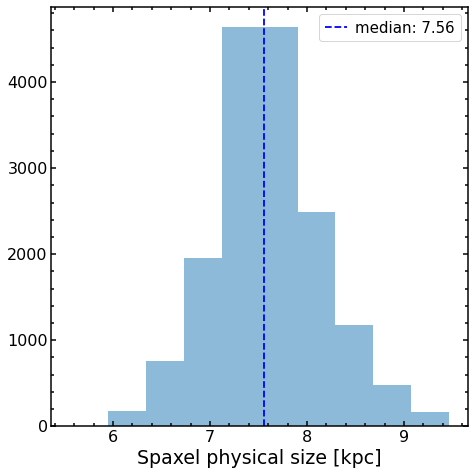

In [104]:
fig, ax = plt.subplots(figsize=(7,7))#,sharey='row')
ax.hist(np.log10(Database_SF['S_Mstar']),alpha=0.5)#,label=r'H$\alpha$ SFR')#,bins=np.linspace(-6,0,31))
median = np.nanmedian(np.log10(Database_SF['S_Mstar']))
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
#ax.hist(Database['log_S_SFR_D4'],alpha=0.5,label=r'D4000 SFR',bins=np.linspace(-6.,0,31))
#median = np.nanmedian(Database['log_S_SFR_D4'])
#ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'Spaxel physical size [kpc]')#,size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

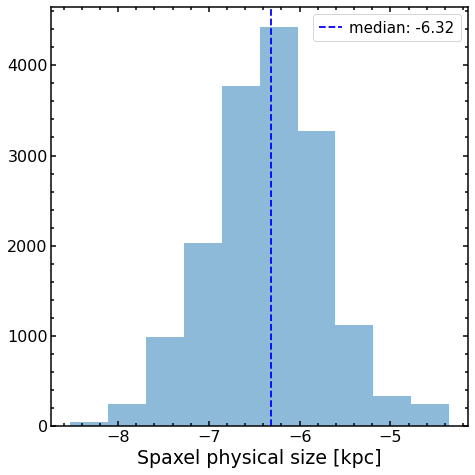

In [130]:
fig, ax = plt.subplots(figsize=(7,7))#,sharey='row')
ax.hist(np.log10(Database_SF['eS_Mstar']/Database_SF['S_Mstar']/np.log(10)),alpha=0.5)#,label=r'H$\alpha$ SFR')#,bins=np.linspace(-6,0,31))
median = np.nanmedian(np.log10(Database_SF['eS_Mstar']/Database_SF['S_Mstar']/np.log(10)))
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
#ax.hist(Database['log_S_SFR_D4'],alpha=0.5,label=r'D4000 SFR',bins=np.linspace(-6.,0,31))
#median = np.nanmedian(Database['log_S_SFR_D4'])
#ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'Spaxel physical size [kpc]')#,size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

/tmp/ipykernel_1058335/3144681455.py:3: RuntimeWarning: invalid value encountered in log10
  y = np.log10(Database_SF['S_SFR'].to_numpy())


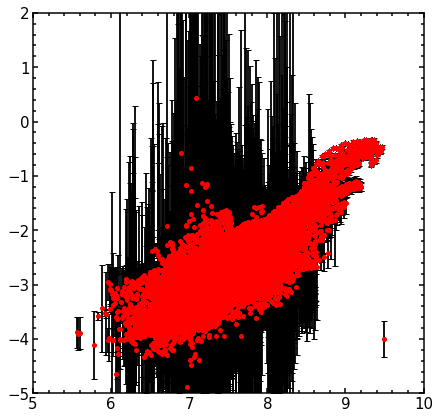

In [28]:
fig,ax = plt.subplots(figsize=(7,7),sharex='row',sharey='row')
x = np.log10(Database_SF['S_Mstar'].to_numpy())
y = np.log10(Database_SF['S_SFR'].to_numpy())
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar(x,y,xerr=xerr,yerr=yerr,fmt='.',mfc='r',mec='r',ecolor='k')
ax.errorbar([9.5],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_xlim(5,10)
ax.set_ylim(-5,2)
#ax[1].scatter(S_Mstar_rep,S_F_Ha_rep,s=0.5)
plt.show()

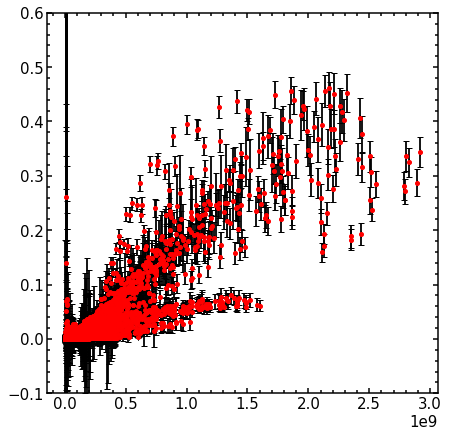

In [44]:
fig,ax = plt.subplots(figsize=(7,7),sharex='row',sharey='row')
x = Database_SF['S_Mstar'].to_numpy()
y = Database_SF['S_SFR'].to_numpy()
xerr = Database_SF['eS_Mstar'].to_numpy()
yerr = Database_SF['eS_SFR'].to_numpy()
ax.errorbar(x,y,xerr=xerr,yerr=yerr,fmt='.',mfc='r',mec='r',ecolor='k')
#ax.set_xlim(5,10)
ax.set_ylim(-0.1,0.6)
#ax[1].scatter(S_Mstar_rep,S_F_Ha_rep,s=0.5)
plt.show()

/tmp/ipykernel_2640224/532267589.py:3: RuntimeWarning: invalid value encountered in log10
  y = np.log10(Database_SF['S_SFR'].to_numpy())


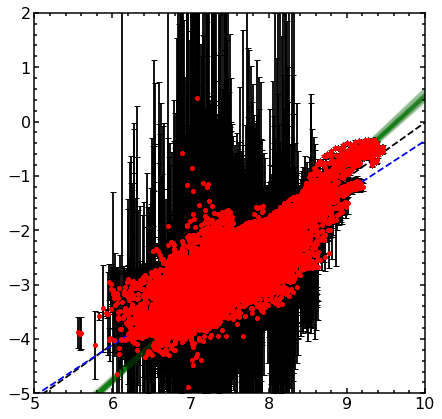

In [129]:
fig,ax = plt.subplots(figsize=(7,7),sharex='row',sharey='row')
x = np.log10(Database_SF['S_Mstar'].to_numpy())
y = np.log10(Database_SF['S_SFR'].to_numpy())
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar(x,y,xerr=xerr,yerr=yerr,fmt='.',mfc='r',mec='r',ecolor='k')
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='b',ls='--',label='OLS fit'+f', $m$={pearson.slope:.2}')
for i in range(0, len(lm.chain), 500):
    xs = np.arange(5,11)
    ys = lm.chain[i]['alpha'] + xs * lm.chain[i]['beta']
    ax.plot(xs, ys, color='g', alpha=0.01)
#plt.show()
ax.set_xlim(5,10)
ax.set_ylim(-5,2)
#ax[1].scatter(S_Mstar_rep,S_F_Ha_rep,s=0.5)
plt.show()

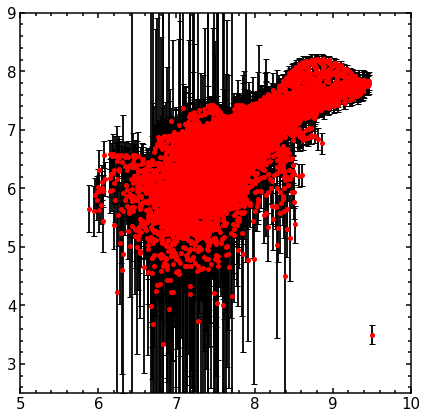

In [29]:
fig,ax = plt.subplots(figsize=(7,7),sharex='row',sharey='row')
x = np.log10(Database_SF['S_Mstar'].to_numpy())
y = np.log10(Database_SF['S_mol_O3'].to_numpy())
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_mol_O3']/Database_SF['S_mol_O3']).to_numpy()/np.log(10)
ax.errorbar(x,y,xerr=xerr,yerr=yerr,fmt='.',mfc='r',mec='r',ecolor='k')
ax.errorbar([9.5],[3.5],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_xlim(5,10)
ax.set_ylim(2.5,9.)
#ax[1].scatter(S_Mstar_rep,S_F_Ha_rep,s=0.5)
plt.show()

/tmp/ipykernel_1058335/2300182118.py:3: RuntimeWarning: invalid value encountered in log10
  y = np.log10(Database_SF['S_SFR'].to_numpy())


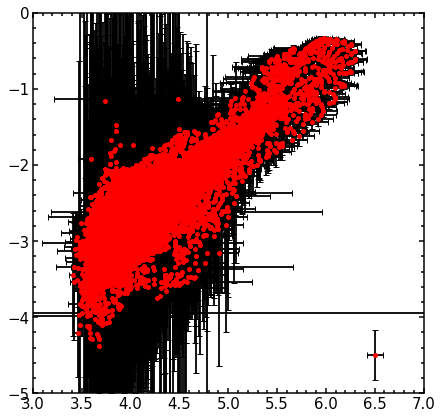

In [32]:
fig,ax = plt.subplots(figsize=(7,7),sharex='row',sharey='row')
x = np.log10(Database_SF['P_h_O3'].to_numpy())
y = np.log10(Database_SF['S_SFR'].to_numpy())
xerr = (Database_SF['eP_h_O3']/Database_SF['P_h_O3']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar(x,y,xerr=xerr,yerr=yerr,fmt='.',mfc='r',mec='r',ecolor='k')
ax.errorbar([6.5],[-4.5],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_xlim(3,7)
ax.set_ylim(-5,0)
#ax[1].scatter(S_Mstar_rep,S_F_Ha_rep,s=0.5)
plt.show()

In [242]:
Database['SFR'] = Database['S_SFR_final']*Database['Area_kpc2']
#Database_SF['SFR'] = Database_SF['S_SFR_final']*Database_SF['Area_kpc2']
#Database_passive['SFR'] = Database_passive['S_SFR_final']*Database_passive['Area_kpc2']

In [243]:
Database_SF = Database[np.floor(Database['Ha_mask'])==1].copy()
#Database_SF = Database[np.floor(Database['SF_mask'])==1].copy()
Database_passive = Database[np.floor(Database['Ha_mask'])!=1].copy()
#Database_passive_D4 = Database[(np.floor(Database['Ha_mask'])!=1)&(np.floor(Database['D4_mask'])==1)].copy()

In [21]:
print(len(Database))

67869


In [17]:
print(len(Database_SF))
print(len(Database_SF[Database_SF['S_SFR']>0]))
print(len(Database_SF[np.isfinite(Database_SF['CO_int'])]))
print(len(Database_SF[Database_SF['S_mol_O3']>0]))
print(len(Database_SF[(Database_SF['S_mol_O3']>0)&(Database_SF['S_SFR']>0)]))

16488
16459
12449
12344
12333


In [18]:
print(len(Database_passive))
print(len(Database_passive[(Database_passive['S_SFR_D4']>0)&(Database_passive['D4_mask']==1)]))
print(len(Database_passive[np.isfinite(Database_passive['CO_int'])]))
print(len(Database_passive[Database_passive['S_mol_O3']>0]))
print(len(Database_passive[(Database_passive['S_mol_O3']>0)&(Database_passive['S_SFR_D4']>0)&(Database_passive['D4_mask']==1)]))

51381
29382
20086
19675
12692


In [206]:
print(len(Database_passive))
print(len(Database_passive[(Database_passive['S_SFR_D4']>0)]))#&(Database_passive['D4_mask']==1)]))
print(len(Database_passive[np.isfinite(Database_passive['CO_int'])]))
print(len(Database_passive[Database_passive['S_mol_O3']>0]))
print(len(Database_passive[(Database_passive['S_mol_O3']>0)&(Database_passive['S_SFR_D4']>0)]))#&(Database_passive['D4_mask']==1)]))
print(len(Database_passive[(Database_passive['S_mol_O3']>0)&(Database_passive['S_SFR_D4']/Database_passive['S_Mstar']<10**-11)]))#&(Database_passive['D4_mask']==1)]))

51381
51381
20086
19675
19675
1246


In [256]:
print('Sources with CO detection: ',len(np.unique(Database.loc[np.isfinite(Database['CO_int']),'Source'])))
print(np.unique(Database.loc[np.isfinite(Database['CO_int']),'Source']))

Sources with CO detection:  29
['CGCG429-012' 'IC1528' 'IC2341' 'MCG-01-52-012' 'MCG-02-02-030' 'NGC0001'
 'NGC0171' 'NGC0180' 'NGC0693' 'NGC0768' 'NGC1056' 'NGC1542' 'NGC2449'
 'NGC2540' 'NGC2554' 'NGC2595' 'NGC7311' 'NGC7321' 'NGC7364' 'NGC7466'
 'NGC7489' 'NGC7625' 'NGC7716' 'UGC00312' 'UGC08781' 'UGC11680NED02'
 'UGC12224' 'UGC12250' 'UGC12348']


In [259]:
29/40

0.725

In [ ]:
print(np.unique(Database.loc[np.isfinite(Database['CO_int']),'Source']))
print(len(np.unique(Database.loc[np.isfinite(Database['CO_int']),'Source'])))

['CGCG429-012' 'IC1528' 'IC2341' 'MCG-01-52-012' 'MCG-02-02-030' 'NGC0001'
 'NGC0171' 'NGC0180' 'NGC0693' 'NGC0768' 'NGC1056' 'NGC1542' 'NGC2449'
 'NGC2540' 'NGC2554' 'NGC2595' 'NGC7311' 'NGC7321' 'NGC7364' 'NGC7466'
 'NGC7489' 'NGC7625' 'NGC7716' 'UGC00312' 'UGC08781' 'UGC11680NED02'
 'UGC12224' 'UGC12250' 'UGC12348']
29


In [205]:
(19675-12692)/19675

0.3549174078780178

In [250]:
P_cutoff = 5.
print(Database.loc[Database['log_P_h_O3']<=P_cutoff,'SFR'].count(),
      Database.loc[Database['log_P_h_O3']> P_cutoff,'SFR'].count())
print(Database.loc[Database['log_P_h_O3']<=P_cutoff,'SFR'].sum(),
      Database.loc[Database['log_P_h_O3']> P_cutoff,'SFR'].sum())

23559 1477
24.955156657440394 11.700905913632148


In [252]:
print(1477/(16488+51381))
print(11.7/(11.7+25))

0.021762513076662392
0.31880108991825606


In [ ]:
print(1477/(1477+23559))
print(11.7/(11.7+25))

0.05899504713212973
0.31880108991825606


In [247]:
P_cutoff = 5.5
print(Database.loc[Database['log_P_h_O3']<=P_cutoff,'SFR'].count(),
      Database.loc[Database['log_P_h_O3']> P_cutoff,'SFR'].count())
print(Database.loc[Database['log_P_h_O3']<=P_cutoff,'SFR'].sum(),
      Database.loc[Database['log_P_h_O3']> P_cutoff,'SFR'].sum())

24539 497
31.816466075442968 4.839596495629577


In [248]:
print(Database_SF.loc[Database_SF['log_P_h_O3']<=P_cutoff,'SFR'].count(),
      Database_SF.loc[Database_SF['log_P_h_O3']> P_cutoff,'SFR'].count())
print(Database_SF.loc[Database_SF['log_P_h_O3']<=P_cutoff,'SFR'].sum(),
      Database_SF.loc[Database_SF['log_P_h_O3']> P_cutoff,'SFR'].sum())

11864 480
21.80809614320821 4.832047875649705


In [249]:
print(Database_passive.loc[Database_passive['log_P_h_O3']<=P_cutoff,'SFR'].count(),
      Database_passive.loc[Database_passive['log_P_h_O3']> P_cutoff,'SFR'].count())
print(Database_passive.loc[Database_passive['log_P_h_O3']<=P_cutoff,'SFR'].sum(),
      Database_passive.loc[Database_passive['log_P_h_O3']> P_cutoff,'SFR'].sum())

12675 17
10.008369932234759 0.007548619979871075


In [33]:
print(np.unique(Database_SF.loc[Database_SF['log_P_h_O3']>P_cutoff,'Source']))
print(np.unique(Database_passive.loc[Database_passive['log_P_h_O3']>P_cutoff,'Source']))

['IC1528' 'NGC0001' 'NGC0693' 'NGC1056' 'NGC1542' 'NGC2540' 'NGC2595'
 'NGC7364' 'NGC7466' 'NGC7625' 'UGC11680NED02' 'UGC12348']
['IC1528' 'NGC0001' 'NGC0171' 'NGC1542' 'NGC2449' 'NGC2540' 'NGC2554'
 'NGC2595' 'NGC7364' 'NGC7466' 'NGC7625' 'UGC11680NED02' 'UGC12348']


In [22]:
total_bysource = Database.groupby('Source')
SF_bysource    = Database_SF.groupby('Source')
passive_bysource = Database_passive.groupby('Source')

In [23]:
total_byQS = Database.groupby('Final_QS')
total_byQS.count()['Source']

Final_QS
MX      9146
QnR     8290
SF     21961
cQ     10209
fR      9982
nR      8281
Name: Source, dtype: int64

In [26]:
total_byQS.groups

{'MX': [792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 870, 871, 872, 873, 874, 875, 876, 877, 878, 879, 880, 881, 882, 883, 884, 885, 886, 887, 888, 889, 890, 891, ...], 'QnR': [7054, 7055, 7056, 7057, 7058, 7059, 7060, 7061, 7062, 7063, 7064, 7065, 7066, 7067, 7068, 7069, 7070, 7071, 7072, 7073, 7074, 7075, 7076, 7077, 7078, 7079, 7080, 7081, 7082, 7083, 7084, 7085, 7086, 7087, 7088, 7089, 7090, 7091, 7092, 7093, 7094, 7095, 7096, 7097, 7098, 7099, 7100, 7101, 7102, 7103, 7104, 7105, 7106, 7107, 7108, 7109, 7110, 7111, 7112, 7113, 7114, 7115, 7116, 7117, 7118, 7119, 7120, 7121, 7122, 7123, 7124, 7125, 7126, 7127, 7128, 7129, 7130, 7131, 7132, 7133

In [24]:
for name in total_byQS.groups:
    print (name,len(np.unique(total_byQS.get_group(name)['Source'])))
    #print (total_byQS.get_group(name))
    #print (len(np.unique(total_byQS.get_group(name)['Source'])))

MX 6
QnR 4
SF 13
cQ 6
fR 6
nR 5


In [25]:
SF_byQS = Database_SF.groupby('Final_QS')
SF_byQS.count()['Source']

Final_QS
MX       557
QnR     2516
SF     10231
cQ      3137
fR         7
nR        40
Name: Source, dtype: int64

In [36]:
SF_byQS = Database_SF[np.isfinite(Database_SF['S_mol_O3'])&np.isfinite(Database_SF['S_SFR'])].groupby('Final_QS')
SF_byQS.count()['Source']

Final_QS
MX      326
QnR    1776
SF     8518
cQ     1721
fR        0
nR        3
Name: Source, dtype: int64

In [26]:
passive_byQS = Database_passive.groupby('Final_QS')
passive_byQS.count()['Source']

Final_QS
MX      8589
QnR     5774
SF     11730
cQ      7072
fR      9975
nR      8241
Name: Source, dtype: int64

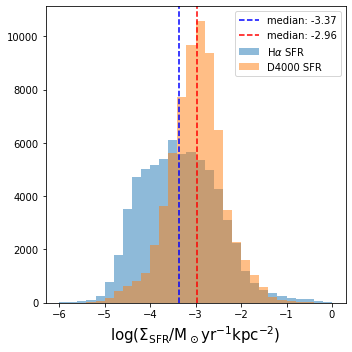

In [24]:
fig, ax = plt.subplots(figsize=(5,5))#,sharey='row')
ax.hist(Database['log_S_SFR'],alpha=0.5,label=r'H$\alpha$ SFR',bins=np.linspace(-6,0,31))
median = np.nanmedian(Database['log_S_SFR'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.hist(Database['log_S_SFR_D4'],alpha=0.5,label=r'D4000 SFR',bins=np.linspace(-6.,0,31))
median = np.nanmedian(Database['log_S_SFR_D4'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

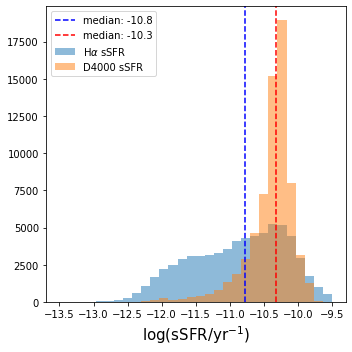

In [18]:
fig, ax = plt.subplots(figsize=(5,5))#,sharey='row')
ax.hist(Database['log_sSFR'],alpha=0.5,label=r'H$\alpha$ sSFR',bins=np.linspace(-13.5,-9.5,31))
median = np.nanmedian(Database['log_sSFR'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.hist(Database['log_sSFR_D4'],alpha=0.5,label=r'D4000 sSFR',bins=np.linspace(-13.5,-9.5,31))
median = np.nanmedian(Database['log_sSFR_D4'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'log(sSFR/yr$^{-1}$)',size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

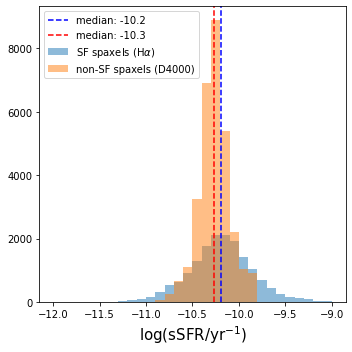

In [30]:
fig, ax = plt.subplots(figsize=(5,5))#,sharey='row')
ax.hist(Database_SF['log_sSFR'],alpha=0.5,label=r'SF spaxels (H$\alpha$)',bins=np.linspace(-12,-9.,31))
median = np.nanmedian(Database_SF['log_sSFR'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.hist(Database_passive['log_sSFR_D4'],alpha=0.5,label=r'passive spaxels (D4000)',bins=np.linspace(-12,-9.,31))
median = np.nanmedian(Database_passive['log_sSFR_D4'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'log(sSFR/yr$^{-1}$)',size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

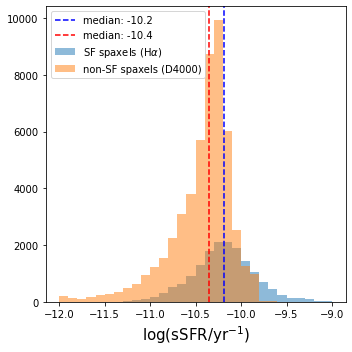

In [19]:
fig, ax = plt.subplots(figsize=(5,5))#,sharey='row')
ax.hist(Database_SF['log_sSFR'],alpha=0.5,label=r'SF spaxels (H$\alpha$)',bins=np.linspace(-12,-9.,31))
median = np.nanmedian(Database_SF['log_sSFR'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.hist(Database_passive['log_sSFR_D4'],alpha=0.5,label=r'passive spaxels (D4000)',bins=np.linspace(-12,-9.,31))
median = np.nanmedian(Database_passive['log_sSFR_D4'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'log(sSFR/yr$^{-1}$)',size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

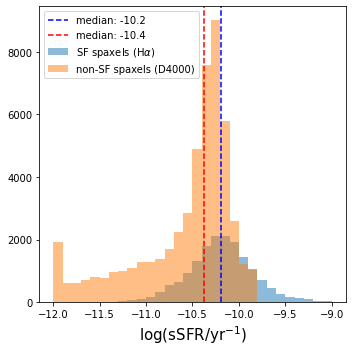

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))#,sharey='row')
ax.hist(Database_SF['log_sSFR'],alpha=0.5,label=r'SF spaxels (H$\alpha$)',bins=np.linspace(-12,-9.,31))
median = np.nanmedian(Database_SF['log_sSFR'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.hist(Database_passive['log_sSFR_D4'],alpha=0.5,label=r'passive spaxels (D4000)',bins=np.linspace(-12,-9.,31))
median = np.nanmedian(Database_passive['log_sSFR_D4'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'log(sSFR/yr$^{-1}$)',size=15)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

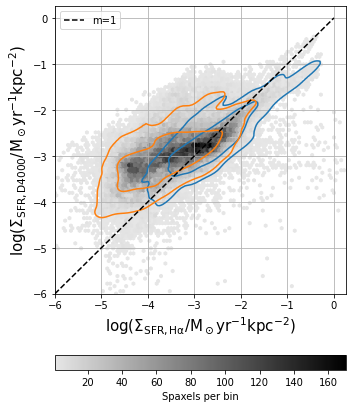

In [31]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
im = ax.hexbin(Database['log_S_SFR'],Database['log_S_SFR_D4'],mincnt=1,extent=(-6,0.25,-6,0.25),cmap=cmap_grey)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_SFR",y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="log_S_SFR",y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
ax.plot([-6,0.],[-6,0.],c='k',ls='--',label='m=1')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR,H\alpha}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlim(-6,0.25)
ax.set_ylim(-6,0.25)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

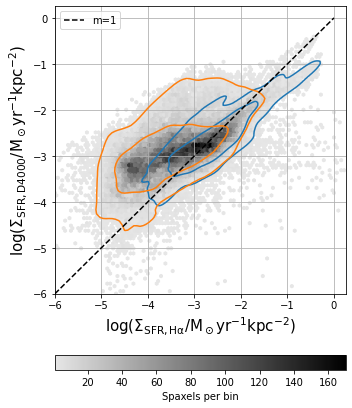

In [20]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
im = ax.hexbin(Database['log_S_SFR'],Database['log_S_SFR_D4'],mincnt=1,extent=(-6,0.25,-6,0.25),cmap=cmap_grey)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_SFR",y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="log_S_SFR",y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
ax.plot([-6,0.],[-6,0.],c='k',ls='--',label='m=1')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR,H\alpha}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlim(-6,0.25)
ax.set_ylim(-6,0.25)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

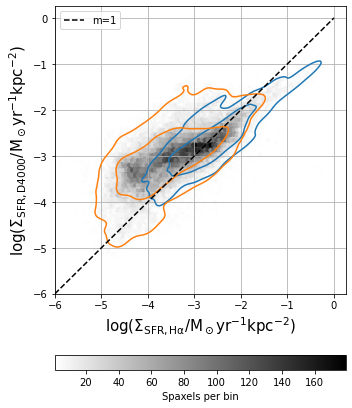

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
im = ax.hexbin(Database['log_S_SFR'],Database['log_S_SFR_D4'],mincnt=1,extent=(-6,0.25,-6,0.25),cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_SFR",y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="log_S_SFR",y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
ax.plot([-6,0.],[-6,0.],c='k',ls='--',label='m=1')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR,H\alpha}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlim(-6,0.25)
ax.set_ylim(-6,0.25)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

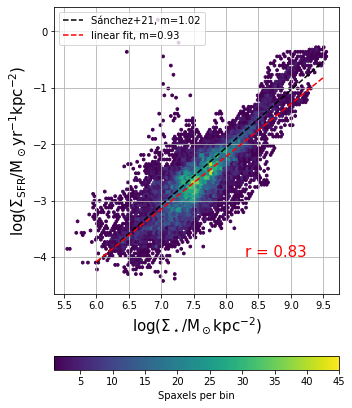

In [33]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'])
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([6.,9.5],[(6.-6)*1.02-10.1+6,(9.5-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='OLS fit'+f', $m$={pearson.slope:.2}')
ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

In [27]:
def f(B, x):
    '''Linear function y = m*x + b'''
    # B is a vector of the parameters.
    # x is an array of the current x values.
    # x is in the same format as the x passed to Data or RealData.
    #
    # Return an array in the same format as y passed to Data or RealData.
    return B[0]*x + B[1]

linear = odr.Model(f)

In [24]:
def f2(B, x):
    '''Power law function y = A * x^m'''
    # B is a vector of the parameters.
    # x is an array of the current x values.
    # x is in the same format as the x passed to Data or RealData.
    #
    # Return an array in the same format as y passed to Data or RealData.
    return B[1]*(x**B[0])

powerlaw = odr.Model(f2)

In [32]:
popt, cov = np.polyfit(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'],1,cov=True)
print(popt[0],np.sqrt(cov[0,0]))
print(popt[1],np.sqrt(cov[1,1]))

0.9389322316555802 0.0049044834172016095
-9.744149882037442 0.037384329096355126


In [33]:
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'])
print(pearson)

LinregressResult(slope=0.9389322316555795, intercept=-9.744149882037444, rvalue=0.8307346796108428, pvalue=0.0, stderr=0.004904483417200413, intercept_stderr=0.03738432909634595)


In [183]:
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_P_h_O3'])
mydata = odr.Data(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR'],
                  wd=1/np.power(Database_SF.loc[mask,'eP_h_O3']/Database_SF.loc[mask,'P_h_O3']/np.log(10),2),
                  we=1/np.power(Database_SF.loc[mask,'eS_SFR']/Database_SF.loc[mask,'S_SFR']/np.log(10),2))
myodr = odr.ODR(mydata, linear, beta0=[1., -6.])

myoutput = myodr.run()
myoutput.pprint()

Beta: [ 1.22367543 -7.75202765]
Beta Std Error: [0.00519808 0.02210693]
Beta Covariance: [[ 8.47507473e-06 -3.56904323e-05]
 [-3.56904323e-05  1.53290016e-04]]
Residual Variance: 3.188182552893374
Inverse Condition #: 0.027325764703202953
Reason(s) for Halting:
  Sum of squares convergence


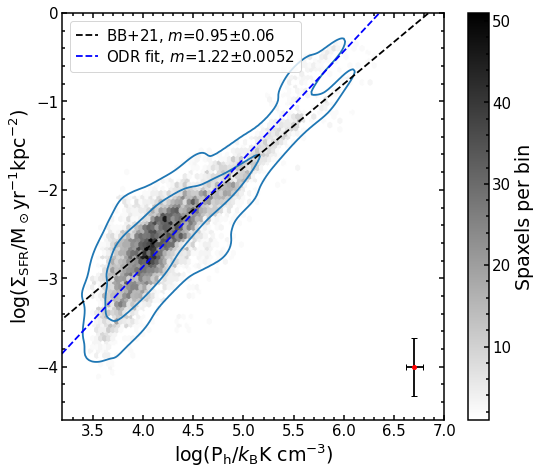

In [199]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_S_SFR_final'])
#pearson = linregress(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
#std = np.nanstd(Database_SF.loc[mask,'log_S_SFR_final'] -(Database_SF.loc[mask,'log_P_h_O3']*pearson.slope + pearson.intercept))
#print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
#print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
#print(f'r = {pearson.rvalue:.2}, std = {std:.3}\n')
slope , intercept = [1.22,-7.75]
eslope , eintercept = [0.0052,0.022]
im = ax.hexbin(Database_SF['log_P_h_O3'],Database_SF['log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF,   x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
#data = Database_passive[Database_passive['D4_mask']==1]
#sns.kdeplot(data,x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
ax.plot([3.,7.],[3.*slope+intercept,7.*slope+intercept],c='b',ls='--',label='ODR fit'+f', $m$={slope:.3}$\pm${eslope:.2}')
#ax.text(3.3,-1,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eP_h_O3']/Database_SF['P_h_O3']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([6.7],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Ph-SFR_ODR')
#fig.savefig(colloquiumpath+'Ph-SFR.png')
plt.show()

In [184]:
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
mydata = odr.Data(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'],
                  wd=1/np.power(Database_SF.loc[mask,'eS_Mstar']/Database_SF.loc[mask,'S_Mstar']/np.log(10),2),
                  we=1/np.power(Database_SF.loc[mask,'eS_SFR']/Database_SF.loc[mask,'S_SFR']/np.log(10),2))
myodr = odr.ODR(mydata, linear, beta0=[1., -10.])

myoutput = myodr.run()
myoutput.pprint()

Beta: [  1.03117921 -10.26942625]
Beta Std Error: [0.00436076 0.03349704]
Beta Covariance: [[ 1.02317176e-06 -7.82278609e-06]
 [-7.82278609e-06  6.03722560e-05]]
Residual Variance: 18.585555663211956
Inverse Condition #: 0.04369491436621958
Reason(s) for Halting:
  Sum of squares convergence


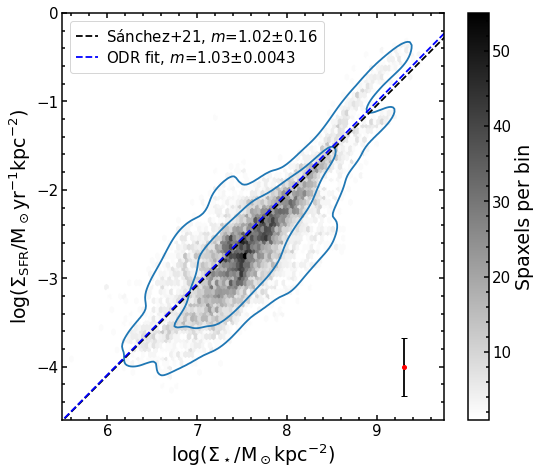

In [196]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
#std = np.nanstd(Database_SF.loc[mask,'log_S_SFR_final'] -(Database_SF.loc[mask,'log_S_Mstar']*pearson.slope + pearson.intercept))
#print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
#print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
#print(f'r = {pearson.rvalue:.2}, std = {std:.3}')
slope , intercept = [1.03,-10.27]
eslope , eintercept = [0.0043,0.033]
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02$\pm$0.16')
ax.plot([5.,10],[5.*slope+intercept,10*slope+intercept],c='b',ls='--',label='ODR fit'+f', $m$={slope:.3}$\pm${eslope:.2}')
#ax.text(5.6,-1,f'$r$ = {pearson.rvalue:.2}',color='b')#,size=15)
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([9.3],[-4.],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0)
#ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-SFR_ODR')
#fig.savefig(colloquiumpath+'Mstar-SFR.png')
plt.show()

In [185]:
mask = np.isfinite(Database_SF['log_S_mol_O3'])&np.isfinite(Database_SF['log_S_Mstar'])
mydata = odr.Data(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3'],
                  wd=1/np.power(Database_SF.loc[mask,'eS_Mstar']/Database_SF.loc[mask,'S_Mstar']/np.log(10),2),
                  we=1/np.power(Database_SF.loc[mask,'eS_mol_O3']/Database_SF.loc[mask,'S_mol_O3']/np.log(10),2))
myodr = odr.ODR(mydata, linear, beta0=[1., .3])

myoutput = myodr.run()
myoutput.pprint()

Beta: [0.73326612 1.14828693]
Beta Std Error: [0.00420091 0.03363537]
Beta Covariance: [[ 5.88881146e-06 -4.70454684e-05]
 [-4.70454684e-05  3.77514305e-04]]
Residual Variance: 2.996808903902313
Inverse Condition #: 0.007440618751181919
Reason(s) for Halting:
  Sum of squares convergence


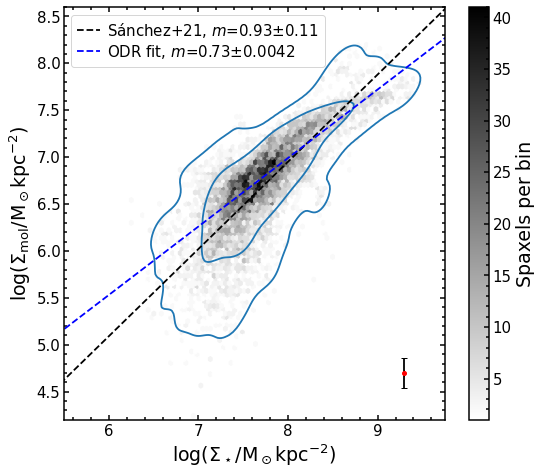

In [201]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF['log_S_mol_O3'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3'])
#std = np.nanstd(Database_SF.loc[mask,'log_S_mol_O3'] -(Database_SF.loc[mask,'log_S_Mstar']*pearson.slope + pearson.intercept))
#print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
#print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
#print(f'r = {pearson.rvalue:.2}, std = {std:.3}')
slope , intercept = [0.73,1.15]
eslope , eintercept = [0.0042,0.034]
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3'],mincnt=1,extent=(5.6,9.8,4.0,8.6),cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_mol_O3",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*0.93-0.91+6,(10-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93$\pm$0.11')
ax.plot([5.,10],[5.*slope+intercept,10*slope+intercept],c='b',ls='--',label='ODR fit'+f', $m$={slope:.2}$\pm${eslope:.2}')
#ax.text(5.6,7.7,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_mol_O3']/Database_SF['S_mol_O3']).to_numpy()/np.log(10)
ax.errorbar([9.3],[4.7],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(5.5,9.75)
ax.set_ylim(4.2,8.6)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-Smol_ODR')
##fig.savefig(colloquiumpath+'Mstar-Smol.png')
plt.show()

In [186]:
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_mol_O3'])
mydata = odr.Data(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR_final'],
                  wd=1/np.power(Database_SF.loc[mask,'eS_mol_O3']/Database_SF.loc[mask,'S_mol_O3']/np.log(10),2),
                  we=1/np.power(Database_SF.loc[mask,'eS_SFR_final']/Database_SF.loc[mask,'S_SFR_final']/np.log(10),2))
myodr = odr.ODR(mydata, linear, beta0=[1., -7])

myoutput = myodr.run()
myoutput.pprint()

Beta: [  1.48444487 -12.50883569]
Beta Std Error: [0.00668555 0.04777076]
Beta Covariance: [[ 3.31287523e-05 -2.36059089e-04]
 [-2.36059089e-04  1.69143161e-03]]
Residual Variance: 1.3491798648056506
Inverse Condition #: 0.009234112349724278
Reason(s) for Halting:
  Sum of squares convergence


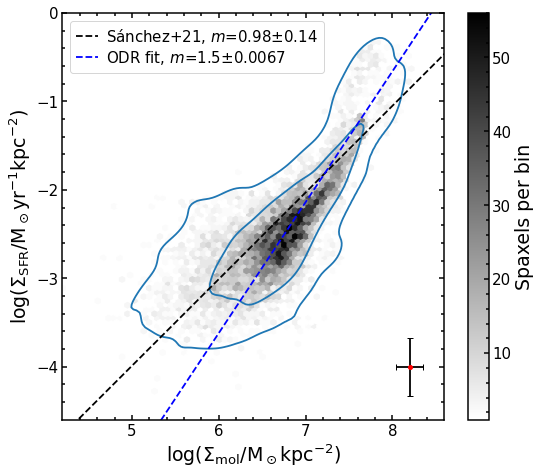

In [203]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_mol_O3'])
#pearson = linregress(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR'])
#std = np.nanstd(Database_SF.loc[mask,'log_S_SFR'] -(Database_SF.loc[mask,'log_S_mol_O3']*pearson.slope + pearson.intercept))
#print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
#print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
#print(f'r = {pearson.rvalue:.2}, std = {std:.3}')
slope , intercept = [1.48,-12.5]
eslope , eintercept = [0.0067,0.048]
im = ax.hexbin(Database_SF['log_S_mol_O3'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_mol_O3",y="log_S_SFR",levels=[.05,.32],ax=ax)
ax.plot([4.,9.],[(4.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.98$\pm$0.14')
ax.plot([4.,9.],[4.*slope+intercept,9.*slope+intercept],c='b',ls='--',label='ODR fit'+f', $m$={slope:.2}$\pm${eslope:.2}')
#ax.text(4.3,-1,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eS_mol_O3']/Database_SF['S_mol_O3']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([8.2],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(4.2,8.6)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Smol-SFR_ODR')
#fig.savefig(colloquiumpath+'Smol-SFR.png')
plt.show()

In [26]:
mask = np.isfinite(Database_SF['S_SFR_final'])&np.isfinite(Database_SF['S_Mstar'])
mydata = odr.Data(Database_SF.loc[mask,'S_Mstar'],Database_SF.loc[mask,'S_SFR'],
                  wd=1/np.power(Database_SF.loc[mask,'eS_Mstar'],2),
                  we=1/np.power(Database_SF.loc[mask,'eS_SFR'],2))
myodr = odr.ODR(mydata, powerlaw, beta0=[1., 10**-10])

myoutput = myodr.run()
myoutput.pprint()

Beta: [6.11517274e-01 2.52198677e-08]
Beta Std Error: [7.69625287e-03 3.31134454e-09]
Beta Covariance: [[ 5.92967177e-06 -2.54693799e-12]
 [-2.54693799e-12  1.09769261e-18]]
Residual Variance: 9.989137770481005
Inverse Condition #: 1.3528942414583973e-05
Reason(s) for Halting:
  Sum of squares convergence


In [44]:
print(pearson)

LinregressResult(slope=0.9389322316555795, intercept=-9.744149882037444, rvalue=0.8307346796108428, pvalue=0.0, stderr=0.004904483417200413, intercept_stderr=0.03738432909634595)


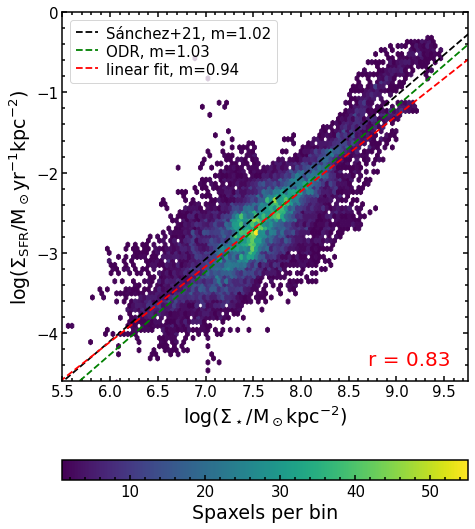

In [32]:
#1.03117921 -10.26942625
fig, ax = plt.subplots(1,1,figsize=(7,8))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'])
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
ax.plot([5.,10],[(5.-6)*1.03117921-10.26942625+6,(10-6)*1.03117921-10.26942625+6],c='g',ls='--',label='ODR'+f', $m$=1.03')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='r',ls='--',label='OLS fit'+f', $m$={pearson.slope:.2}')
ax.text(8.7,-4.4,f'$r$ = {pearson.rvalue:.2}',color='r')#,size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0)
#ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

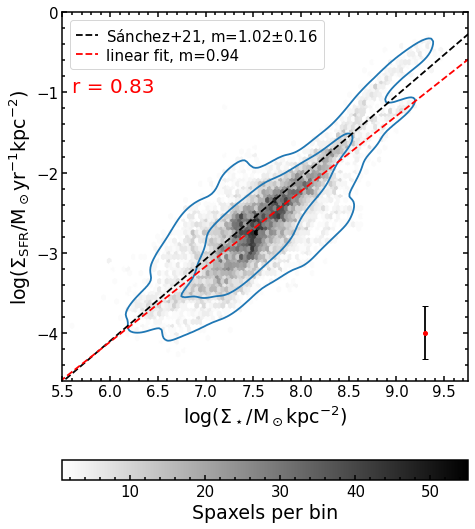

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02$\pm$0.16')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.text(5.6,-1,f'$r$ = {pearson.rvalue:.2}',color='r')#,size=15)
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([9.3],[-4.],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0)
#ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Mstar-SFR')
##fig.savefig(colloquiumpath+'Mstar-SFR.png')
plt.show()

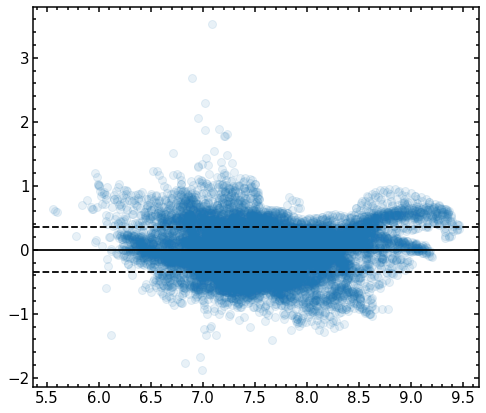

In [69]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
ax.scatter(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'] -(Database_SF.loc[mask,'log_S_Mstar']*pearson.slope + pearson.intercept),
           alpha=0.1)
ax.axhline(0.,c='k')
ax.axhline(std,c='k',ls='--')
ax.axhline(-std,c='k',ls='--')
plt.show()

m = 0.94 +- 0.0049
b = -9.7 +- 0.037
r = 0.83, std = 0.352


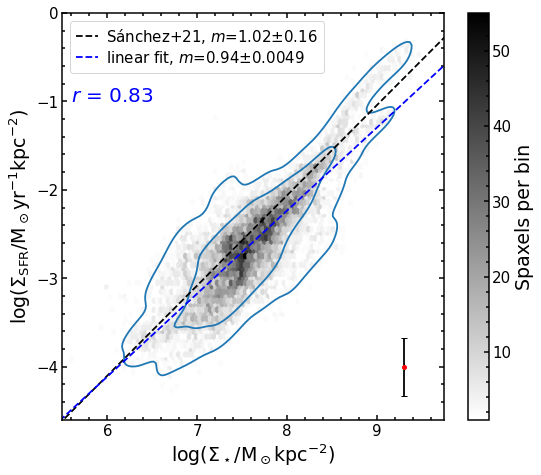

In [193]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
std = np.nanstd(Database_SF.loc[mask,'log_S_SFR_final'] -(Database_SF.loc[mask,'log_S_Mstar']*pearson.slope + pearson.intercept))
print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
print(f'r = {pearson.rvalue:.2}, std = {std:.3}')
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02$\pm$0.16')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}$\pm${pearson.stderr:.2}')
ax.text(5.6,-1,f'$r$ = {pearson.rvalue:.2}',color='b')#,size=15)
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([9.3],[-4.],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0)
#ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-SFR')
#fig.savefig(colloquiumpath+'Mstar-SFR.png')
plt.show()

m = 0.82 +- 0.0066
b = 0.34 +- 0.051
r = 0.75, std = 0.385


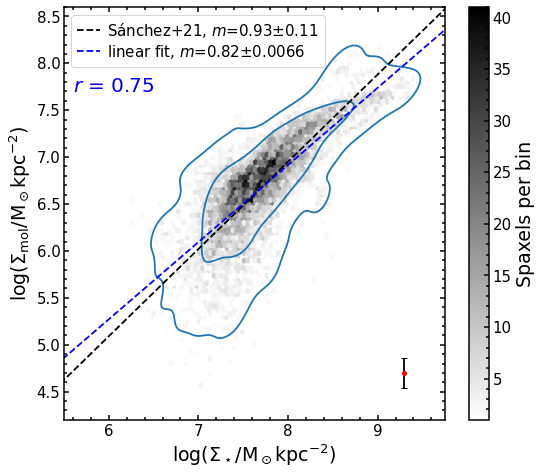

In [71]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3'])
std = np.nanstd(Database_SF.loc[mask,'log_S_mol_O3'] -(Database_SF.loc[mask,'log_S_Mstar']*pearson.slope + pearson.intercept))
print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
print(f'r = {pearson.rvalue:.2}, std = {std:.3}')
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3'],mincnt=1,extent=(5.6,9.8,4.0,8.6),cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_mol_O3",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*0.93-0.91+6,(10-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93$\pm$0.11')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}$\pm${pearson.stderr:.2}')
ax.text(5.6,7.7,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_mol_O3']/Database_SF['S_mol_O3']).to_numpy()/np.log(10)
ax.errorbar([9.3],[4.7],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(5.5,9.75)
ax.set_ylim(4.2,8.6)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-Smol')
##fig.savefig(colloquiumpath+'Mstar-Smol.png')
plt.show()

m = 0.78 +- 0.0064
b = -7.7 +- 0.043
r = 0.74, std = 0.409


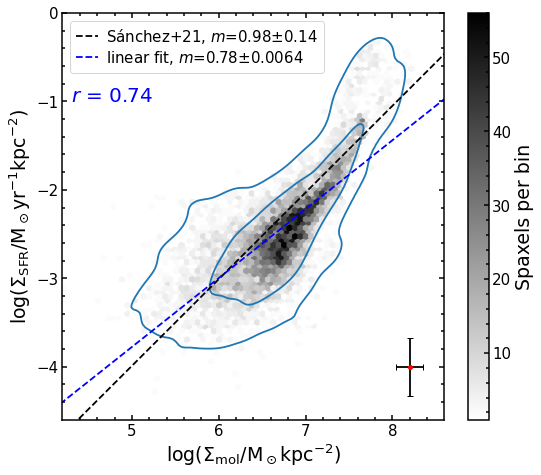

In [72]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson = linregress(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR'])
std = np.nanstd(Database_SF.loc[mask,'log_S_SFR'] -(Database_SF.loc[mask,'log_S_mol_O3']*pearson.slope + pearson.intercept))
print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
print(f'r = {pearson.rvalue:.2}, std = {std:.3}')
im = ax.hexbin(Database_SF['log_S_mol_O3'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_mol_O3",y="log_S_SFR",levels=[.05,.32],ax=ax)
ax.plot([4.,9.],[(4.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.98$\pm$0.14')
ax.plot([4.,9.],[4.*pearson.slope+pearson.intercept,9.*pearson.slope+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}$\pm${pearson.stderr:.2}')
ax.text(4.3,-1,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eS_mol_O3']/Database_SF['S_mol_O3']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([8.2],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(4.2,8.6)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Smol-SFR')
#fig.savefig(colloquiumpath+'Smol-SFR.png')
plt.show()

m = 1.0 +- 0.0053
b = -6.9 +- 0.023
r = 0.87, std = 0.302



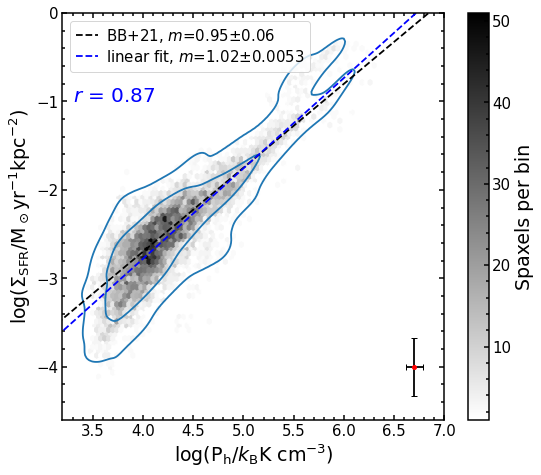

In [73]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_S_SFR_final'])
pearson = linregress(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
std = np.nanstd(Database_SF.loc[mask,'log_S_SFR_final'] -(Database_SF.loc[mask,'log_P_h_O3']*pearson.slope + pearson.intercept))
print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
print(f'b = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
print(f'r = {pearson.rvalue:.2}, std = {std:.3}\n')
im = ax.hexbin(Database_SF['log_P_h_O3'],Database_SF['log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF,   x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
#data = Database_passive[Database_passive['D4_mask']==1]
#sns.kdeplot(data,x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.3}$\pm${pearson.stderr:.2}')
ax.text(3.3,-1,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eP_h_O3']/Database_SF['P_h_O3']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([6.7],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Ph-SFR')
#fig.savefig(colloquiumpath+'Ph-SFR.png')
plt.show()

In [81]:
def convert_beta(logA12,logB21,alpha,alpha_unc,beta,beta_unc):
    beta_new = logA12 + alpha*logB21 + beta
    beta_new_unc = np.sqrt((alpha_unc*logB21)**2 + beta_unc**2)

    return beta_new, beta_new_unc

In [87]:
# SFR-Ph
convert_beta(-3,-4,0.95,0.06,0.3,0.1)

(-6.5, 0.26)

In [ ]:
# rSFMS
convert_beta(6,-6,1.02,0.16,-10.1,0.22)

(-10.219999999999999, 0.9848857801796105)

In [83]:
# rMGMS
convert_beta(6,-6,0.93,0.11,-0.91,0.16)

(-0.4900000000000001, 0.6791170738539858)

In [84]:
# rSK
convert_beta(6,-6,0.98,0.14,-9.01,0.14)

(-8.89, 0.8515867542417508)

In [86]:
print((-4)*b+A-3)
print((-6)*1.02-10.1+6)
print((-6)*0.93-0.91+6)
print((-6)*0.98-9.01+6)

-6.5
-10.219999999999999
-0.4900000000000002
-8.89


## Testing relations using $\alpha_\text{CO}$ from MW

m = 1.0 +- 0.0068
m = -1.4 +- 0.052


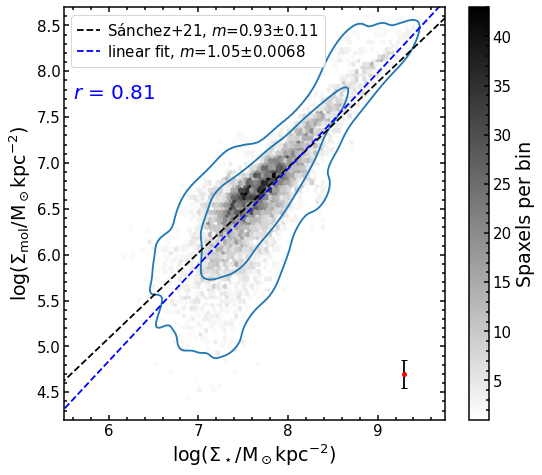

In [54]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF['log_S_mol_MW'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_MW'])
print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
print(f'm = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_MW'],mincnt=1,extent=(5.6,9.8,4.0,8.6),cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_mol_MW",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*0.93-0.91+6,(10-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93$\pm$0.11')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.3}$\pm${pearson.stderr:.2}')
ax.text(5.6,7.7,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eS_Mstar']/Database_SF['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_mol_MW']/Database_SF['S_mol_MW']).to_numpy()/np.log(10)
ax.errorbar([9.3],[4.7],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(5.5,9.75)
ax.set_ylim(4.2,8.7)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-Smol_MW')
#fig.savefig(colloquiumpath+'Mstar-Smol_MW.png')
plt.show()

m = 0.7 +- 0.0051
m = -7.1 +- 0.034


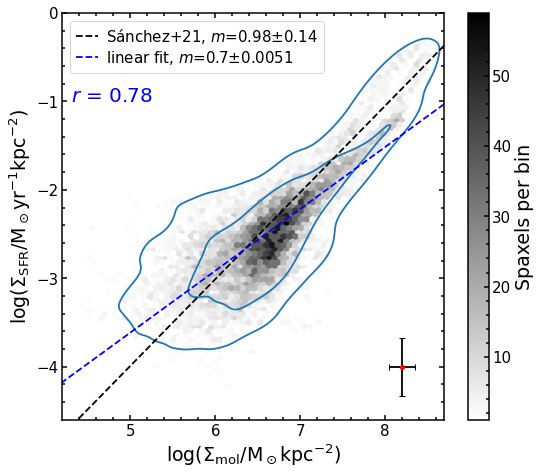

In [55]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_mol_MW'])
pearson = linregress(Database_SF.loc[mask,'log_S_mol_MW'],Database_SF.loc[mask,'log_S_SFR'])
print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
print(f'm = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
im = ax.hexbin(Database_SF['log_S_mol_MW'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_mol_MW",y="log_S_SFR",levels=[.05,.32],ax=ax)
ax.plot([4.,9.],[(4.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.98$\pm$0.14')
ax.plot([4.,9.],[4.*pearson.slope+pearson.intercept,9.*pearson.slope+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}$\pm${pearson.stderr:.2}')
ax.text(4.3,-1,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eS_mol_MW']/Database_SF['S_mol_MW']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([8.2],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(4.2,8.7)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Smol-SFR_MW')
#fig.savefig(colloquiumpath+'Smol-SFR_MW.png')
plt.show()

m = 0.85 +- 0.0044
m = -6.1 +- 0.019


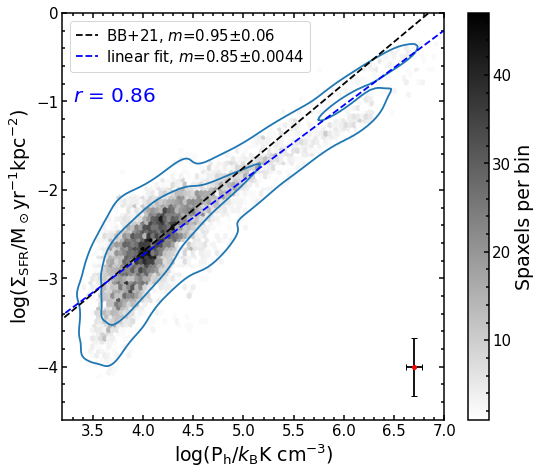

In [56]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_P_h_MW'])&np.isfinite(Database_SF['log_S_SFR_final'])
pearson = linregress(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_S_SFR_final'])
print(f'm = {pearson.slope:.2} +- {pearson.stderr:.2}')
print(f'm = {pearson.intercept:.2} +- {pearson.intercept_stderr:.2}')
im = ax.hexbin(Database_SF['log_P_h_MW'],Database_SF['log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF,   x='log_P_h_MW',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
#data = Database_passive[Database_passive['D4_mask']==1]
#sns.kdeplot(data,x='log_P_h_MW',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}$\pm${pearson.stderr:.2}')
ax.text(3.3,-1,f'$r$ = {pearson.rvalue:.2}',color='b')
xerr = (Database_SF['eP_h_MW']/Database_SF['P_h_MW']).to_numpy()/np.log(10)
yerr = (Database_SF['eS_SFR']/Database_SF['S_SFR']).to_numpy()/np.log(10)
ax.errorbar([6.7],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Ph-SFR_MW')
#fig.savefig(colloquiumpath+'Ph-SFR_MW.png')
plt.show()

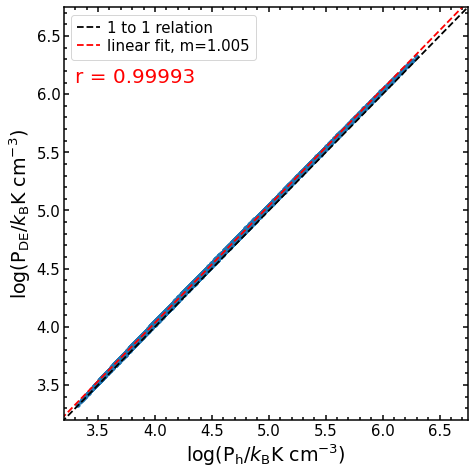

In [66]:
fig, ax = plt.subplots(1,1,figsize=(7,7))
mask = np.isfinite(Database['P_h_O3'])&np.isfinite(Database['P_DE_O3'])
pearson = linregress(np.log10(Database.loc[mask,'P_h_O3']),np.log10(Database.loc[mask,'P_DE_O3']))
#print(pearson)
ax.scatter(np.log10(Database['P_h_O3']).to_numpy(),np.log10(Database['P_DE_O3']).to_numpy(),s=10)
ax.plot([3.,7.],[3.,7.],c='k',ls='--',label='1 to 1 relation')
ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.4}$\pm${pearson.stderr:.2}')
ax.text(3.3,6.1,f'$r$ = {pearson.rvalue:.5}',color='r')
ax.set_ylabel(r'log(P$_\mathrm{DE}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.75)
ax.set_ylim(3.2,6.75)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Ph-PDE')
#fig.savefig(colloquiumpath+'Ph-PDE.png')
plt.show()

In [69]:
rng = np.random.default_rng()
def fit_werrors(x,y,xerr,yerr):
    dev1 = rng.standard_normal(len(x))
    dev2 = rng.standard_normal(len(x))
    pearson = linregress(x+dev1*xerr,y+dev2*yerr)

    return [pearson.slope,pearson.intercept,pearson.rvalue,pearson.pvalue,pearson.stderr,pearson.intercept_stderr]


In [70]:
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_S_SFR_final'])
x = Database_SF.loc[mask,'log_P_h_O3']
y = Database_SF.loc[mask,'log_S_SFR']
xerr = Database_SF.loc[mask,'eP_h_O3']/Database_SF.loc[mask,'P_h_O3']/np.log(10)
yerr = Database_SF.loc[mask,'eS_SFR']/Database_SF.loc[mask,'S_SFR']/np.log(10)

pearsons = np.array([fit_werrors(x,y,xerr,yerr) for i in range(10000)])

In [71]:
pearson_mean = np.mean(pearsons,axis=0)
print(np.median(pearsons,axis=0))
print(pearson_mean)
print(np.std(pearsons,axis=0))

[ 0.905215   -6.36331923  0.51751589  0.          0.01324307  0.05752856]
[ 8.81346023e-01 -6.26181849e+00  4.99283973e-01  2.92356697e-15
  1.38145990e-02  6.00202777e-02]
[1.33901626e-01 5.77161721e-01 7.11452760e-02 2.92342004e-13
 1.93606212e-03 8.39564004e-03]


## Testing relations dividing sample in SF and passive

In [96]:
def print_fit_results(x,y,p):
    std = np.nanstd(y -(x*p.slope + p.intercept))
    print(f'm = {p.slope:.2} +- {p.stderr:.2}')
    print(f'b = {p.intercept:.2} +- {p.intercept_stderr:.2}')
    print(f'r = {p.rvalue:.2}, std = {std:.3}\n')

    return None

m = 1.0 +- 0.0038
b = -6.9 +- 0.016
r = 0.86, std = 0.271

m = 1.0 +- 0.0053
b = -6.9 +- 0.023
r = 0.87, std = 0.302

m = 0.93 +- 0.0064
b = -6.6 +- 0.026
r = 0.79, std = 0.23



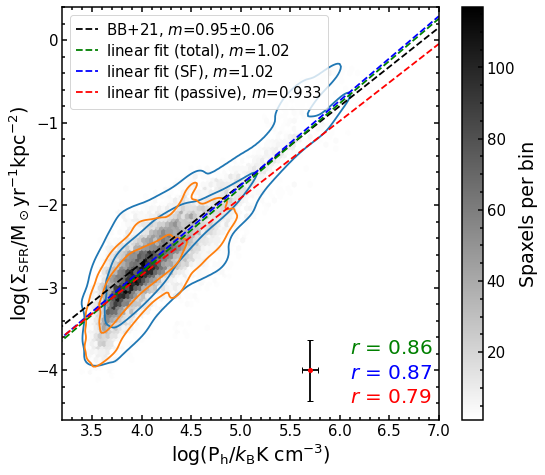

In [102]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
pearson1 = linregress(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'])
print_fit_results(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'],pearson1)
im = ax.hexbin(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_S_SFR_final'])
pearson2 = linregress(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
print_fit_results(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR_final'],pearson2)
mask = np.isfinite(Database_passive['log_P_h_O3'])&np.isfinite(Database_passive['log_S_SFR_final'])&(np.floor(Database_passive['D4_mask'])==1)
pearson3 = linregress(Database_passive.loc[mask,'log_P_h_O3'],Database_passive.loc[mask,'log_S_SFR_final'])
print_fit_results(Database_passive.loc[mask,'log_P_h_O3'],Database_passive.loc[mask,'log_S_SFR_final'],pearson3)
sns.kdeplot(Database_SF,   x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
data = Database_passive[Database_passive['D4_mask']==1]
sns.kdeplot(data,x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
ax.plot([3.,7.],[3.*pearson1.slope+pearson1.intercept,7.*pearson1.slope+pearson1.intercept],c='g',ls='--',label='linear fit (total)'+f', $m$={pearson1.slope:.3}')
ax.plot([3.,7.],[3.*pearson2.slope+pearson2.intercept,7.*pearson2.slope+pearson2.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson2.slope:.3}')
ax.plot([3.,7.],[3.*pearson3.slope+pearson3.intercept,7.*pearson3.slope+pearson3.intercept],c='r',ls='--',label='linear fit (passive)'+f', $m$={pearson3.slope:.3}')
#ax.plot([3.,7.],[3.*pearson_mean[0]+pearson_mean[1],7.*pearson_mean[0]+pearson_mean[1]],c='orange',ls='--',label='with errors'+f', $m$={pearson_mean[0]:.2}')
xerr = (Database['eP_h_O3']/Database['P_h_O3']).to_numpy()/np.log(10)
yerr = (Database['eS_SFR_final']/Database['S_SFR_final']).to_numpy()/np.log(10)
ax.errorbar([5.7],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.text(6.1,-3.8,f'$r$ = {pearson1.rvalue:.2}',color='g')
ax.text(6.1,-4.1,f'$r$ = {pearson2.rvalue:.2}',color='b')
ax.text(6.1,-4.4,f'$r$ = {pearson3.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0.4)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Ph-SFR_types')
#fig.savefig(colloquiumpath+'Ph-SFR_types.png')
plt.show()

m = 1.0 +- 0.0038
b = -6.9 +- 0.016
r = 0.86, std = 0.271

m = 1.0 +- 0.0053
b = -6.9 +- 0.023
r = 0.87, std = 0.302

m = 0.93 +- 0.0064
b = -6.6 +- 0.026
r = 0.79, std = 0.23



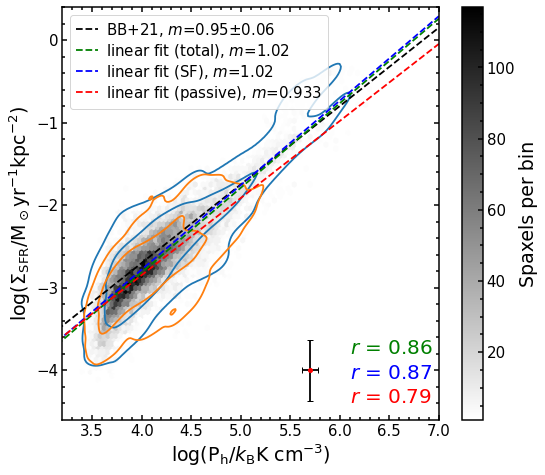

In [104]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
#pearson1 = linregress(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'])
im = ax.hexbin(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_S_SFR_final'])
pearson2 = linregress(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database_passive['log_P_h_O3'])&np.isfinite(Database_passive['log_S_SFR_final'])&(np.floor(Database_passive['D4_mask'])==1)
pearson3 = linregress(Database_passive.loc[mask,'log_P_h_O3'],Database_passive.loc[mask,'log_S_SFR_final'])
sns.kdeplot(Database_SF,   x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
data = Database_passive[Database_passive['D4_mask']==1]
sns.kdeplot(Database_passive,x='log_P_h_O3',y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
#ax.plot([3.,7.],[3.*pearson1.slope+pearson1.intercept,7.*pearson1.slope+pearson1.intercept],c='g',ls='--',label='linear fit (total)'+f', $m$={pearson1.slope:.3}')
ax.plot([3.,7.],[3.*pearson2.slope+pearson2.intercept,7.*pearson2.slope+pearson2.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson2.slope:.3}')
ax.plot([3.,7.],[3.*pearson3.slope+pearson3.intercept,7.*pearson3.slope+pearson3.intercept],c='r',ls='--',label='linear fit (passive)'+f', $m$={pearson3.slope:.3}')
#ax.plot([3.,7.],[3.*pearson_mean[0]+pearson_mean[1],7.*pearson_mean[0]+pearson_mean[1]],c='orange',ls='--',label='with errors'+f', $m$={pearson_mean[0]:.2}')
xerr = (Database['eP_h_O3']/Database['P_h_O3']).to_numpy()/np.log(10)
yerr = (Database['eS_SFR_final']/Database['S_SFR_final']).to_numpy()/np.log(10)
ax.errorbar([5.7],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
#ax.text(6.1,-3.8,f'$r$ = {pearson1.rvalue:.2}',color='g')
ax.text(6.1,-4.1,f'$r$ = {pearson2.rvalue:.2}',color='b')
ax.text(6.1,-4.4,f'$r$ = {pearson3.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0.4)
ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Ph-SFR_types')
#fig.savefig(colloquiumpath+'Ph-SFR_types.png')
plt.show()

In [ ]:
mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF['log_S_SFR_final'])
x = Database_SF.loc[mask,'log_S_Mstar']
y = Database_SF.loc[mask,'log_S_SFR']
xerr = Database_SF.loc[mask,'eS_Mstar']/Database_SF.loc[mask,'S_Mstar']/np.log(10)
yerr = Database_SF.loc[mask,'eS_SFR']/Database_SF.loc[mask,'S_SFR']/np.log(10)

pearsons = np.array([fit_werrors(x,y,xerr,yerr) for i in range(10000)])

In [ ]:
pearson_mean = np.mean(pearsons,axis=0)
print(np.median(pearsons,axis=0))
print(pearson_mean)
print(np.std(pearsons,axis=0))

[ 0.93857696 -9.74154445  0.44737548  0.          0.01462155  0.11145245]
[ 9.38687673e-001 -9.74217497e+000  4.42697801e-001  2.64956722e-212
  1.49263880e-002  1.13776101e-001]
[0.01344657 0.10765172 0.03505142 0.         0.00154637 0.01178718]


m = 0.93 +- 0.0022
b = -9.7 +- 0.017
r = 0.89, std = 0.254

m = 0.94 +- 0.0049
b = -9.7 +- 0.037
r = 0.83, std = 0.352

m = 0.86 +- 0.002
b = -9.3 +- 0.015
r = 0.93, std = 0.163



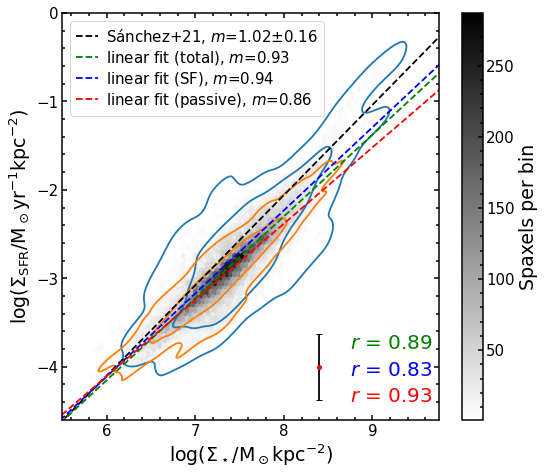

In [105]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson1 = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database_passive['log_S_Mstar'])&np.isfinite(Database_passive['log_S_SFR_final'])&(np.floor(Database_passive['D4_mask'])==1)
pearson2 = linregress(Database_passive.loc[mask,'log_S_Mstar'],Database_passive.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database['log_S_Mstar'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
pearson3 = linregress(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_SFR_final'])
print_fit_results(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_SFR_final'],pearson3)
print_fit_results(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'],pearson1)
print_fit_results(Database_passive.loc[mask,'log_S_Mstar'],Database_passive.loc[mask,'log_S_SFR_final'],pearson2)
im = ax.hexbin(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
data = Database_passive[Database_passive['D4_mask']==1]
sns.kdeplot(data,x='log_S_Mstar',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02$\pm$0.16')
ax.plot([5.,10],[5.*pearson3.slope+pearson3.intercept,10*pearson3.slope+pearson3.intercept],c='g',ls='--',label='linear fit (total)'+f', $m$={pearson3.slope:.2}')
ax.plot([5.,10],[5.*pearson1.slope+pearson1.intercept,10*pearson1.slope+pearson1.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson1.slope:.2}')
ax.plot([5.,10],[5.*pearson2.slope+pearson2.intercept,10*pearson2.slope+pearson2.intercept],c='r',ls='--',label='linear fit (passive)'+f', $m$={pearson2.slope:.2}')
#ax.plot([5.,10],[5.*pearson_mean[0]+pearson_mean[1],10*pearson_mean[0]+pearson_mean[1]],c='orange',ls='--',label='with errors'+f', $m$={pearson_mean[0]:.2}')
xerr = (Database['eS_Mstar']/Database['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database['eS_SFR_final']/Database['S_SFR_final']).to_numpy()/np.log(10)
ax.errorbar([8.4],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.text(8.75,-3.8,f'$r$ = {pearson3.rvalue:.2}',color='g')
ax.text(8.75,-4.1,f'$r$ = {pearson1.rvalue:.2}',color='b')
ax.text(8.75,-4.4,f'$r$ = {pearson2.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0)
#ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-SFR_types')
#fig.savefig(colloquiumpath+'Mstar-SFR_types.png')
plt.show()

In [213]:
Database_Q = Database_passive[Database_passive['D4_mask']<1].copy()

In [218]:
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson1 = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
print_fit_results(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'],pearson1)
#y -(x*p.slope + p.intercept)
Database_Q = Database_passive[Database_passive['log_S_SFR_D4']<(Database_passive['log_S_Mstar']*pearson1.slope + pearson1.intercept - 3*0.352)].copy()
print(len(Database_Q))

m = 0.94 +- 0.0049
b = -9.7 +- 0.037
r = 0.83, std = 0.352

5846


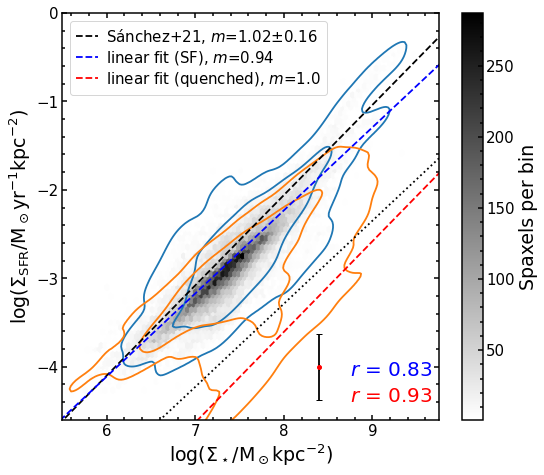

In [232]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson1 = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
#mask = np.isfinite(Database_passive['log_S_Mstar'])&np.isfinite(Database_passive['log_S_SFR_final'])&(np.floor(Database_passive['D4_mask'])==1)
mask = np.isfinite(Database_Q['log_S_Mstar'])&np.isfinite(Database_Q['log_S_SFR_D4'])
pearson2 = linregress(Database_Q.loc[mask,'log_S_Mstar'],Database_Q.loc[mask,'log_S_SFR_D4'])
mask = np.isfinite(Database['log_S_Mstar'])&np.isfinite(Database['log_S_SFR_final'])
im = ax.hexbin(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
#data = Database_passive[Database_passive['D4_mask']==1]
sns.kdeplot(Database_passive,x='log_S_Mstar',y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02$\pm$0.16')
ax.plot([5.,10],[5.*pearson1.slope+pearson1.intercept,10*pearson1.slope+pearson1.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson1.slope:.2}')
ax.plot([5.,10],[5.*pearson1.slope+pearson1.intercept-3*0.352,10*pearson1.slope+pearson1.intercept-3*0.352],c='k',ls=':')#,label='linear fit (SF)'+f', $m$={pearson1.slope:.2}')
ax.plot([5.,10],[5.*pearson2.slope+pearson2.intercept,10*pearson2.slope+pearson2.intercept],c='r',ls='--',label='linear fit (quenched)'+f', $m$={pearson2.slope:.2}')
xerr = (Database['eS_Mstar']/Database['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database['eS_SFR_final']/Database['S_SFR_final']).to_numpy()/np.log(10)
ax.errorbar([8.4],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.text(8.75,-4.1,f'$r$ = {pearson1.rvalue:.2}',color='b')
ax.text(8.75,-4.4,f'$r$ = {pearson2.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0)
#ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-SFR_quenched')
#fig.savefig(colloquiumpath+'Mstar-SFR_types.png')
plt.show()

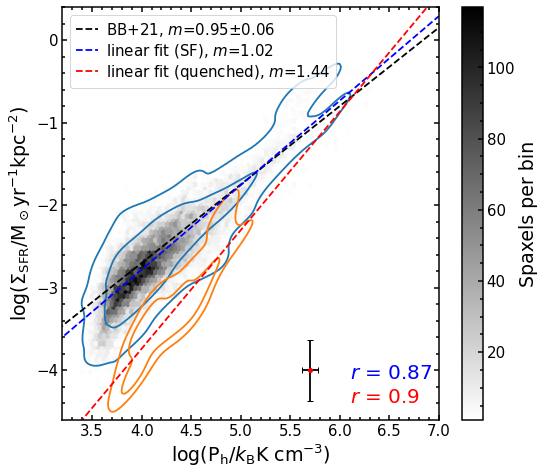

In [233]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
#pearson1 = linregress(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'])
im = ax.hexbin(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_S_SFR_final'])
pearson2 = linregress(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
#mask = np.isfinite(Database_passive['log_P_h_O3'])&np.isfinite(Database_passive['log_S_SFR_final'])&(np.floor(Database_passive['D4_mask'])==1)
#pearson3 = linregress(Database_passive.loc[mask,'log_P_h_O3'],Database_passive.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database_Q['log_P_h_O3'])&np.isfinite(Database_Q['log_S_SFR_D4'])
pearson3 = linregress(Database_Q.loc[mask,'log_P_h_O3'],Database_Q.loc[mask,'log_S_SFR_D4'])
sns.kdeplot(Database_SF,   x='log_P_h_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
data = Database_passive[Database_passive['D4_mask']==1]
#sns.kdeplot(Database_passive,x='log_P_h_O3',y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_Q,x='log_P_h_O3',y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
#ax.plot([3.,7.],[3.*pearson1.slope+pearson1.intercept,7.*pearson1.slope+pearson1.intercept],c='g',ls='--',label='linear fit (total)'+f', $m$={pearson1.slope:.3}')
ax.plot([3.,7.],[3.*pearson2.slope+pearson2.intercept,7.*pearson2.slope+pearson2.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson2.slope:.3}')
ax.plot([3.,7.],[3.*pearson3.slope+pearson3.intercept,7.*pearson3.slope+pearson3.intercept],c='r',ls='--',label='linear fit (quenched)'+f', $m$={pearson3.slope:.3}')
#ax.plot([3.,7.],[3.*pearson3.slope+pearson3.intercept,7.*pearson3.slope+pearson3.intercept],c='r',ls='--',label='linear fit (passive)'+f', $m$={pearson3.slope:.3}')
xerr = (Database['eP_h_O3']/Database['P_h_O3']).to_numpy()/np.log(10)
yerr = (Database['eS_SFR_final']/Database['S_SFR_final']).to_numpy()/np.log(10)
ax.errorbar([5.7],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
#ax.text(6.1,-3.8,f'$r$ = {pearson1.rvalue:.2}',color='g')
ax.text(6.1,-4.1,f'$r$ = {pearson2.rvalue:.2}',color='b')
ax.text(6.1,-4.4,f'$r$ = {pearson3.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0.4)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Ph-SFR_quenched')
#fig.savefig(colloquiumpath+'Ph-SFR_types.png')
plt.show()

In [ ]:
print(len(Database_passive))
print(len(Database_passive[(Database_passive['S_SFR_D4']>0)]))#&(Database_passive['D4_mask']==1)]))
print(len(Database_passive[np.isfinite(Database_passive['CO_int'])]))
print(len(Database_passive[Database_passive['S_mol_O3']>0]))
print(len(Database_passive[(Database_passive['S_mol_O3']>0)&(Database_passive['S_SFR_D4']>0)]))#&(Database_passive['D4_mask']==1)]))
print(len(Database_passive[(Database_passive['S_mol_O3']>0)&(Database_passive['S_SFR_D4']/Database_passive['S_Mstar']<10**-11)]))#&(Database_passive['D4_mask']==1)]))

51381
51381
20086
19675
19675
1246


In [221]:
print(len(Database_Q))
print(len(Database_Q[(Database_Q['S_SFR_D4']>0)]))#&(Database_passive['D4_mask']==1)]))
print(len(Database_Q[np.isfinite(Database_Q['CO_int'])]))
print(len(Database_Q[Database_Q['S_mol_O3']>0]))
print(len(Database_Q[(Database_Q['S_mol_O3']>0)&(Database_Q['S_SFR_D4']>0)]))#&(Database_passive['D4_mask']==1)]))
print(len(Database_Q[(Database_Q['S_mol_O3']>0)&(Database_Q['S_SFR_D4']/Database_Q['S_Mstar']<10**-11)]))#&(Database_passive['D4_mask']==1)]))

5846
5846
525
513
513
513


In [225]:
print(np.unique(Database_Q.loc[Database_Q['S_mol_O3']>0,'Final_QS']))
Database_Q.groupby(Database_Q['Final_QS']).count()

['MX' 'cQ' 'nR']


,Source,Final_NA,Inclination,PA,Area_kpc2,Re_kpc,Rgal_kpc,RA,DEC,T_gal,...,log_P_h_MW,log_P_h_O3,log_P_h_MW_vdisp,log_P_h_O3_vdisp,S_SFR_final,eS_SFR_final,log_S_SFR_final,log_sSFR_final,log_SFE_O3_final,log_f_CO_O3
Final_QS,,,,,,,,,,,,,,,,,,,,,
MX,670,670,670,670,670,670,670,670,670,670,...,88,84,88,84,0,0,0,0,0,84
QnR,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SF,2,2,2,2,2,2,2,2,2,2,...,0,0,0,0,0,0,0,0,0,0
cQ,127,127,127,127,127,127,127,127,127,127,...,71,71,71,71,0,0,0,0,0,71
fR,3062,3062,3062,3062,3062,3062,3062,3062,3062,3062,...,0,0,0,0,2,2,2,2,0,0
nR,1985,1985,1985,1985,1985,1985,1985,1985,1985,1985,...,366,358,366,358,0,0,0,0,0,358


m = 0.67 +- 0.0049
b = 1.3 +- 0.038
r = 0.61, std = 0.464

m = 0.82 +- 0.0066
b = 0.34 +- 0.051
r = 0.75, std = 0.385

m = 0.55 +- 0.0064
b = 2.1 +- 0.049
r = 0.53, std = 0.473



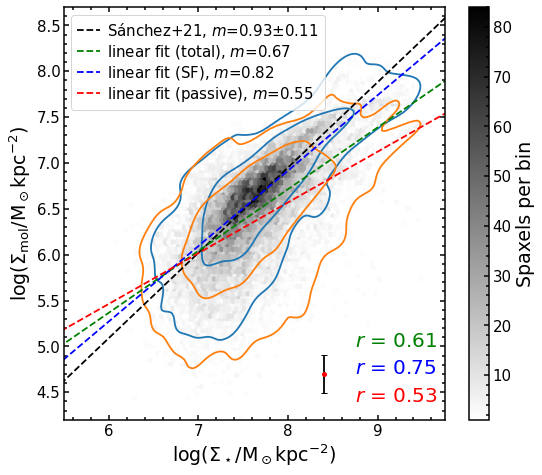

In [107]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson1 = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3'])
mask = np.isfinite(Database_passive['log_S_Mstar'])&np.isfinite(Database_passive['log_S_mol_O3'])
pearson2 = linregress(Database_passive.loc[mask,'log_S_Mstar'],Database_passive.loc[mask,'log_S_mol_O3'])
mask = np.isfinite(Database['log_S_Mstar'])&np.isfinite(Database['log_S_mol_O3'])
pearson3 = linregress(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_mol_O3'])
print_fit_results(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_mol_O3'],pearson3)
print_fit_results(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3'],pearson1)
print_fit_results(Database_passive.loc[mask,'log_S_Mstar'],Database_passive.loc[mask,'log_S_mol_O3'],pearson2)
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3'],mincnt=1,extent=(5.6,9.8,4.0,8.6),cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_mol_O3",levels=[.05,.32],ax=ax)
#data = Database_passive[Database_passive['D4_mask']==1]
sns.kdeplot(Database_passive,x='log_S_Mstar',y="log_S_mol_O3",levels=[.05,.32],ax=ax)
ax.plot([5.,10],[(5.-6)*0.93-0.91+6,(10-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93$\pm$0.11')
ax.plot([5.,10],[5.*pearson3.slope+pearson3.intercept,10*pearson3.slope+pearson3.intercept],c='g',ls='--',label='linear fit (total)'+f', $m$={pearson3.slope:.2}')
ax.plot([5.,10],[5.*pearson1.slope+pearson1.intercept,10*pearson1.slope+pearson1.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson1.slope:.2}')
ax.plot([5.,10],[5.*pearson2.slope+pearson2.intercept,10*pearson2.slope+pearson2.intercept],c='r',ls='--',label='linear fit (passive)'+f', $m$={pearson2.slope:.2}')
xerr = (Database['eS_Mstar']/Database['S_Mstar']).to_numpy()/np.log(10)
yerr = (Database['eS_mol_O3']/Database['S_mol_O3']).to_numpy()/np.log(10)
ax.errorbar([8.4],[4.7],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.text(8.75,5.0,f'$r$ = {pearson3.rvalue:.2}',color='g')
ax.text(8.75,4.7,f'$r$ = {pearson1.rvalue:.2}',color='b')
ax.text(8.75,4.4,f'$r$ = {pearson2.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(5.5,9.75)
ax.set_ylim(4.2,8.7)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Mstar-Smol_types')
#fig.savefig(colloquiumpath+'Mstar-Smol_types.png')
plt.show()

m = 0.63 +- 0.0041
b = -6.7 +- 0.027
r = 0.7, std = 0.386

m = 0.78 +- 0.0064
b = -7.7 +- 0.043
r = 0.74, std = 0.409

m = 0.38 +- 0.0051
b = -5.2 +- 0.032
r = 0.55, std = 0.314



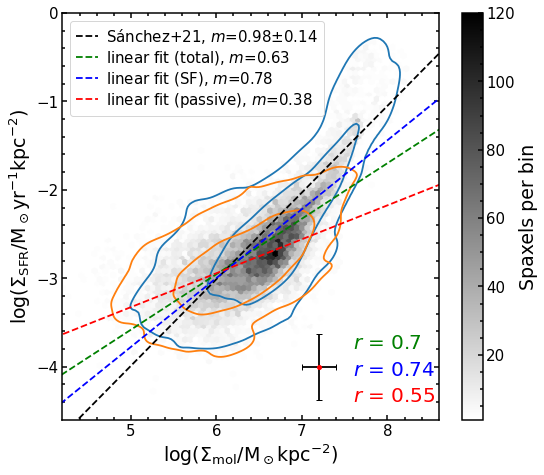

In [108]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson1 = linregress(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database_passive['log_S_mol_O3'])&np.isfinite(Database_passive['log_S_SFR_final'])&(np.floor(Database_passive['D4_mask'])==1)
pearson2 = linregress(Database_passive.loc[mask,'log_S_mol_O3'],Database_passive.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database['log_S_mol_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
pearson3 = linregress(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_S_SFR_final'])
print_fit_results(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_S_SFR_final'],pearson3)
print_fit_results(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR_final'],pearson1)
print_fit_results(Database_passive.loc[mask,'log_S_mol_O3'],Database_passive.loc[mask,'log_S_SFR_final'],pearson2)
im = ax.hexbin(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_mol_O3",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
data = Database_passive[Database_passive['D4_mask']==1]
sns.kdeplot(data,x='log_S_mol_O3',y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([4.,9.],[(4.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.98$\pm$0.14')
ax.plot([4.,9.],[4.*pearson3.slope+pearson3.intercept,9.*pearson3.slope+pearson3.intercept],c='g',ls='--',label='linear fit (total)'+f', $m$={pearson3.slope:.2}')
ax.plot([4.,9.],[4.*pearson1.slope+pearson1.intercept,9.*pearson1.slope+pearson1.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson1.slope:.2}')
ax.plot([4.,9.],[4.*pearson2.slope+pearson2.intercept,9.*pearson2.slope+pearson2.intercept],c='r',ls='--',label='linear fit (passive)'+f', $m$={pearson2.slope:.2}')
xerr = (Database['eS_mol_O3']/Database['S_mol_O3']).to_numpy()/np.log(10)
yerr = (Database['eS_SFR_final']/Database['S_SFR_final']).to_numpy()/np.log(10)
ax.errorbar([7.2],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.text(7.6,-3.8,f'$r$ = {pearson3.rvalue:.2}',color='g')
ax.text(7.6,-4.1,f'$r$ = {pearson1.rvalue:.2}',color='b')
ax.text(7.6,-4.4,f'$r$ = {pearson2.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(4.2,8.6)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
fig.savefig(figurepath+'Smol-SFR_types')
#fig.savefig(colloquiumpath+'Smol-SFR_types.png')
plt.show()

m = 0.63 +- 0.0041
b = -6.7 +- 0.027
r = 0.7, std = 0.386

m = 0.78 +- 0.0064
b = -7.7 +- 0.043
r = 0.74, std = 0.409

m = 0.38 +- 0.0051
b = -5.2 +- 0.032
r = 0.55, std = 0.314



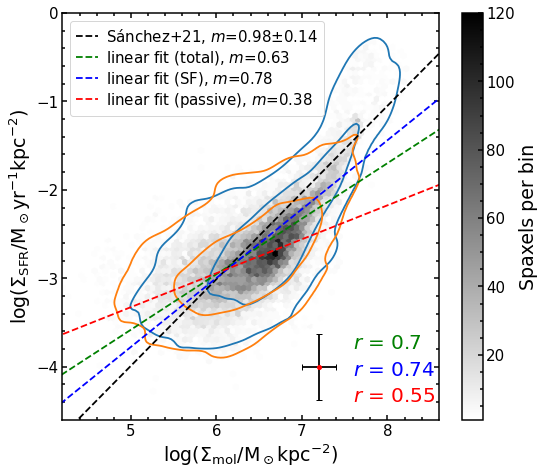

In [109]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson1 = linregress(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database_passive['log_S_mol_O3'])&np.isfinite(Database_passive['log_S_SFR_final'])&(np.floor(Database_passive['D4_mask'])==1)
pearson2 = linregress(Database_passive.loc[mask,'log_S_mol_O3'],Database_passive.loc[mask,'log_S_SFR_final'])
mask = np.isfinite(Database['log_S_mol_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
pearson3 = linregress(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_S_SFR_final'])
print_fit_results(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_S_SFR_final'],pearson3)
print_fit_results(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR_final'],pearson1)
print_fit_results(Database_passive.loc[mask,'log_S_mol_O3'],Database_passive.loc[mask,'log_S_SFR_final'],pearson2)
im = ax.hexbin(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_mol_O3",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
data = Database_passive[Database_passive['D4_mask']==1]
sns.kdeplot(Database_passive,x='log_S_mol_O3',y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
ax.plot([4.,9.],[(4.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.98$\pm$0.14')
ax.plot([4.,9.],[4.*pearson3.slope+pearson3.intercept,9.*pearson3.slope+pearson3.intercept],c='g',ls='--',label='linear fit (total)'+f', $m$={pearson3.slope:.2}')
ax.plot([4.,9.],[4.*pearson1.slope+pearson1.intercept,9.*pearson1.slope+pearson1.intercept],c='b',ls='--',label='linear fit (SF)'+f', $m$={pearson1.slope:.2}')
ax.plot([4.,9.],[4.*pearson2.slope+pearson2.intercept,9.*pearson2.slope+pearson2.intercept],c='r',ls='--',label='linear fit (passive)'+f', $m$={pearson2.slope:.2}')
xerr = (Database['eS_mol_O3']/Database['S_mol_O3']).to_numpy()/np.log(10)
yerr = (Database['eS_SFR_final']/Database['S_SFR_final']).to_numpy()/np.log(10)
ax.errorbar([7.2],[-4],xerr=np.nanmedian(xerr),yerr=np.nanmedian(yerr),fmt='.',mfc='r',mec='r',ecolor='k')
ax.text(7.6,-3.8,f'$r$ = {pearson3.rvalue:.2}',color='g')
ax.text(7.6,-4.1,f'$r$ = {pearson1.rvalue:.2}',color='b')
ax.text(7.6,-4.4,f'$r$ = {pearson2.rvalue:.2}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(4.2,8.6)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Smol-SFR_types')
#fig.savefig(colloquiumpath+'Smol-SFR_types.png')
plt.show()

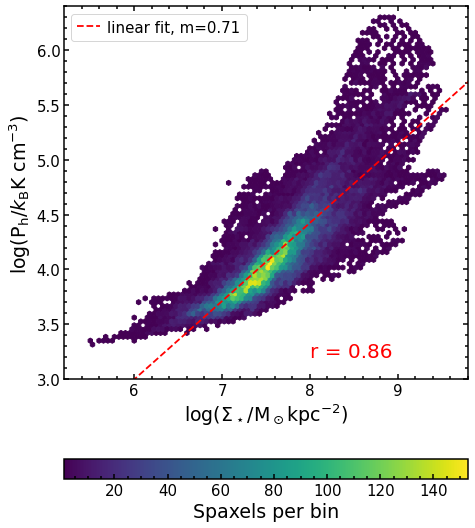

In [180]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_Mstar'])
pearson = linregress(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_P_h_O3'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_P_h_O3'],mincnt=1,cmap='viridis',extent=(5,10.,3.,7.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
#sns.kdeplot(Database,   x='log_P_h_O3',y="log_S_Mstar",levels=[.05,.32],ax=ax)
#ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
ax.plot([5,10],[5.*pearson.slope+pearson.intercept,10.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.text(8.,3.2,f'$r$ = {pearson.rvalue:.2}',color='r')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(5.2,9.8)
ax.set_ylim(3.,6.4)
ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Ph-SFR')
##fig.savefig(colloquiumpath+'Ph-SFR.png')
plt.show()

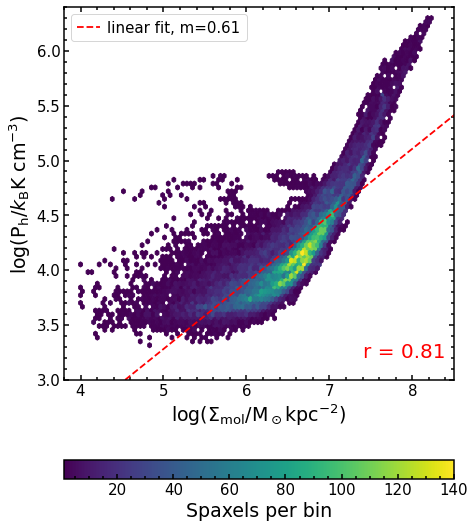

In [179]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_mol_O3'])
pearson = linregress(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_P_h_O3'])
im = ax.hexbin(Database['log_S_mol_O3'],Database['log_P_h_O3'],mincnt=1,cmap='viridis',extent=(4,8.5,3.,7.))
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
#sns.kdeplot(Database,   x='log_P_h_O3',y="log_S_Mstar",levels=[.05,.32],ax=ax)
#ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
ax.plot([4,10],[4.*pearson.slope+pearson.intercept,10.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.text(7.4,3.2,f'$r$ = {pearson.rvalue:.2}',color='r')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.8,8.5)
ax.set_ylim(3.,6.4)
ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Ph-SFR')
##fig.savefig(colloquiumpath+'Ph-SFR.png')
plt.show()

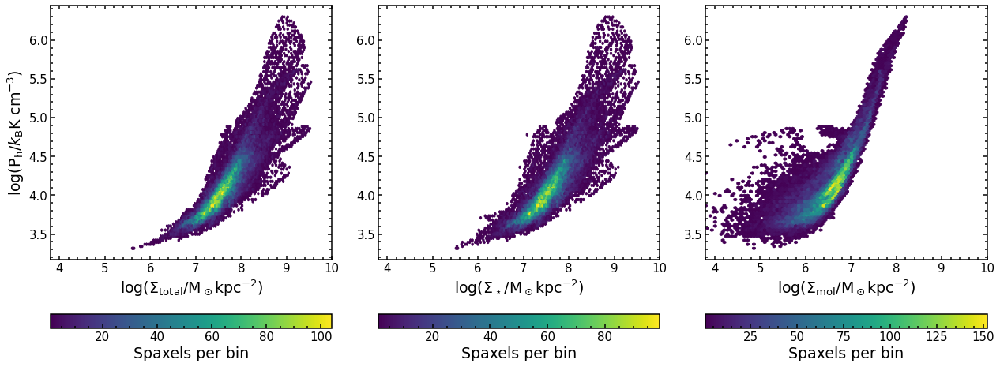

In [78]:
fig, axs = plt.subplots(1,3,figsize=(18,7))
#mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_mol_O3'])
#pearson = linregress(Database.loc[mask,'log_S_mol_O3'],Database.loc[mask,'log_P_h_O3'])
im = axs[0].hexbin(np.log10(Database['S_Mstar']+Database['S_mol_O3']),Database['log_P_h_O3'],mincnt=1,cmap='viridis')#,extent=(4,8.5,3.,7.))
fig.colorbar(im,ax=axs[0],orientation='horizontal',label=r'Spaxels per bin')
im = axs[1].hexbin(Database['log_S_Mstar'],Database['log_P_h_O3'],mincnt=1,cmap='viridis')#,extent=(4,8.5,3.,7.))
fig.colorbar(im,ax=axs[1],orientation='horizontal',label=r'Spaxels per bin')
im = axs[2].hexbin(Database['log_S_mol_O3'],Database['log_P_h_O3'],mincnt=1,cmap='viridis')#,extent=(4,8.5,3.,7.))
fig.colorbar(im,ax=axs[2],orientation='horizontal',label=r'Spaxels per bin')
#sns.kdeplot(Database,   x='log_P_h_O3',y="log_S_Mstar",levels=[.05,.32],ax=ax)
#ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
#ax.plot([4,10],[4.*pearson.slope+pearson.intercept,10.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(7.4,3.2,f'$r$ = {pearson.rvalue:.2}',color='r')
axs[0].set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
axs[0].set_xlabel(r'log($\Sigma_\mathrm{total}$/M$_\odot$kpc$^{-2}$)')
axs[1].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
axs[2].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
axs[0].set_xlim(3.8,10)
axs[1].set_xlim(3.8,10)
axs[2].set_xlim(3.8,10)
#ax.set_ylim(3.,6.4)
#ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Ph-SFR')
##fig.savefig(colloquiumpath+'Ph-SFR.png')
plt.show()

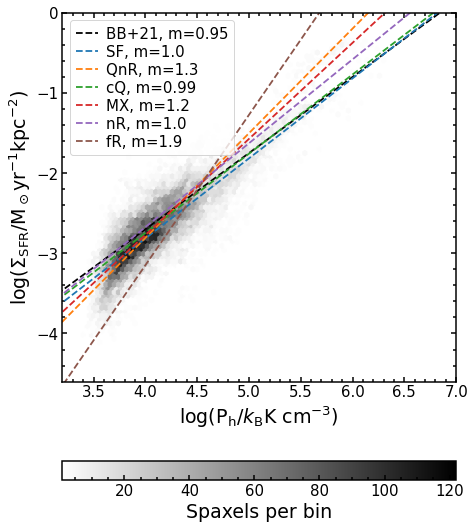

In [87]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
im = ax.hexbin(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
for QS in stages:
    mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))&(Database['Final_QS']==QS)
    pearson = linregress(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'])
    ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],ls='--',label=QS+f', $m$={pearson.slope:.2}')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Ph-SFR')
##fig.savefig(colloquiumpath+'Ph-SFR.png')
plt.show()

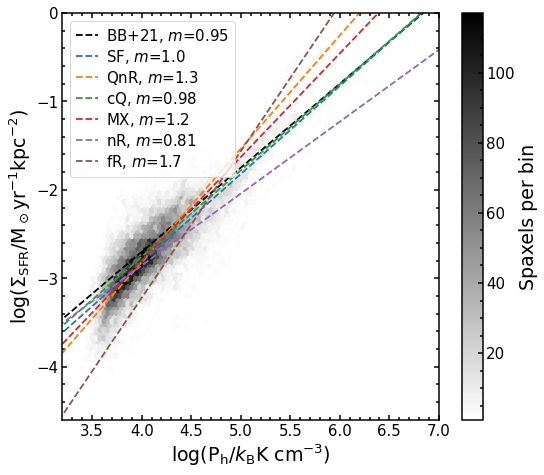

In [111]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))
im = ax.hexbin(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.,7.,-4.5,1.))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
for QS in stages:
    mask = np.isfinite(Database['log_P_h_O3'])&np.isfinite(Database['log_S_SFR_final'])&((np.floor(Database['Ha_mask'])==1)|(np.floor(Database['D4_mask'])==1))&(Database['Final_QS']==QS)
    pearson = linregress(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_final'])
    ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],ls='--',label=QS+f', $m$={pearson.slope:.2}')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,7.0)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left')
fig.tight_layout()
#fig.savefig(figurepath+'Ph-SFR')
##fig.savefig(colloquiumpath+'Ph-SFR.png')
plt.show()

In [178]:
print(np.nanmax(Database['CO_vdisp']))

185.68372


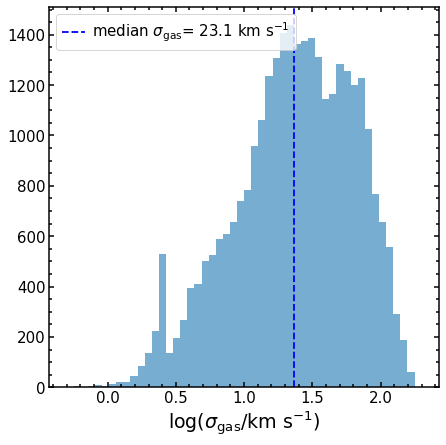

In [177]:
fig, ax = plt.subplots(1,1,figsize=(7,7))
#ax.hist(np.log10(Database['CO_vdisp']),bins=np.linspace(-6,2.5,31))
ax.hist(np.log10(Database['CO_vdisp']),bins=np.linspace(-0.3,2.3,51),alpha=0.6)
logmedian = np.nanmedian(np.log10(Database['CO_vdisp']))
median = np.nanmedian(Database['CO_vdisp'])
#ax.axvline(median,c='b',ls='--',label='median $\sigma_\mathrm{gas}$ = '' km s$^{-1}$')
ax.axvline(logmedian,c='b',ls='--',label='median $\sigma_\mathrm{gas}$='+f' {median:.3} '+'km s$^{-1}$')
ax.set_xlabel('log($\sigma_\mathrm{gas}$/km s$^{-1}$)')
#axs[1].hist(Database['Inclination'],bins=np.linspace(20,75,56))
#axs[1].set_xlabel('Inclination [deg]',fontsize=15)
ax.legend(loc='upper left')
plt.show()

In [ ]:
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_Mstar'])
lm = linmix.LinMix(Database_SF.loc[mask,'log_S_Mstar'], Database_SF.loc[mask,'log_S_SFR'], Database_SF.loc[mask,'eS_Mstar']/Database_SF.loc[mask,'log_S_Mstar']/np.log(10), Database_SF.loc[mask,'eS_SFR']/Database_SF.loc[mask,'log_S_SFR']/np.log(10), K=2)
lm.run_mcmc(silent=False)

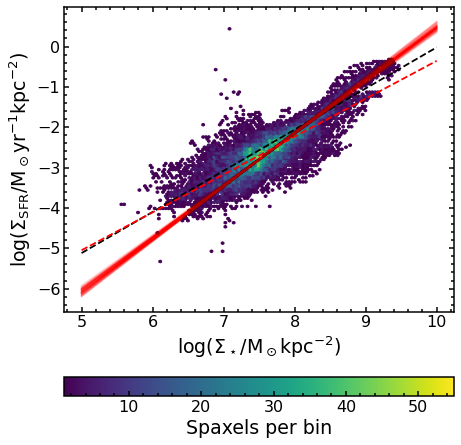

In [135]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
for i in range(0, len(lm.chain), 500):
    xs = np.arange(5,11)
    ys = lm.chain[i]['alpha'] + xs * lm.chain[i]['beta']
    ax.plot(xs, ys, color='r', alpha=0.01)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
plt.show()

In [124]:
len(lm.chain)

200000

In [61]:
np.median(lm.chain['alpha'])

-12.618635382662472

In [62]:
np.median(lm.chain['beta'])

1.3090327935754433

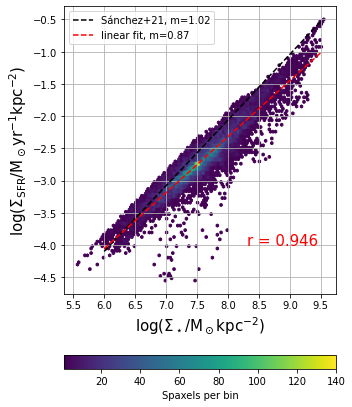

In [34]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR_D4'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([6.,9.5],[(6.-6)*1.02-10.1+6,(9.5-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

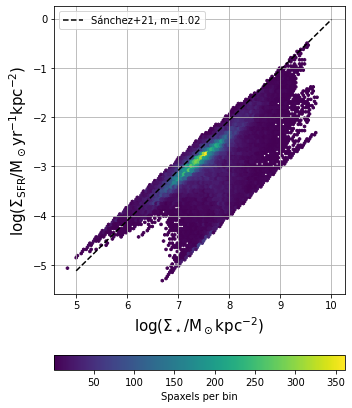

In [25]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_D4'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

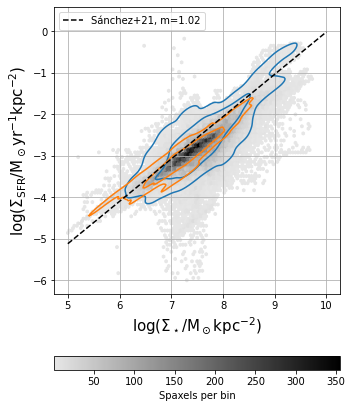

In [33]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_final'],mincnt=1,cmap=cmap_grey,extent=(5,10,-6,0.5))
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

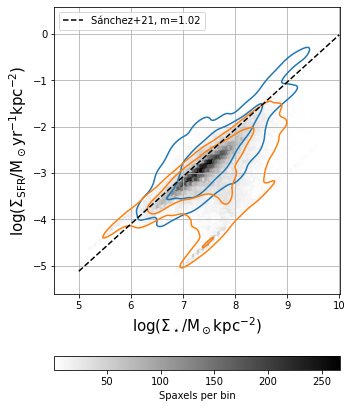

In [42]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="log_S_Mstar",y="log_S_SFR_final",levels=[.05,.32],ax=ax)
ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

No handles with labels found to put in legend.


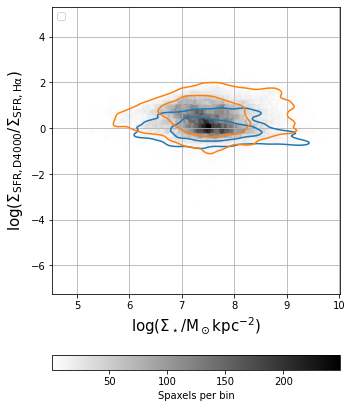

In [23]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['SFR_D4_Ha'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="SFR_D4_Ha",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="log_S_Mstar",y="SFR_D4_Ha",levels=[.05,.32],ax=ax)
#ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/$\Sigma_\mathrm{SFR,H\alpha}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

No handles with labels found to put in legend.


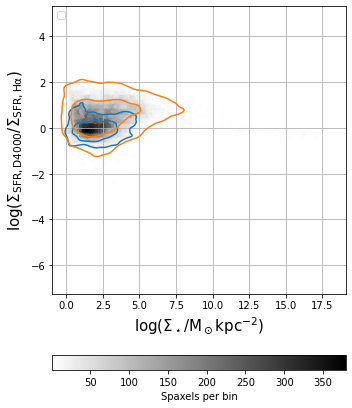

In [24]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['Rgal_Re'],Database['SFR_D4_Ha'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
sns.kdeplot(Database_SF, x="Rgal_Re",y="SFR_D4_Ha",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="Rgal_Re",y="SFR_D4_Ha",levels=[.05,.32],ax=ax)
#ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/$\Sigma_\mathrm{SFR,H\alpha}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

No handles with labels found to put in legend.


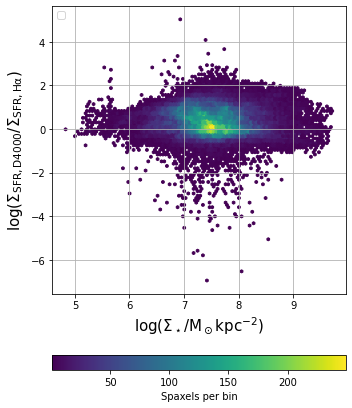

In [126]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_D4']-Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
#ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/$\Sigma_\mathrm{SFR,H\alpha}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

No handles with labels found to put in legend.


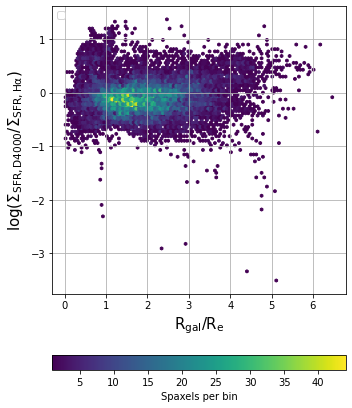

In [129]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF_SF['log_S_SFR_D4'])&np.isfinite(Database_SF_SF['log_S_Mstar'])
#pearson = linregress(Database_SF_SF.loc[mask,'log_S_Mstar'],Database_SF_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF['log_S_SFR_D4']-Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
#ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/$\Sigma_\mathrm{SFR,H\alpha}$)',size=15)
ax.set_xlabel(r'R$_\mathrm{gal}$/R$_\mathrm{e}$',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

No handles with labels found to put in legend.


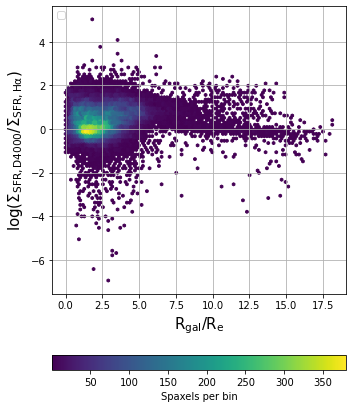

In [130]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF_SF['log_S_SFR_D4'])&np.isfinite(Database_SF_SF['log_S_Mstar'])
#pearson = linregress(Database_SF_SF.loc[mask,'log_S_Mstar'],Database_SF_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['Rgal_Re'],Database['log_S_SFR_D4']-Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
#ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR,D4000}$/$\Sigma_\mathrm{SFR,H\alpha}$)',size=15)
ax.set_xlabel(r'R$_\mathrm{gal}$/R$_\mathrm{e}$',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

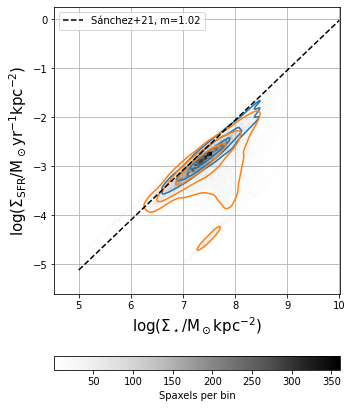

In [35]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_D4'],mincnt=1,cmap='Greys')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR_D4",levels=[.25,.5,.75],ax=ax)
sns.kdeplot(Database_passive, x="log_S_Mstar",y="log_S_SFR_D4",levels=[.25,.5,.75],ax=ax)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

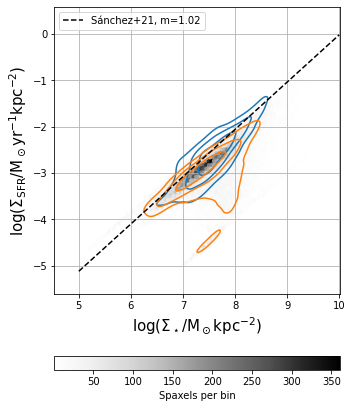

In [21]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_D4'],mincnt=1,cmap='Greys')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR",levels=[.25,.5,.75],ax=ax)
sns.kdeplot(Database_passive, x="log_S_Mstar",y="log_S_SFR_D4",levels=[.25,.5,.75],ax=ax)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

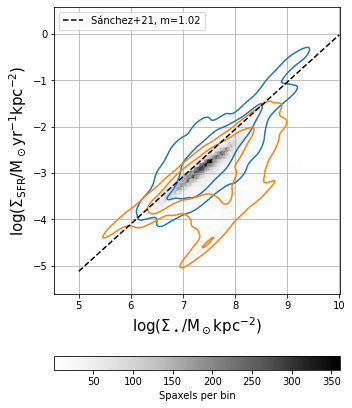

In [121]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
#mask = np.isfinite(Database_SF['log_S_SFR_D4'])&np.isfinite(Database_SF['log_S_Mstar'])
#pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_D4'])
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_D4'],mincnt=1,cmap='Greys')
sns.kdeplot(Database_SF, x="log_S_Mstar",y="log_S_SFR",levels=[.05,.32],ax=ax)
sns.kdeplot(Database_passive, x="log_S_Mstar",y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([5.,10.],[(5.-6)*1.02-10.1+6,(10.-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
#ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
#ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

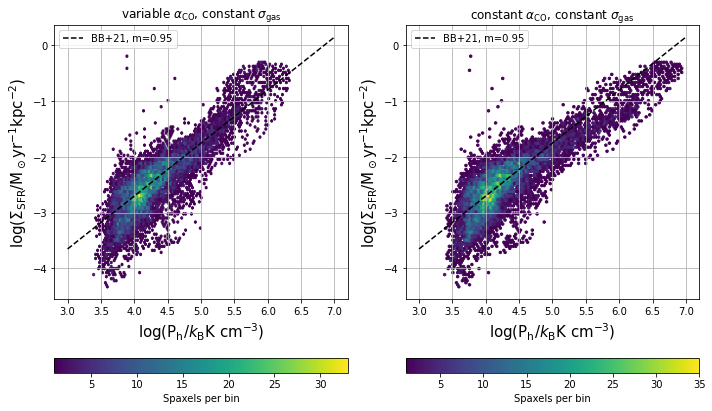

In [45]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3','log_P_h_MW'],['variable','constant']):
    #mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    #pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
    #ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    #ax.text(5.7,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, constant $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

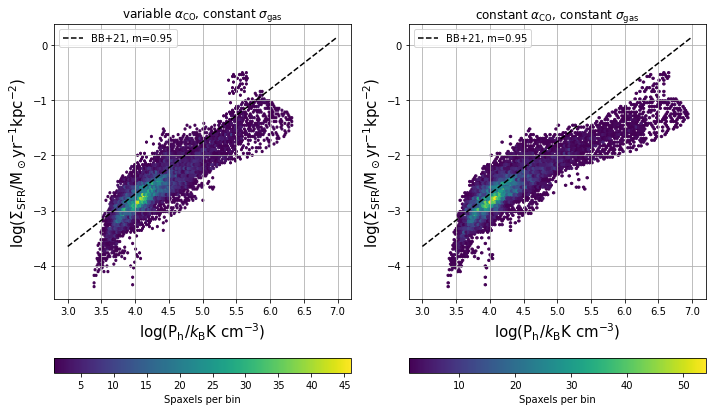

In [30]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3','log_P_h_MW'],['variable','constant']):
    #mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    #pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR_D4'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
    #ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    #ax.text(5.7,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, constant $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

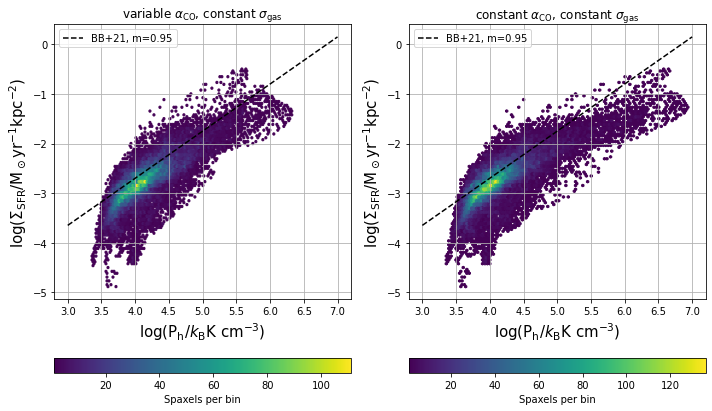

In [28]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3','log_P_h_MW'],['variable','constant']):
    #mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    #pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database[name],Database['log_S_SFR_D4'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
    #ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    #ax.text(5.7,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, constant $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

In [46]:
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_S_SFR_final'])
slope, inter = get_pca(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
print(slope, inter)

1.2384121003815216 -7.8159967777541155


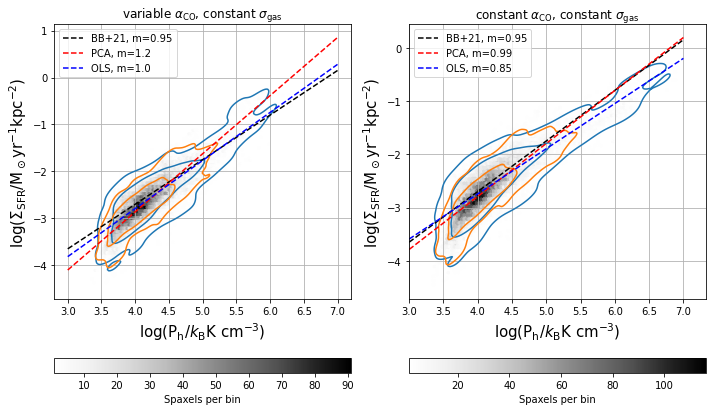

In [54]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3','log_P_h_MW'],['variable','constant']):
    #mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    mask = np.isfinite(Database_SF[name])&np.isfinite(Database_SF['log_S_SFR_final'])
    pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR_final'])
    slope, inter = get_pca(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR_final'])
    im = ax.hexbin(Database[name],Database['log_S_SFR_final'],mincnt=1,cmap='Greys')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    sns.kdeplot(Database_SF, x=name,y="log_S_SFR",levels=[.05,.32],ax=ax)
    sns.kdeplot(Database_passive, x=name,y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
    ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
    ax.plot([3.,7.],[(3.)*slope+inter,(7.)*slope+inter],c='r',ls='--',label='PCA'+f', $m$={slope:.2}')
    ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='b',ls='--',label='OLS'+f', $m$={pearson.slope:.2}')
    #ax.text(5.7,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, constant $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

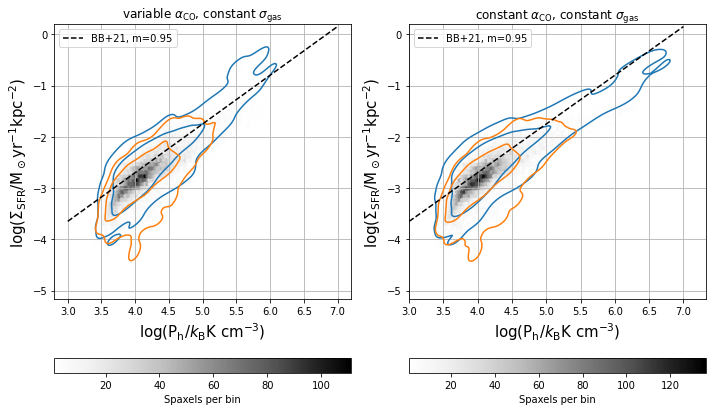

In [120]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3','log_P_h_MW'],['variable','constant']):
    #mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    #pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database[name],Database['log_S_SFR_D4'],mincnt=1,cmap='Greys')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    sns.kdeplot(Database_SF, x=name,y="log_S_SFR",levels=[.05,.32],ax=ax)
    sns.kdeplot(Database_passive, x=name,y="log_S_SFR_D4",levels=[.05,.32],ax=ax)
    ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
    #ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    #ax.text(5.7,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, constant $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

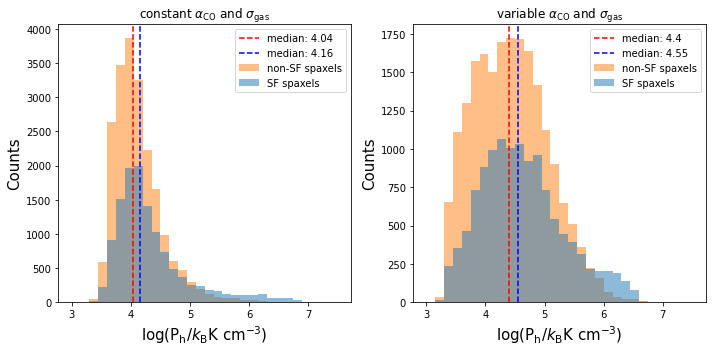

In [21]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,SF,passive,title_type in zip(axs.ravel(),[Database_SF['log_P_h_MW'],Database_SF['log_P_h_O3_vdisp']],[Database_passive['log_P_h_MW'],Database_passive['log_P_h_O3_vdisp']],['constant','variable']):
    ax.hist(passive,alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(3.,7.5,31))
    median = np.nanmedian(passive)
    ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
    ax.hist(SF,alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.,7.5,31))
    median = np.nanmedian(SF)
    ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Counts',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

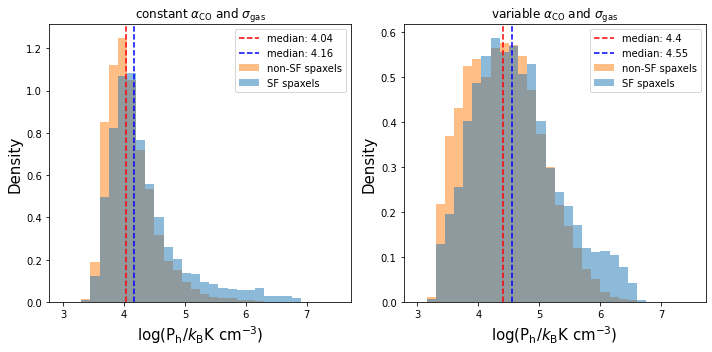

In [ ]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,SF,passive,title_type in zip(axs.ravel(),[Database_SF['log_P_h_MW'],Database_SF['log_P_h_O3_vdisp']],[Database_passive['log_P_h_MW'],Database_passive['log_P_h_O3_vdisp']],['constant','variable']):
    ax.hist(passive,alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(3.,7.5,31),density=True)
    median = np.nanmedian(passive)
    ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
    ax.hist(SF,alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.,7.5,31),density=True)
    median = np.nanmedian(SF)
    ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Density',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

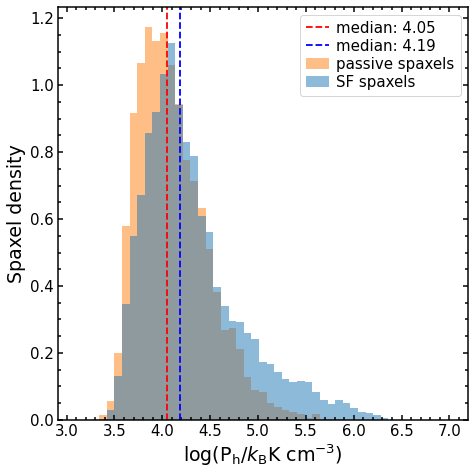

In [27]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive['log_P_h_O3'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(3.1,7.,50),density=True)
median = np.nanmedian(Database_passive['log_P_h_O3'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_P_h_O3'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.1,7.,50),density=True)
median = np.nanmedian(Database_SF['log_P_h_O3'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_ylabel('Spaxel density')
ax.legend(loc='best')
fig.tight_layout()
fig.savefig(figurepath+'Ph_hist_density')
#fig.savefig(colloquiumpath+'Ph_hist_density.png')
plt.show()

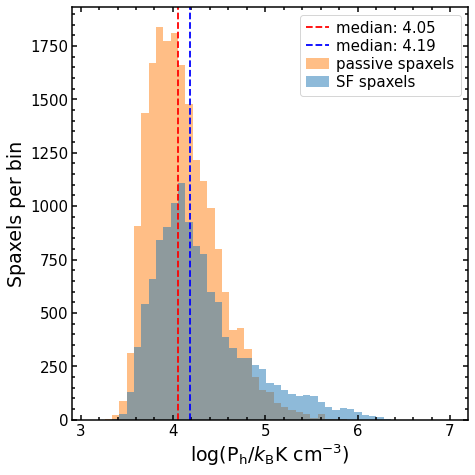

In [28]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive['log_P_h_O3'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(3.1,7.,50))
median = np.nanmedian(Database_passive['log_P_h_O3'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_P_h_O3'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.1,7.,50))
median = np.nanmedian(Database_SF['log_P_h_O3'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
fig.savefig(figurepath+'Ph_hist')
#fig.savefig(colloquiumpath+'Ph_hist.png')
plt.show()

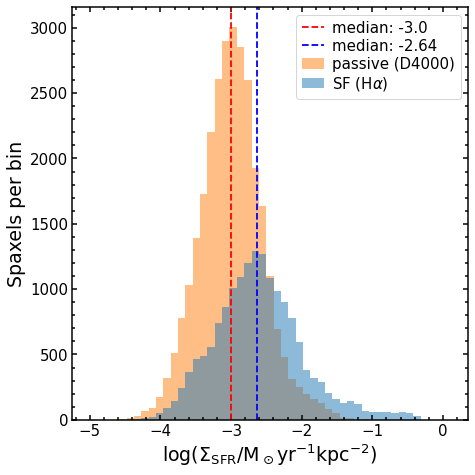

In [29]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive.loc[Database_passive['D4_mask']==1,'log_S_SFR_final'],alpha=0.5,label=r'passive (D4000)',color='tab:orange',bins=np.linspace(-5,0.1,50))
median = np.nanmedian(Database_passive.loc[Database_passive['D4_mask']==1,'log_S_SFR_final'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_S_SFR_final'],alpha=0.5,label=r'SF (H$\alpha$)',bins=np.linspace(-5,0.1,50))
median = np.nanmedian(Database_SF['log_S_SFR_final'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
fig.savefig(figurepath+'SFR_hist')
#fig.savefig(colloquiumpath+'SFR_hist.png')
plt.show()

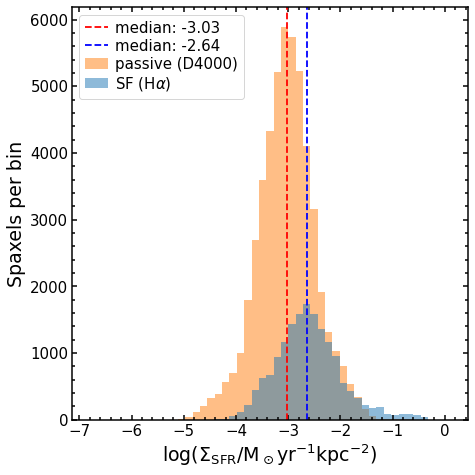

In [116]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive['log_S_SFR_D4'],alpha=0.5,label=r'passive (D4000)',color='tab:orange',bins=np.linspace(-6.8,0.1,50))
median = np.nanmedian(Database_passive['log_S_SFR_D4'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_S_SFR_final'],alpha=0.5,label=r'SF (H$\alpha$)',bins=np.linspace(-6.8,0.1,50))
median = np.nanmedian(Database_SF['log_S_SFR_final'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
#fig.savefig(figurepath+'SFR_hist')
#fig.savefig(colloquiumpath+'SFR_hist.png')
plt.show()

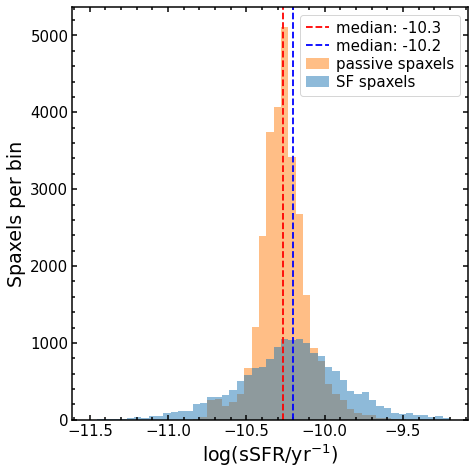

In [30]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive.loc[Database_passive['D4_mask']==1,'log_sSFR_final'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(-11.5,-9.2,50))
median = np.nanmedian(Database_passive.loc[Database_passive['D4_mask']==1,'log_sSFR_final'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_sSFR_final'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(-11.5,-9.2,50))
median = np.nanmedian(Database_SF['log_sSFR_final'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log(sSFR/yr$^{-1}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
#fig.savefig(figurepath+'Ph_hist')
##fig.savefig(colloquiumpath+'Ph_hist.png')
plt.show()

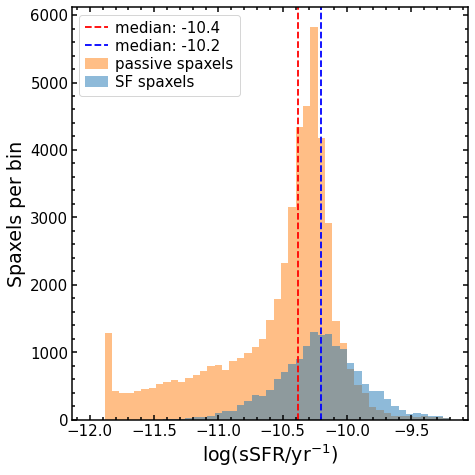

In [120]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive['log_S_SFR_D4']-Database_passive['log_S_Mstar'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(-12,-9.2,50))
median = np.nanmedian(Database_passive['log_S_SFR_D4']-Database_passive['log_S_Mstar'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_sSFR_final'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(-12,-9.2,50))
median = np.nanmedian(Database_SF['log_sSFR_final'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log(sSFR/yr$^{-1}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
#fig.savefig(figurepath+'Ph_hist')
##fig.savefig(colloquiumpath+'Ph_hist.png')
plt.show()

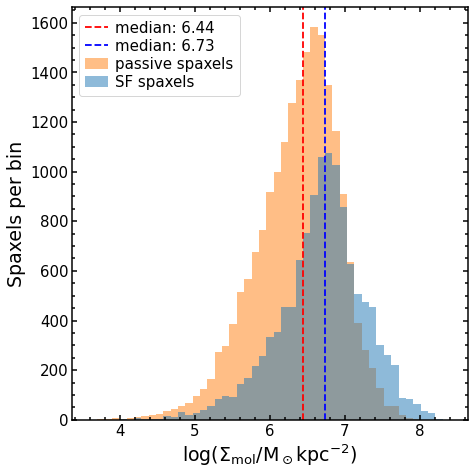

In [31]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive['log_S_mol_O3'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(3.6,8.4,50))
median = np.nanmedian(Database_passive['log_S_mol_O3'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_S_mol_O3'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.6,8.4,50))
median = np.nanmedian(Database_SF['log_S_mol_O3'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
fig.savefig(figurepath+'Smol_hist')
#fig.savefig(colloquiumpath+'Smol_hist.png')
plt.show()

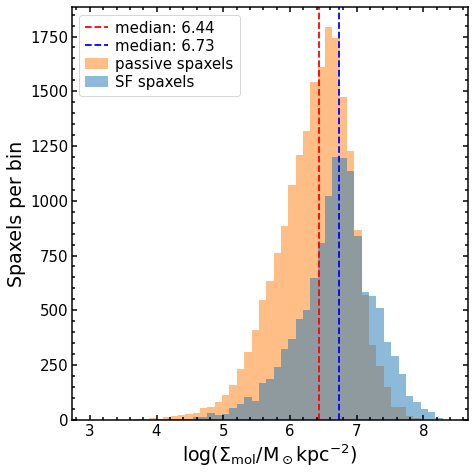

In [147]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive['log_S_mol_O3'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(3.,8.4,50))
median = np.nanmedian(Database_passive['log_S_mol_O3'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_S_mol_O3'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.,8.4,50))
median = np.nanmedian(Database_SF['log_S_mol_O3'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
plt.show()

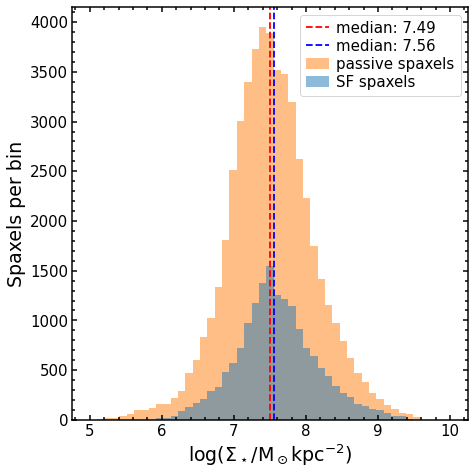

In [32]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
ax.hist(Database_passive['log_S_Mstar'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(5,10,50))
median = np.nanmedian(Database_passive['log_S_Mstar'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['log_S_Mstar'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(5,10,50))
median = np.nanmedian(Database_SF['log_S_Mstar'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_ylabel('Spaxels per bin')
ax.legend(loc='best')
fig.tight_layout()
fig.savefig(figurepath+'SMstar_hist')
#fig.savefig(colloquiumpath+'SMstar_hist.png')
plt.show()

In [ ]:
ks_O3 = ks_2samp(Database_SF['log_P_h_O3'],Database_passive['log_P_h_O3'],method='exact')
print(ks_O3)

KstestResult(statistic=0.36574204744434696, pvalue=4.0187e-320, statistic_location=6.296963748340642, statistic_sign=1)


In [145]:
ks_O3 = ks_2samp(Database_SF['log_P_h_O3'],Database_passive['log_P_h_O3'])
print(ks_O3)

KstestResult(statistic=0.36574204744434696, pvalue=0.0, statistic_location=6.296963748340642, statistic_sign=1)


In [95]:
print(ks_O3.pvalue)

4.2633e-320


In [129]:
ks_2samp(Database_SF['log_P_h_O3_vdisp'],Database_passive['log_P_h_O3_vdisp'])

KstestResult(statistic=0.34524361799584563, pvalue=0.0, statistic_location=6.692548810626331, statistic_sign=1)

In [130]:
ks_2samp(Database_SF['log_P_h_O3_vdisp'],Database_passive['log_P_h_O3_vdisp'],alternative='greater')

KstestResult(statistic=0.34524361799584563, pvalue=0.0, statistic_location=6.692548810626331, statistic_sign=1)

In [131]:
ks_2samp(Database_SF['log_P_h_MW'],Database_passive['log_P_h_MW'])

KstestResult(statistic=0.33996519409031717, pvalue=0.0, statistic_location=6.93668618986762, statistic_sign=1)

In [132]:
ks_2samp(Database_SF['log_P_h_MW'],Database_passive['log_P_h_MW'],alternative='greater')

KstestResult(statistic=0.33996519409031717, pvalue=0.0, statistic_location=6.93668618986762, statistic_sign=1)

/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


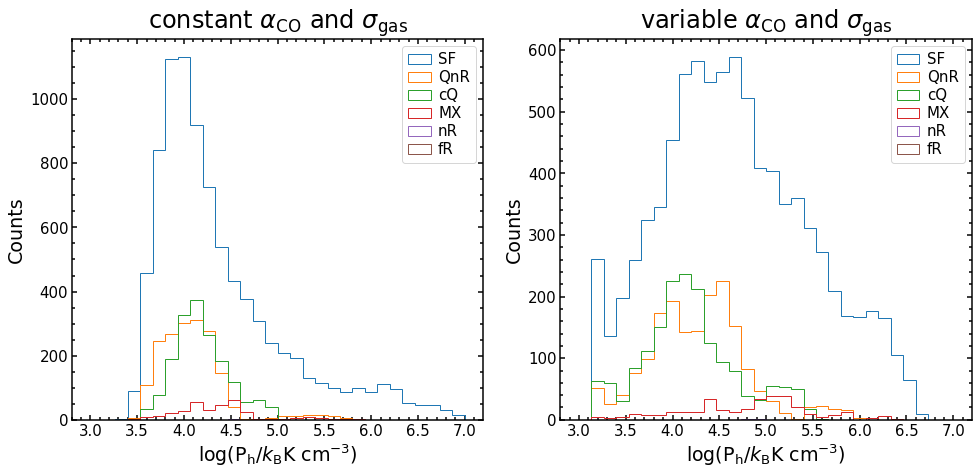

In [91]:
fig, axs = plt.subplots(1,2,figsize=(14,7))#,sharey='row')
for ax,name,title_type in zip(axs.ravel(),['log_P_h_MW','log_P_h_O3_vdisp'],['constant','variable']):
    for QS in stages:
        this_group = SF_byQS.get_group(QS)
        ax.hist(this_group[name],label=QS,bins=np.linspace(3.,7.,31),histtype='step')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')#,size=15)
    ax.set_ylabel('Counts')#,size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

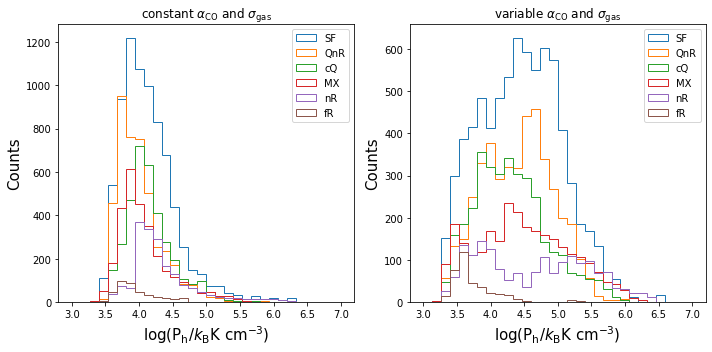

In [24]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,name,title_type in zip(axs.ravel(),['log_P_h_MW','log_P_h_O3_vdisp'],['constant','variable']):
    for QS in stages:
        this_group = passive_byQS.get_group(QS)
        ax.hist(this_group[name],label=QS,bins=np.linspace(3.,7.,31),histtype='step')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Counts',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


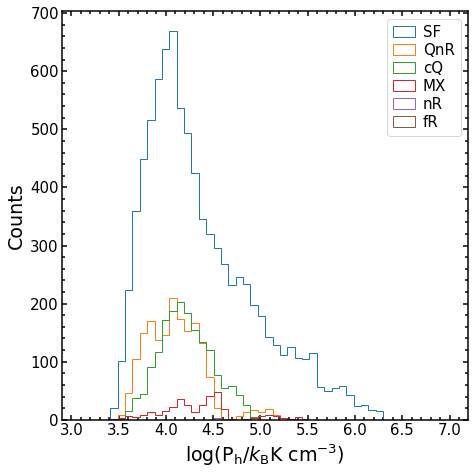

In [154]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
#for ax,name,title_type in zip(axs.ravel(),['log_P_h_MW','log_P_h_O3_vdisp'],['constant','variable']):
for QS in stages:
    this_group = SF_byQS.get_group(QS)
    ax.hist(this_group['log_P_h_O3'],label=QS,bins=np.linspace(3.1,7.,51),histtype='step')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')#,size=15)
ax.set_ylabel('Counts')#,size=15)
#ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
ax.legend(loc='best')
fig.tight_layout()
plt.show()

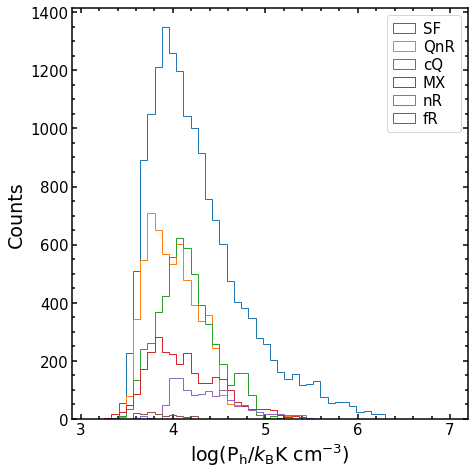

In [155]:
fig, ax = plt.subplots(1,1,figsize=(7,7))#,sharey='row')
#for ax,name,title_type in zip(axs.ravel(),['log_P_h_MW','log_P_h_O3_vdisp'],['constant','variable']):
for QS in stages:
    this_group = total_byQS.get_group(QS)
    ax.hist(this_group['log_P_h_O3'],label=QS,bins=np.linspace(3.1,7.,51),histtype='step')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')#,size=15)
ax.set_ylabel('Counts')#,size=15)
#ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
ax.legend(loc='best')
fig.tight_layout()
plt.show()

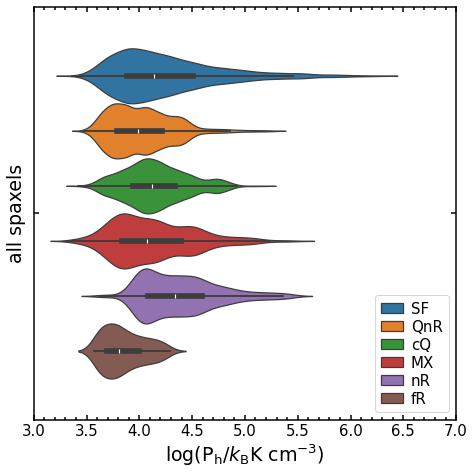

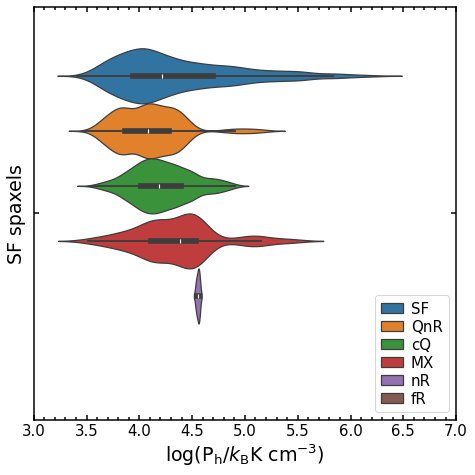

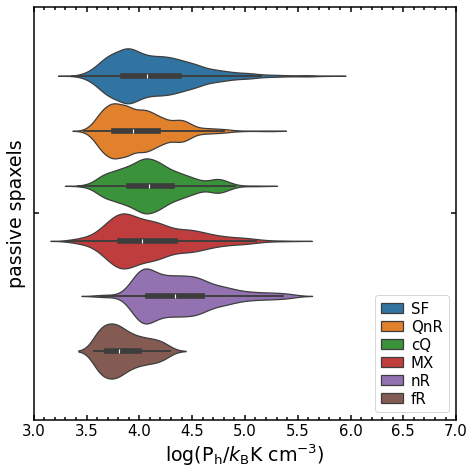

In [35]:
for data,label_sample in zip([Database,Database_SF,Database_passive],['all','SF','passive']):
    fig, ax = plt.subplots(1,1,figsize=(7,7))
    sns.violinplot(data, x="log_P_h_O3",   hue='Final_QS',hue_order=stages,ax=ax)
    ax.legend(loc='lower right')
    ax.set_xlim(3.,7.)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
    ax.set_ylabel(label_sample+' spaxels')
    fig.tight_layout()
    fig.savefig(figurepath+'QS_violin_'+label_sample)
    #fig.savefig(colloquiumpath+'QS_violin_'+label_sample+'.png')
    plt.show()
    plt.close()

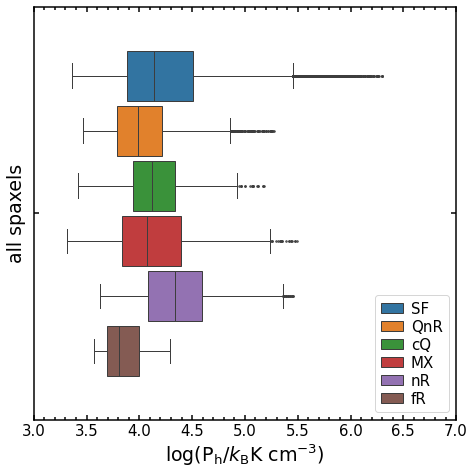

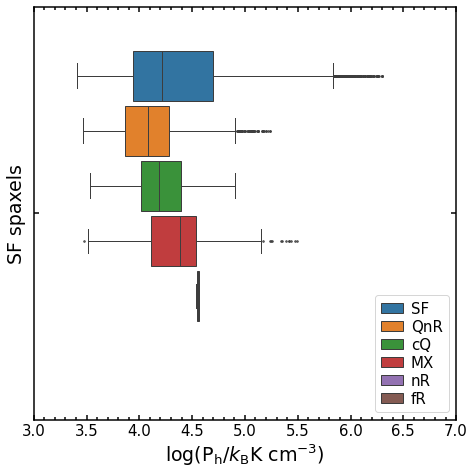

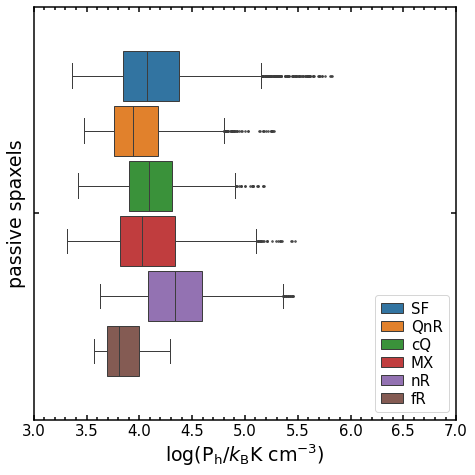

In [37]:
for data,label_sample in zip([Database,Database_SF,Database_passive],['all','SF','passive']):
    fig, ax = plt.subplots(1,1,figsize=(7,7))
    sns.boxplot(data, x="log_P_h_O3",   hue='Final_QS',hue_order=stages,gap=.1,fliersize=1.5,ax=ax)
    ax.legend(loc='lower right')
    ax.set_xlim(3.,7.)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
    ax.set_ylabel(label_sample+' spaxels')
    fig.tight_layout()
    fig.savefig(figurepath+'QS_box_'+label_sample)
    #fig.savefig(colloquiumpath+'QS_box_'+label_sample+'.png')
    plt.show()
    plt.close()

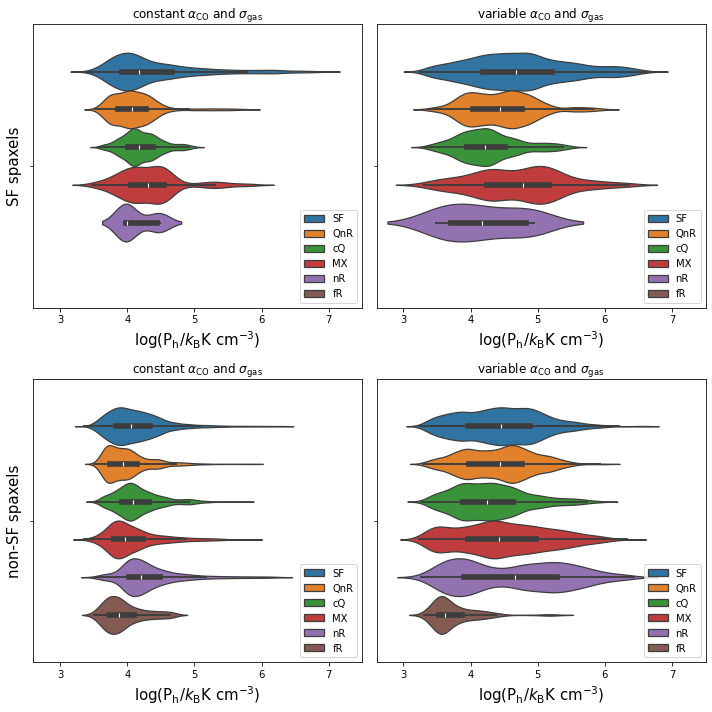

In [147]:
fig, axs = plt.subplots(2,2,figsize=(10,10))#,sharey='row')
sns.violinplot(Database_SF, x="log_P_h_MW",         hue='Final_QS',hue_order=stages,ax=axs[0,0])
sns.violinplot(Database_SF, x="log_P_h_O3_vdisp",   hue='Final_QS',hue_order=stages,ax=axs[0,1])
sns.violinplot(Database_passive, x="log_P_h_MW",      hue='Final_QS',hue_order=stages,ax=axs[1,0])
sns.violinplot(Database_passive, x="log_P_h_O3_vdisp",hue='Final_QS',hue_order=stages,ax=axs[1,1])
for ax,title_type in zip(axs.ravel(),['constant','variable','constant','variable']):
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='lower right')
    ax.set_xlim(2.6,7.5)
axs[0,0].set_ylabel('SF spaxels',size=15)
axs[1,0].set_ylabel('passive spaxels',size=15)
fig.tight_layout()
plt.show()

In [24]:
sources_SF = np.unique(Database_SF['Source'])

## Tests of alphaCO

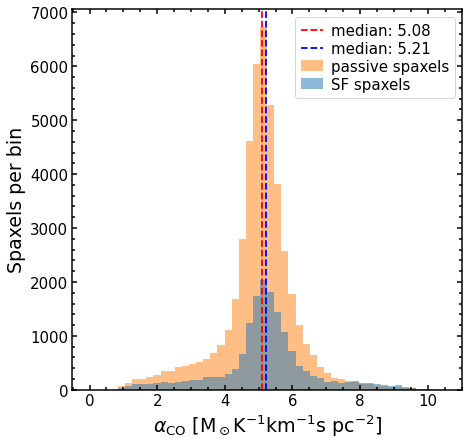

In [39]:
fig, ax = plt.subplots(figsize=(7,7))
ax.hist(Database_passive['alphaCO_O3N2'],alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=np.linspace(0.,10.5,51))
median = np.nanmedian(Database_passive['alphaCO_O3N2'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['alphaCO_O3N2'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(0.,10.5,51))
median = np.nanmedian(Database_SF['alphaCO_O3N2'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]')
ax.set_ylabel(r'Spaxels per bin')
ax.legend(loc='best')
plt.show()

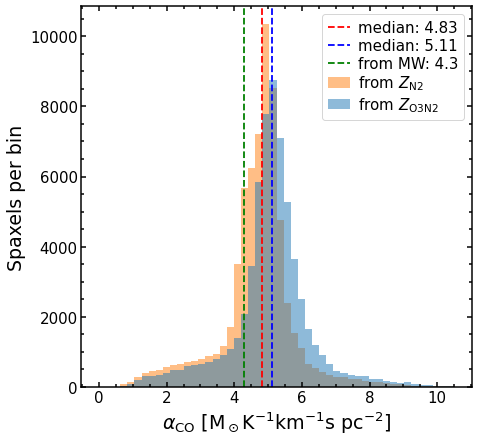

In [44]:
fig, ax = plt.subplots(figsize=(7,7))
ax.hist(Database['alphaCO_N2'],alpha=0.5,label=r'from $Z_\mathrm{N2}$',color='tab:orange',bins=np.linspace(0.,10.5,51))
median = np.nanmedian(Database['alphaCO_N2'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database['alphaCO_O3N2'],alpha=0.5,label=r'from $Z_\mathrm{O3N2}$',bins=np.linspace(0.,10.5,51))
median = np.nanmedian(Database['alphaCO_O3N2'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.axvline(alphaCO_MW,ls='--',c='g',label=f'from MW: {alphaCO_MW:.3}')
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]')
ax.set_ylabel(r'Spaxels per bin')
ax.legend(loc='best')
fig.savefig(figurepath+'alpaCO_histO3N2')
#fig.savefig(colloquiumpath+'alpaCO_histO3N2.png')
plt.show()

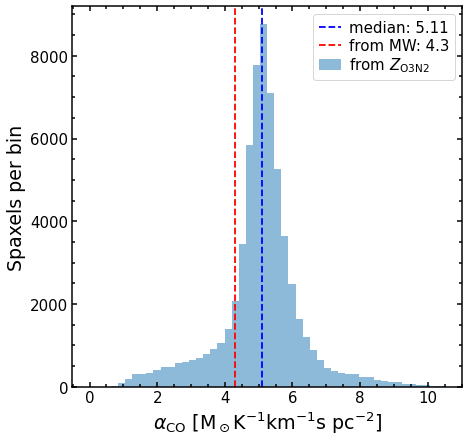

In [45]:
fig, ax = plt.subplots(figsize=(7,7))
#ax.hist(Database['alphaCO_N2'],alpha=0.5,label=r'from $Z_\mathrm{N2}$',color='tab:orange',bins=np.linspace(0.,10.5,51))
#median = np.nanmedian(Database['alphaCO_N2'])
#ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database['alphaCO_O3N2'],alpha=0.5,label=r'from $Z_\mathrm{O3N2}$',bins=np.linspace(0.,10.5,51))
median = np.nanmedian(Database['alphaCO_O3N2'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.axvline(alphaCO_MW,ls='--',c='r',label=f'from MW: {alphaCO_MW:.3}')
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]')
ax.set_ylabel(r'Spaxels per bin')
ax.legend(loc='best')
fig.savefig(figurepath+'alpaCO_histO3')
#fig.savefig(colloquiumpath+'alpaCO_histO3.png')
plt.show()

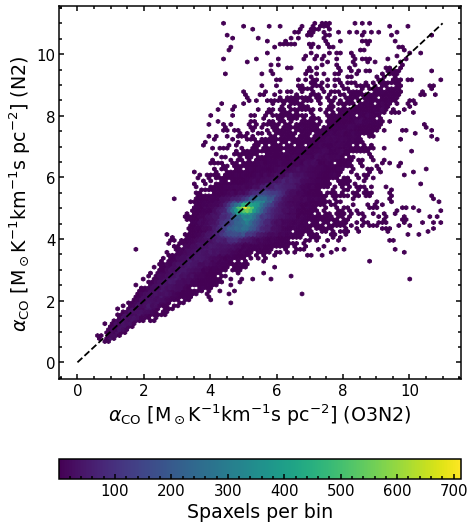

In [51]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
mask = np.isfinite(Database['alphaCO_O3N2'])&np.isfinite(Database['alphaCO_N2'])
im = ax.hexbin(Database.loc[mask,'alphaCO_O3N2'],Database.loc[mask,'alphaCO_N2'],mincnt=1,extent=(0,11,0,11))
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([0,11],[0,11],c='k',ls='--')
ax.set_ylabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$] (N2)')
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$] (O3N2)')
fig.tight_layout()
fig.savefig(figurepath+'alpaCO_N2vO3N2')
#fig.savefig(colloquiumpath+'alpaCO_N2vO3N2.png')
plt.show()

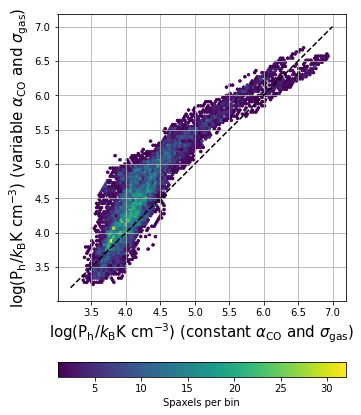

In [67]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_MW'])&np.isfinite(Database_SF['log_P_h_O3_vdisp'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_P_h_O3_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

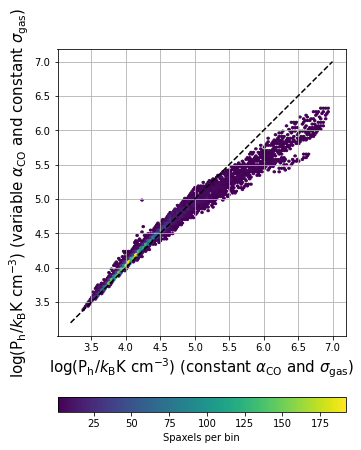

In [96]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_MW'])&np.isfinite(Database_SF['log_P_h_O3'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_P_h_O3'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and constant $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

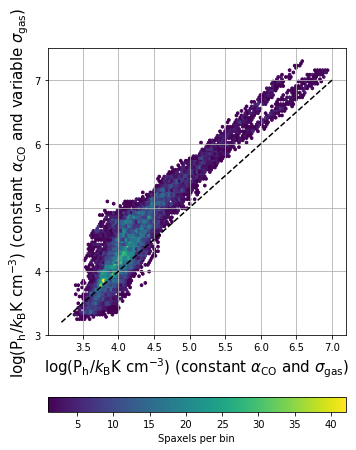

In [97]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_MW'])&np.isfinite(Database_SF['log_P_h_MW_vdisp'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_P_h_MW_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and variable $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

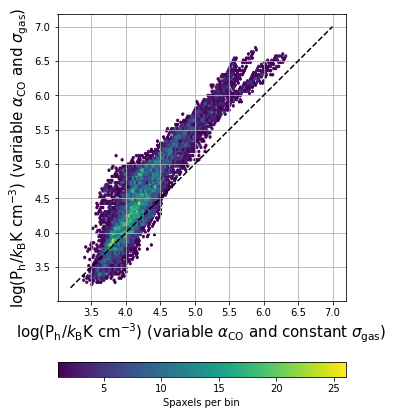

In [98]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_P_h_O3_vdisp'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_P_h_O3_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and constant $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

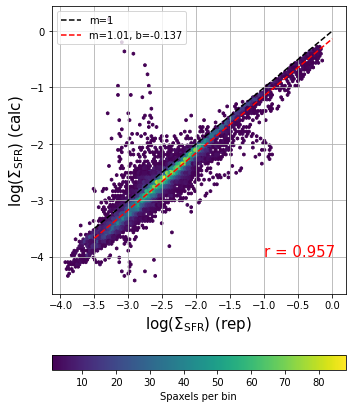

In [99]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_SFR2'])
pearson = linregress(Database_SF.loc[mask,'log_S_SFR2'],Database_SF.loc[mask,'log_S_SFR'])
im = ax.hexbin(Database_SF.loc[mask,'log_S_SFR2'],Database_SF.loc[mask,'log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([-3.5,0.],[-3.5,0.],c='k',ls='--',label='m=1')
ax.plot([-3.5,0.],[pearson.slope*-3.5+pearson.intercept,pearson.slope*0.+pearson.intercept],c='r',ls='--',label=f'm={pearson.slope:.3}, b={pearson.intercept:.3}')
ax.text(-1.,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR}$) (rep)',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$) (calc)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

# Comparing assumptions about $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$

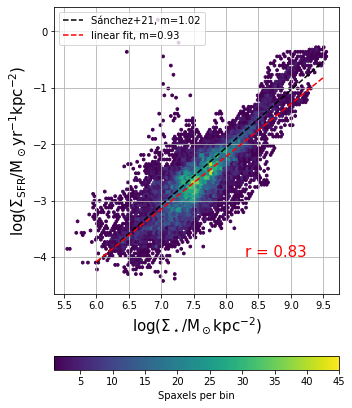

In [101]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'])
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([6.,9.5],[(6.-6)*1.02-10.1+6,(9.5-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02')
ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.text(8.3,-4.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

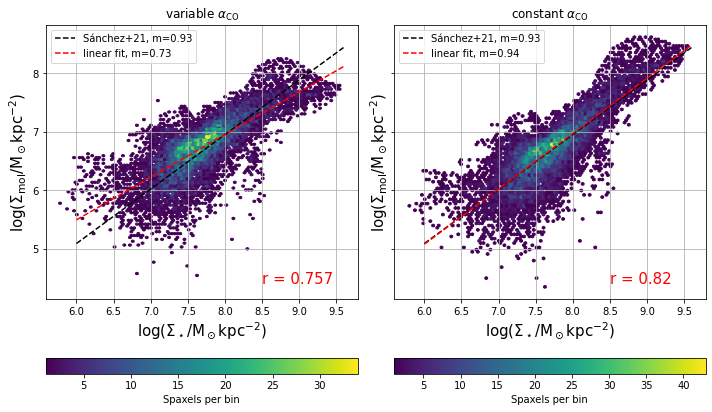

In [102]:
fig, axs = plt.subplots(1,2,figsize=(10,6),sharey='row')
for ax,name,title in zip(axs.ravel(),['log_S_mol_O3','log_S_mol_MW'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,name])
    im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF[name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    #ax.plot([6.,9.5],[6.*0.93-0.91-6.+6*0.93,9.5*0.93-0.91-6.+6*0.93],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93')
    ax.plot([6.,9.6],[(6.-6)*0.93-0.91+6,(9.6-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93')
    ax.plot([6.,9.6],[6.*pearson.slope+pearson.intercept,9.6*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    ax.text(8.5,4.4,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

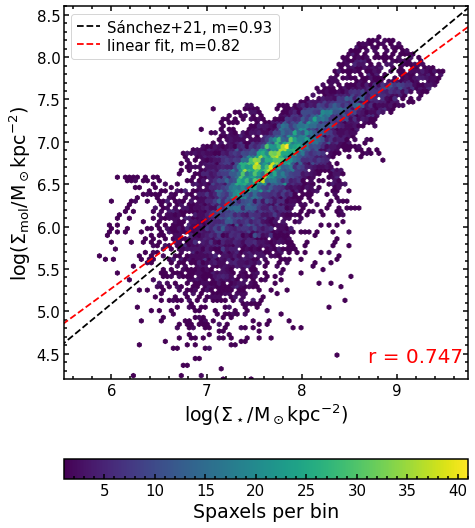

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
#for ax,name,title in zip(axs.ravel(),['log_S_mol_O3','log_S_mol_MW'],['variable','constant']):
mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3'])
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3'],mincnt=1,extent=(5.6,9.8,4.0,8.6))
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
#ax.plot([6.,9.5],[6.*0.93-0.91-6.+6*0.93,9.5*0.93-0.91-6.+6*0.93],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93')
ax.plot([5.,10],[(5.-6)*0.93-0.91+6,(10-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93')
ax.plot([5.,10],[5.*pearson.slope+pearson.intercept,10*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.text(8.7,4.4,f'$r$ = {pearson.rvalue:.3}',color='r')
ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(5.5,9.75)
ax.set_ylim(4.2,8.6)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

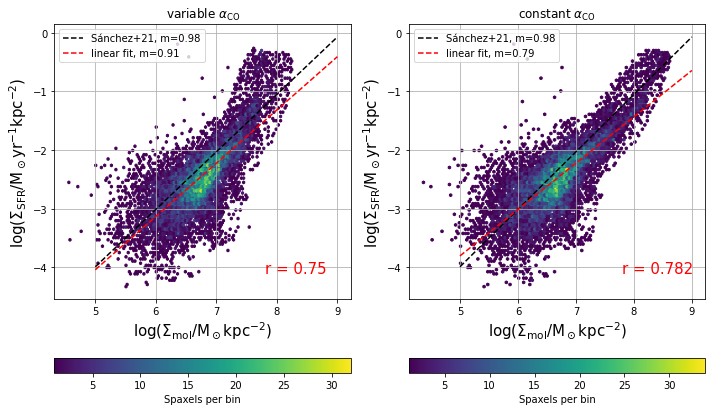

In [103]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_S_mol_O3','log_S_mol_MW'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([5.,9.],[(5.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.98')
    ax.plot([5.,9.],[5.*pearson.slope+pearson.intercept,9.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    ax.text(7.8,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

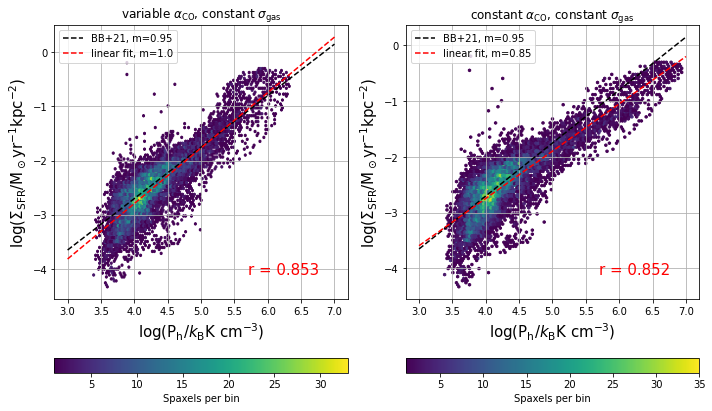

In [104]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3','log_P_h_MW'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
    ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    ax.text(5.7,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, constant $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

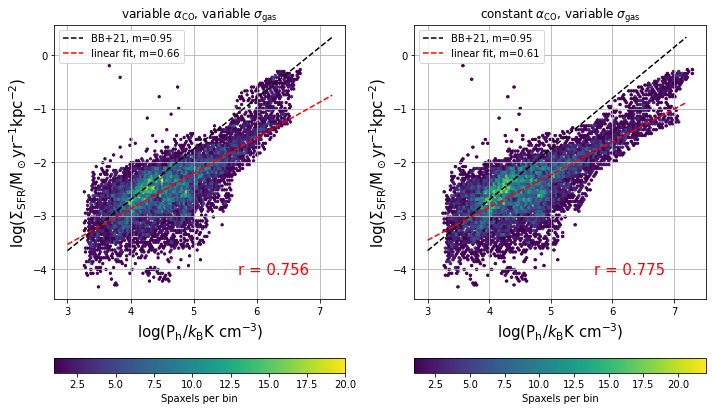

In [105]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3_vdisp','log_P_h_MW_vdisp'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([3.,7.2],[(3.-4)*b+A-3,(7.2-4)*b+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
    ax.plot([3.,7.2],[3.*pearson.slope+pearson.intercept,7.2*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
    ax.text(5.7,-4.1,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, variable $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

# Dependence on P$_h$

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


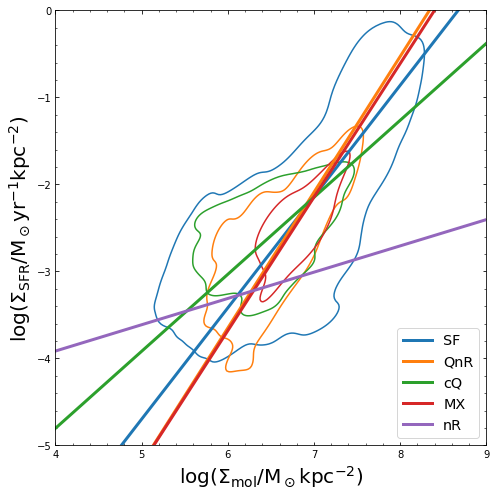

In [88]:
fig, ax = plt.subplots(1,1,figsize=(7,7))
sns.kdeplot(Database_SF, x="log_S_mol_O3",y="log_S_SFR",levels=[.05],hue="Final_QS",hue_order=stages,ax=ax)
stages = ['SF', 'QnR', 'cQ', 'MX', 'nR']
for stage, color in zip(stages,mcolors.TABLEAU_COLORS):
    mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_mol_O3'])&(Database_SF['Final_QS']==stage)
    #pearson = linregress(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR'])
    #ax.plot([4.,9.],[4.*pearson.slope+pearson.intercept,9.*pearson.slope+pearson.intercept],label=stage,lw=3)
    x = Database_SF.loc[mask,'log_S_mol_O3']#[5,7,11,15,16,17,18]
    y = Database_SF.loc[mask,'log_S_SFR']#[25, 18, 17, 9, 8, 5, 8]
    cov = np.cov(x, y)
    vals, vecs = eigsorted(cov)
    theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
    ax.plot([np.mean(x)-5,np.mean(x)+5],[np.mean(y)-5*np.tan(np.deg2rad(theta)),np.mean(y)+5*np.tan(np.deg2rad(theta))],label=stage,lw=3,c=color)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=20)
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=20)
ax.legend(loc='lower right',fontsize='x-large')
ax.set_xticks(np.arange(4.,9.2,0.2),minor=True)
ax.set_yticks(np.arange(-5.,0.1,0.2),minor=True)
ax.tick_params(which='minor',direction='in',bottom=True,top=True,left=True,right=True)
ax.set_xticks([4,5,6,7,8,9],minor=False)
ax.set_yticks([-5,-4,-3,-2,-1,0],minor=False)
ax.tick_params(which='major',direction='in',bottom=True,top=True,left=True,right=True)
ax.set_xlim(4.,9)
ax.set_ylim(-5,0.)
fig.tight_layout()
plt.show()

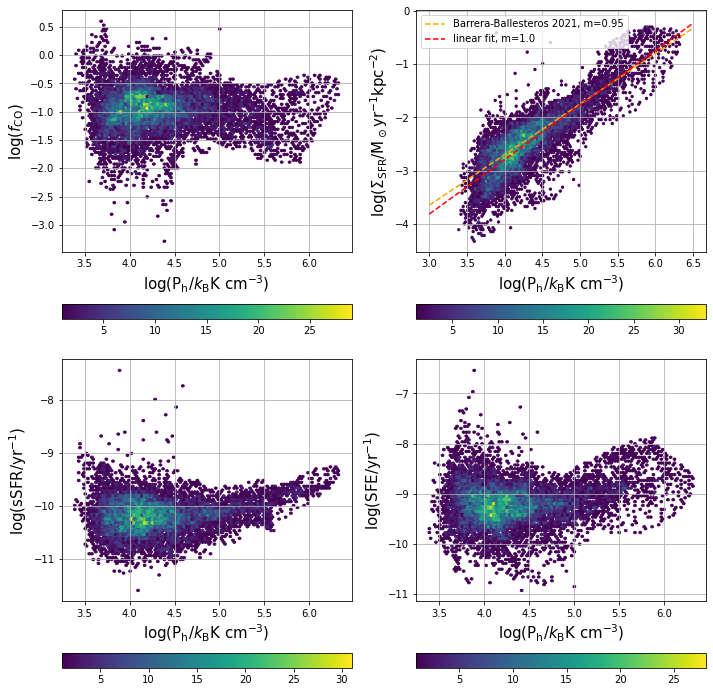

In [67]:
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_P_h_O3'])
pearson = linregress(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR'])
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR','log_sSFR','log_SFE_O3'],
                          [r'$f_\mathrm{mol}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF['log_P_h_O3'],Database_SF[name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='orange',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson.slope*3.+pearson.intercept,pearson.slope*6.5+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

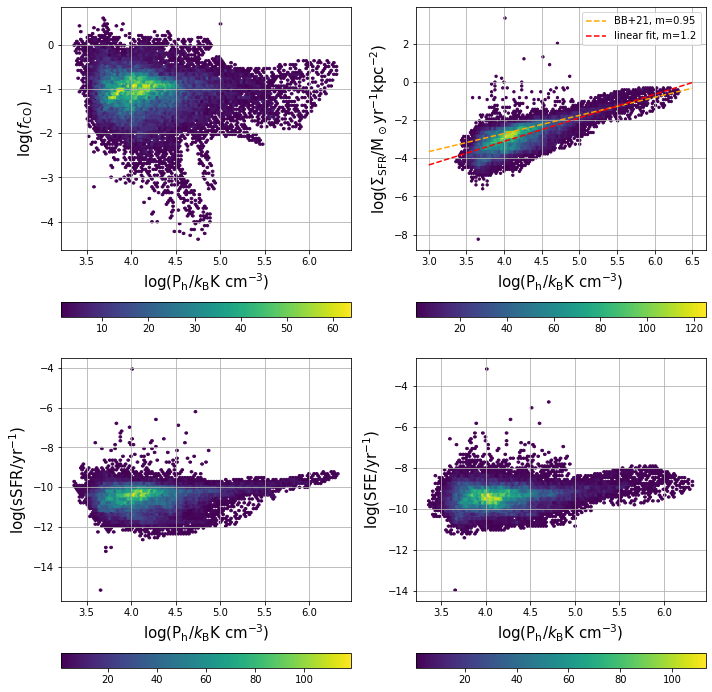

In [68]:
mask = np.isfinite(Database['log_S_SFR'])&np.isfinite(Database['log_P_h_O3'])
pearson = linregress(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR'])
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR','log_sSFR','log_SFE_O3'],
                          [r'$f_\mathrm{mol}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h_O3'],Database[name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='orange',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson.slope*3.+pearson.intercept,pearson.slope*6.5+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

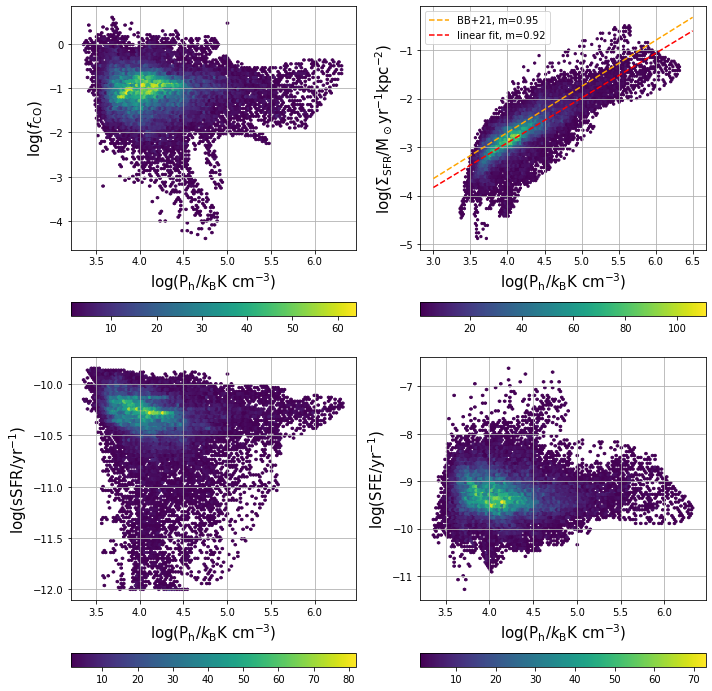

In [70]:
mask = np.isfinite(Database['log_S_SFR_D4'])&np.isfinite(Database['log_P_h_O3'])
pearson = linregress(Database.loc[mask,'log_P_h_O3'],Database.loc[mask,'log_S_SFR_D4'])
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_D4','log_sSFR_D4','log_SFE_O3_D4'],
                          [r'$f_\mathrm{mol}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h_O3'],Database[name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='orange',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson.slope*3.+pearson.intercept,pearson.slope*6.5+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


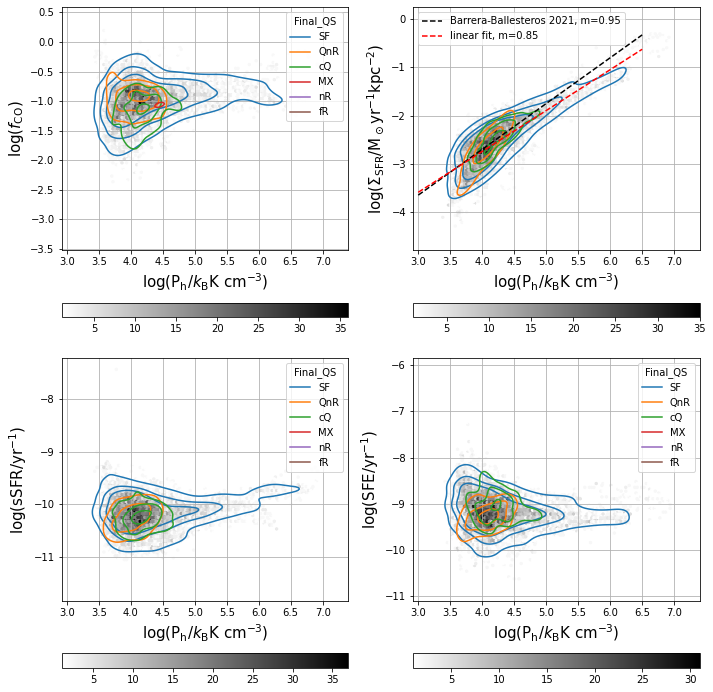

In [141]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO_MW','log_S_SFR','log_sSFR','log_SFE_MW'],
                          [r'$f_\mathrm{mol}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF['log_P_h_MW'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database_SF, x="log_P_h_MW", y=name,levels=[.25,.5,.75],hue="Final_QS",hue_order=stages,ax=ax)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson.slope*3.+pearson.intercept,pearson.slope*6.5+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


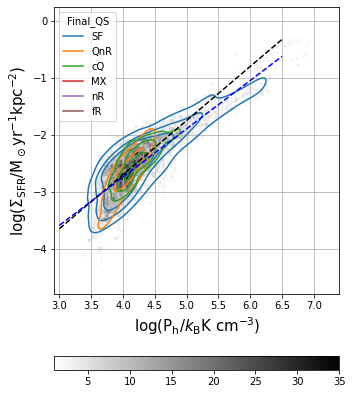

In [88]:
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_P_h_MW'])
pearson = linregress(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_S_SFR'])
fig, ax = plt.subplots(figsize=(5,6))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
ax.plot([3.,6.5],[pearson.slope*3.+pearson.intercept,pearson.slope*6.5+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.legend(loc='best')
im = ax.hexbin(Database_SF['log_P_h_MW'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal')
sns.kdeplot(Database_SF, x="log_P_h_MW", y="log_S_SFR",levels=[.25,.5,.75],hue="Final_QS",hue_order=stages,ax=ax)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
ax.grid(True)
#ax.legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


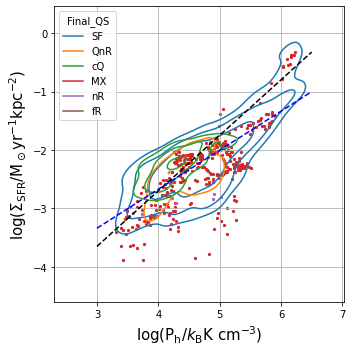

In [323]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
ax.legend(loc='best')
#im = ax.hexbin(Database_SF['log_P_h'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
#fig.colorbar(im,ax=ax,orientation='horizontal')
for name,color in zip(['MX','nR','fR'],['#d62728','#9467bd','#8c564b']):
    this_group = SF_byQS.get_group(name)
    ax.scatter(this_group['log_P_h'],this_group['log_S_SFR'],s=5,alpha=1,c=color)
sns.kdeplot(Database_SF, x="log_P_h", y="log_S_SFR",levels=[.25,.5,.75],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

In [140]:
median_quant_Ph = ['log_S_Mstar','log_S_SFR_final','log_S_mol_O3','log_P_h_O3','log_f_CO_O3','log_sSFR_final','log_SFE_O3_final','log_S_SFR_D4']
                   #'log_S_SFR','log_S_SFR_D4','log_sSFR','log_sSFR_D4','log_SFE_O3_D4','log_SFE_O3',,'CO_vdisp','star_vdisp','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2'

In [141]:
Ph_binwidth = 0.5
SF_byPh = Database_SF.groupby(create_bins(Database_SF['log_P_h_O3'],Ph_binwidth))
SF_byPh_median = SF_byPh[median_quant_Ph].median()

In [142]:
Ph_binwidth = 0.5
SF_byPh_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF['log_P_h_O3'],Ph_binwidth)])
SF_byPh_QS_median = SF_byPh_QS[median_quant_Ph].median()

In [143]:
Ph_binwidth = 0.5
total_byPh = Database.groupby(create_bins(Database['log_P_h_O3'],Ph_binwidth))
total_byPh_median = total_byPh[median_quant_Ph].median()

In [144]:
Ph_binwidth = 0.5
total_byPh_QS = Database.groupby([Database.loc[:,'Final_QS'],create_bins(Database['log_P_h_O3'],Ph_binwidth)])
total_byPh_QS_median = total_byPh_QS[median_quant_Ph].median()

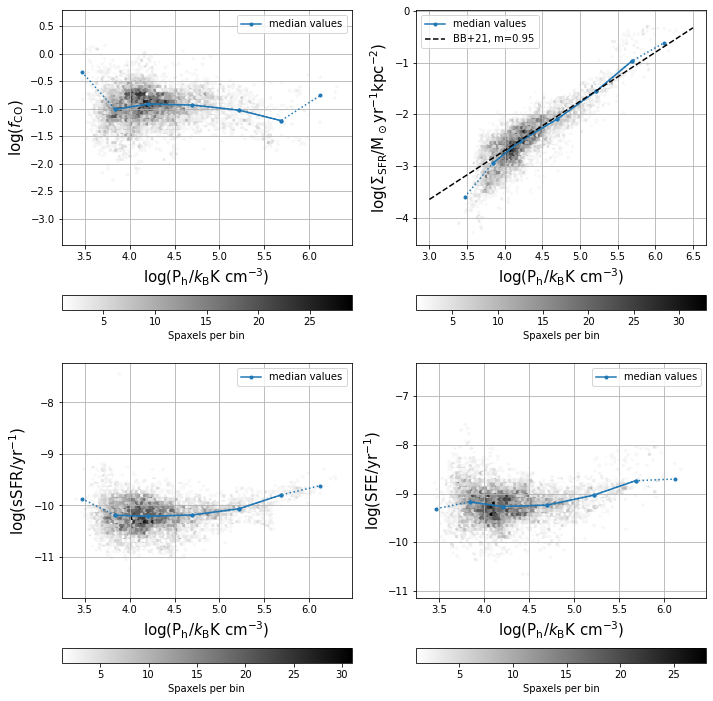

In [30]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR','log_sSFR','log_SFE_O3'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF['log_P_h_O3'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot(SF_byPh_median['log_P_h_O3'].to_numpy(),SF_byPh_median[name].to_numpy(),marker='.',ls=':',c='tab:blue')#,label='median values')
    count_mask = SF_byPh.count()['Source']>=100
    ax.plot(SF_byPh_median.loc[count_mask,'log_P_h_O3'].to_numpy(),SF_byPh_median.loc[count_mask,name].to_numpy(),marker='.',label='median values')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.legend(loc='best')
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
#axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

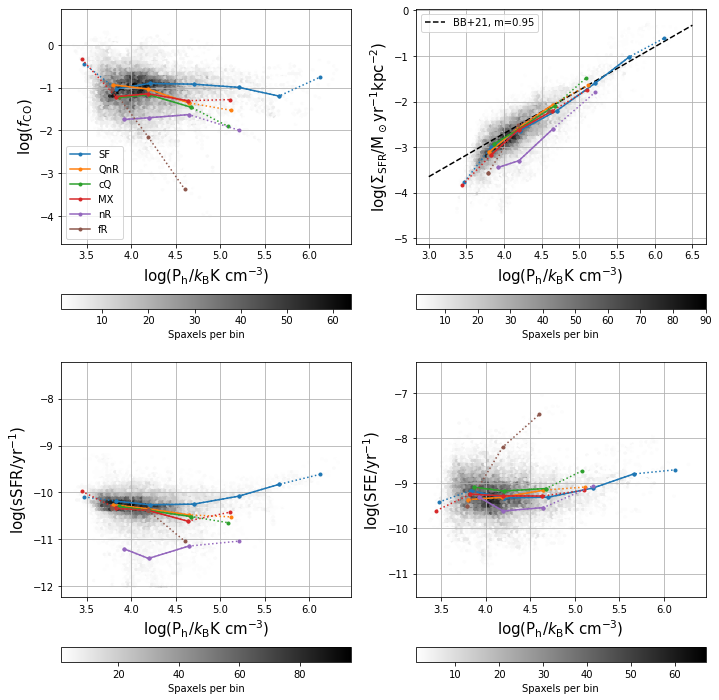

In [43]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
#axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h_O3'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    a.append(ax.get_ylim())
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

In [126]:
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_P_h_O3'])
pearson_SFR_Ph = linregress(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_S_SFR'])

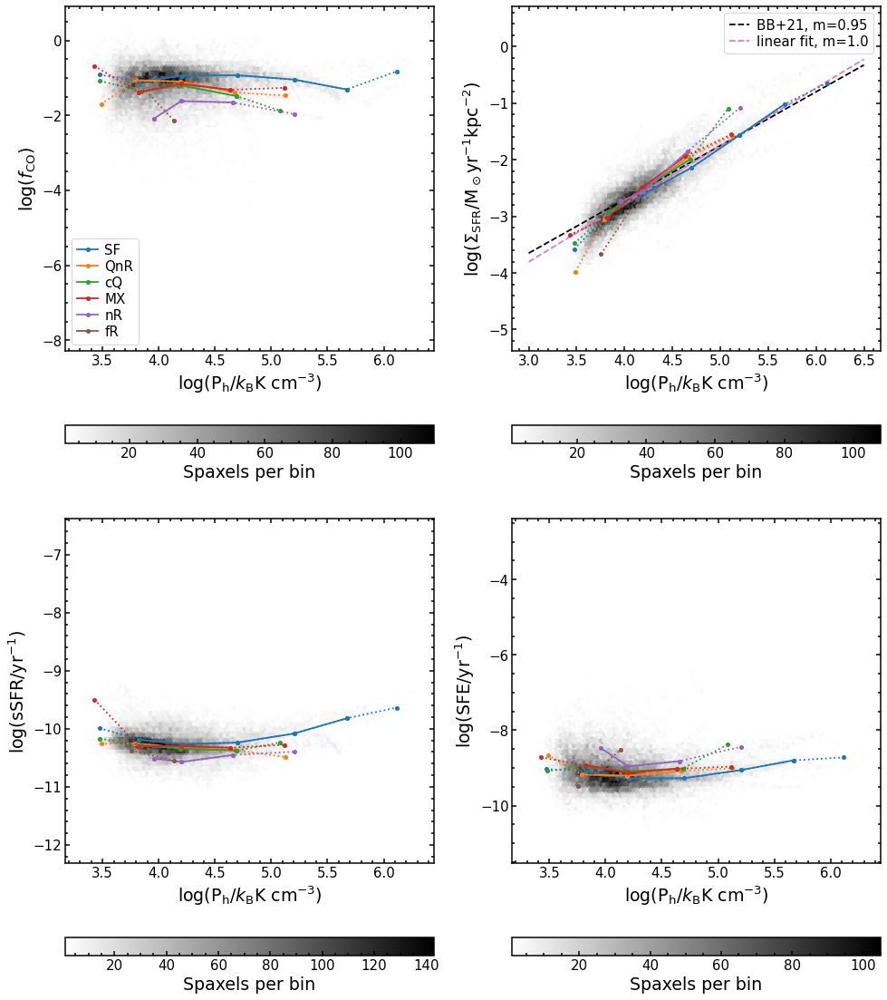

In [195]:
fig, axs = plt.subplots(2,2,figsize=(14,16))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='tab:pink',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h_O3'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label)#,size=15)
    #ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')#,size=15)
    #a.append(ax.get_ylim())
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

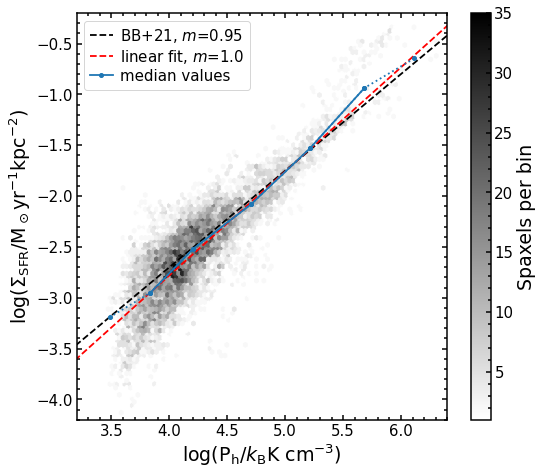

In [128]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
#axs[0,1].legend(loc='best')
#for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
#                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database_SF['log_P_h_O3'],Database_SF['log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.2,6.4,-4.2,-0.2))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
#for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
ax.plot(SF_byPh_median['log_P_h_O3'].to_numpy(),
        SF_byPh_median['log_S_SFR_final'].to_numpy(),marker='.',c='tab:blue',ls=':')
count_mask = SF_byPh.count()['Source']>=100
ax.plot(SF_byPh_median['log_P_h_O3'][count_mask].to_numpy(),
        SF_byPh_median['log_S_SFR_final'][count_mask].to_numpy(),marker='.',c='tab:blue',label='median values')
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.4)
ax.set_ylim(-4.2,-0.2)
ax.legend(loc='best')
fig.tight_layout()
plt.show()

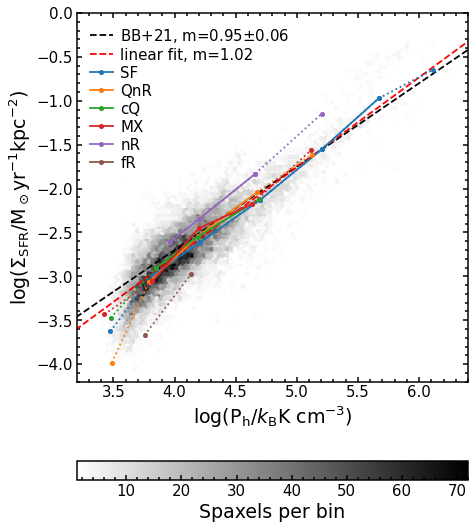

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(7,8))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.3}')
#axs[0,1].legend(loc='best')
#for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
#                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database['log_P_h_O3'],Database['log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.2,6.4,-4.2,-0.2))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_S_SFR_final'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_S_SFR_final'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.4)
ax.set_ylim(-4.2,-0.)
ax.legend(loc='upper left',frameon=False)
fig.tight_layout()
fig.savefig(figurepath+'QS_Ph-SFR')
#fig.savefig(colloquiumpath+'QS_Ph-SFR.png')
plt.show()

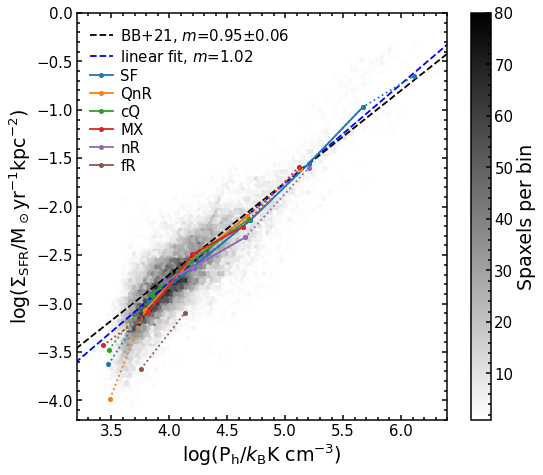

In [148]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.3}')
#axs[0,1].legend(loc='best')
#for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
#                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database['log_P_h_O3'],Database['log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.2,6.4,-4.2,-0.2))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_S_SFR_final'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_S_SFR_final'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.4)
ax.set_ylim(-4.2,-0.)
ax.legend(loc='upper left',frameon=False)
fig.tight_layout()
fig.savefig(figurepath+'QS_Ph-SFR')
#fig.savefig(colloquiumpath+'QS_Ph-SFR.png')
plt.show()

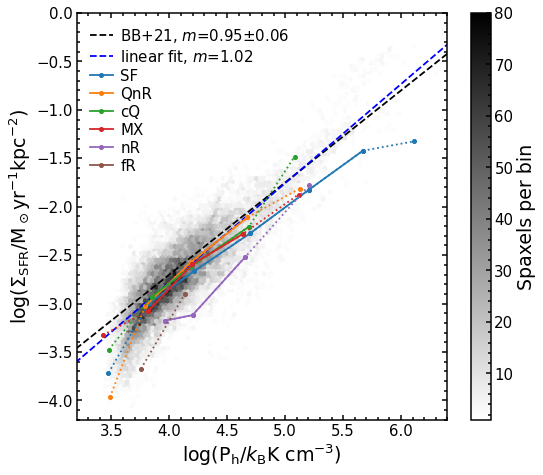

In [150]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}$\pm$0.06')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.3}')
#axs[0,1].legend(loc='best')
#for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
#                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database['log_P_h_O3'],Database['log_S_SFR_final'],mincnt=1,cmap='binary',extent=(3.2,6.4,-4.2,-0.2))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_S_SFR_D4'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_S_SFR_D4'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.4)
ax.set_ylim(-4.2,-0.)
ax.legend(loc='upper left',frameon=False)
fig.tight_layout()
#fig.savefig(figurepath+'QS_Ph-SFR')
#fig.savefig(colloquiumpath+'QS_Ph-SFR.png')
plt.show()

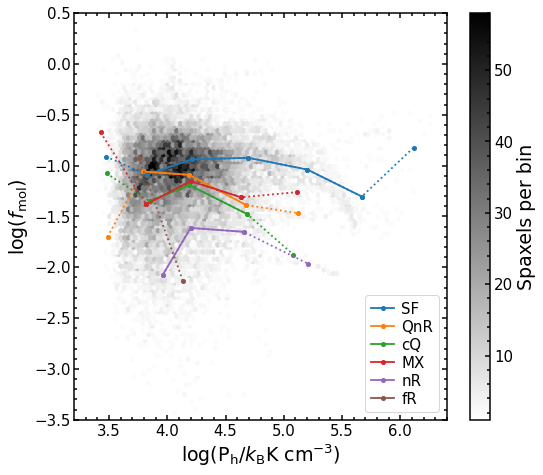

In [130]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#axs[0,1].legend(loc='best')
#for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
#                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database['log_P_h_O3'],Database['log_f_CO_O3'],mincnt=1,cmap='binary',extent=(3.2,6.4,-3.5,0.5))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_f_CO_O3'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_f_CO_O3'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($f_\mathrm{mol}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.4)
ax.set_ylim(-3.5,0.5)
ax.legend(loc='lower right')
fig.tight_layout()
fig.savefig(figurepath+'QS_Ph-fmol')
#fig.savefig(colloquiumpath+'QS_Ph-fmol.png')
plt.show()

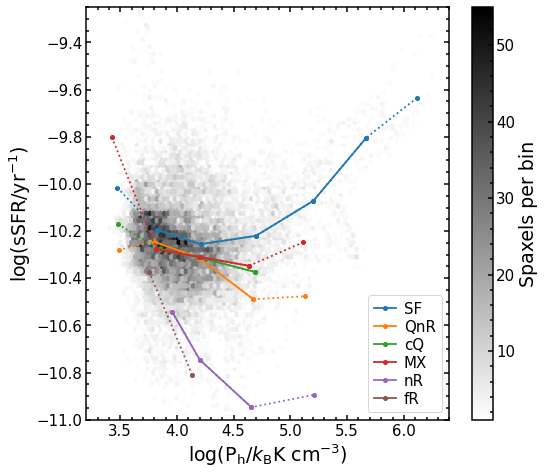

In [131]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#axs[0,1].legend(loc='best')
#for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
#                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database['log_P_h_O3'],Database['log_sSFR_final'],mincnt=1,cmap='binary',extent=(3.2,6.4,-11,-9.25))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_sSFR_final'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_sSFR_final'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log(sSFR/yr$^{-1}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.4)
ax.set_ylim(-11,-9.25)
ax.legend(loc='lower right')
fig.tight_layout()
fig.savefig(figurepath+'QS_Ph-sSFR')
#fig.savefig(colloquiumpath+'QS_Ph-sSFR.png')
plt.show()

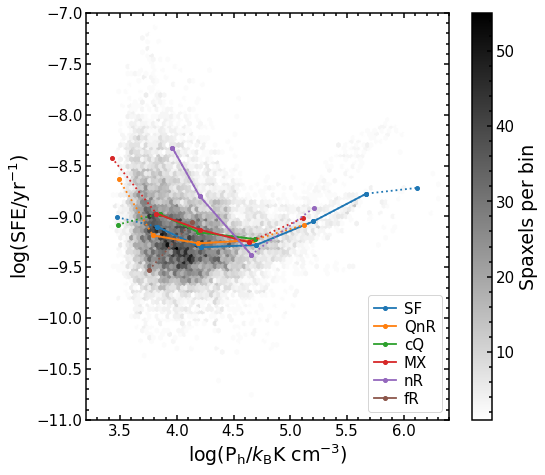

In [132]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
#axs[0,1].legend(loc='best')
#for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_final','log_sSFR_final','log_SFE_O3_final'],
#                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database['log_P_h_O3'],Database['log_SFE_O3_final'],mincnt=1,cmap='binary',extent=(3.2,6.4,-11,-7))
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_SFE_O3_final'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                total_byPh_QS_median.loc[(QS,),'log_SFE_O3_final'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log(SFE/yr$^{-1}$)')
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')
ax.set_xlim(3.2,6.4)
ax.set_ylim(-11,-7)
ax.legend(loc='lower right')
fig.tight_layout()
fig.savefig(figurepath+'QS_Ph-SFE')
#fig.savefig(colloquiumpath+'QS_Ph-SFE.png')
plt.show()

In [145]:
SMstar_binwidth = 0.5
total_bySMstar_QS = Database.groupby([Database.loc[:,'Final_QS'],create_bins(Database['log_S_Mstar'],SMstar_binwidth)])
total_bySMstar_QS_median = total_bySMstar_QS[median_quant_Ph].median()

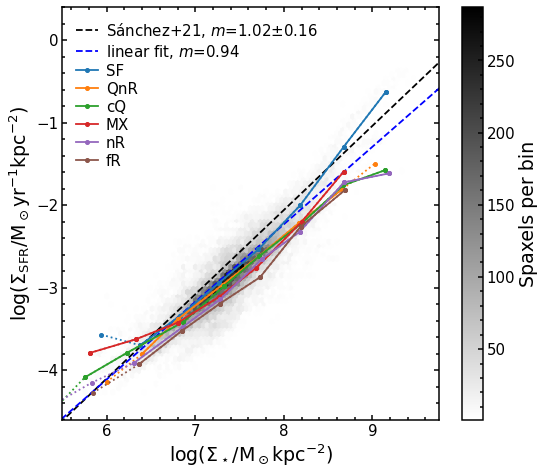

In [151]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02$\pm$0.16')
ax.plot([5.,10],[pearson.slope*5.+pearson.intercept,pearson.slope*10+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_bySMstar_QS_median.loc[(QS,),'log_S_Mstar'].to_numpy(),
                total_bySMstar_QS_median.loc[(QS,),'log_S_SFR_final'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_bySMstar_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_bySMstar_QS_median.loc[(QS,),'log_S_Mstar'][count_mask].to_numpy(),
                total_bySMstar_QS_median.loc[(QS,),'log_S_SFR_final'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0.4)
ax.legend(loc='upper left',frameon=False)
fig.tight_layout()
fig.savefig(figurepath+'QS_Mstar-SFR')
#fig.savefig(colloquiumpath+'QS_Mstar-SFR.png')
plt.show()

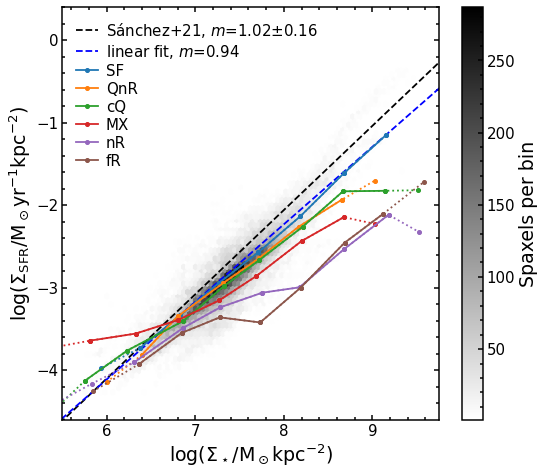

In [152]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR_final'])
ax.plot([5.,10],[(5.-6)*1.02-10.1+6,(10-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', $m$=1.02$\pm$0.16')
ax.plot([5.,10],[pearson.slope*5.+pearson.intercept,pearson.slope*10+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_bySMstar_QS_median.loc[(QS,),'log_S_Mstar'].to_numpy(),
                total_bySMstar_QS_median.loc[(QS,),'log_S_SFR_D4'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_bySMstar_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_bySMstar_QS_median.loc[(QS,),'log_S_Mstar'][count_mask].to_numpy(),
                total_bySMstar_QS_median.loc[(QS,),'log_S_SFR_D4'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')#,size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')#,size=15)
ax.set_xlim(5.5,9.75)
ax.set_ylim(-4.6,0.4)
ax.legend(loc='upper left',frameon=False)
fig.tight_layout()
#fig.savefig(figurepath+'QS_Mstar-SFR')
#fig.savefig(colloquiumpath+'QS_Mstar-SFR.png')
plt.show()

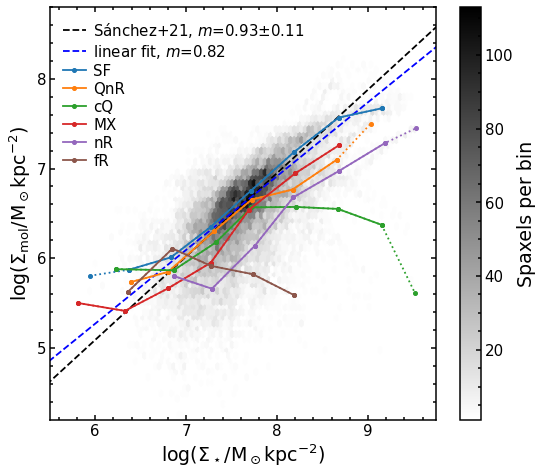

In [153]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3'])
ax.plot([5.,10],[(5.-6)*0.93-0.91+6,(10-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.93$\pm$0.11')
ax.plot([5.,10],[pearson.slope*5.+pearson.intercept,pearson.slope*10+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
im = ax.hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_bySMstar_QS_median.loc[(QS,),'log_S_Mstar'].to_numpy(),
                total_bySMstar_QS_median.loc[(QS,),'log_S_mol_O3'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_bySMstar_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_bySMstar_QS_median.loc[(QS,),'log_S_Mstar'][count_mask].to_numpy(),
                total_bySMstar_QS_median.loc[(QS,),'log_S_mol_O3'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(5.5,9.75)
ax.set_ylim(4.2,8.8)
ax.legend(loc='upper left',frameon=False)
fig.tight_layout()
fig.savefig(figurepath+'QS_Mstar-Smol')
#fig.savefig(colloquiumpath+'QS_Mstar-Smol.png')
plt.show()

In [136]:
Smol_binwidth = 0.5
total_bySmol_QS = Database.groupby([Database.loc[:,'Final_QS'],create_bins(Database['log_S_mol_O3'],Smol_binwidth)])
total_bySmol_QS_median = total_bySmol_QS[median_quant_Ph].median()

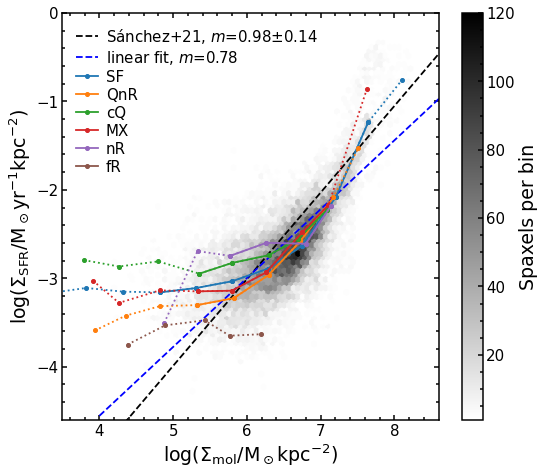

In [154]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
mask = np.isfinite(Database_SF['log_S_SFR_final'])&np.isfinite(Database_SF['log_S_mol_O3'])
pearson = linregress(Database_SF.loc[mask,'log_S_mol_O3'],Database_SF.loc[mask,'log_S_SFR_final'])
ax.plot([4.,9.],[(4.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', $m$=0.98$\pm$0.14')
ax.plot([4.,10],[pearson.slope*4.+pearson.intercept,pearson.slope*10+pearson.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
im = ax.hexbin(Database['log_S_mol_O3'],Database['log_S_SFR_final'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='vertical',label=r'Spaxels per bin')
for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot(total_bySmol_QS_median.loc[(QS,),'log_S_mol_O3'].to_numpy(),
                total_bySmol_QS_median.loc[(QS,),'log_S_SFR_final'].to_numpy(),marker='.',c=color,ls=':')
        count_mask = total_bySmol_QS.count().loc[(QS,),'Source']>=100
        ax.plot(total_bySmol_QS_median.loc[(QS,),'log_S_mol_O3'][count_mask].to_numpy(),
                total_bySmol_QS_median.loc[(QS,),'log_S_SFR_final'][count_mask].to_numpy(),marker='.',c=color,label=QS)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)')
ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)')
ax.set_xlim(3.5,8.6)
ax.set_ylim(-4.6,0)
ax.legend(loc='upper left',frameon=False)
fig.tight_layout()
fig.savefig(figurepath+'QS_Smol-SFR')
#fig.savefig(colloquiumpath+'QS_Smol-SFR.png')
plt.show()

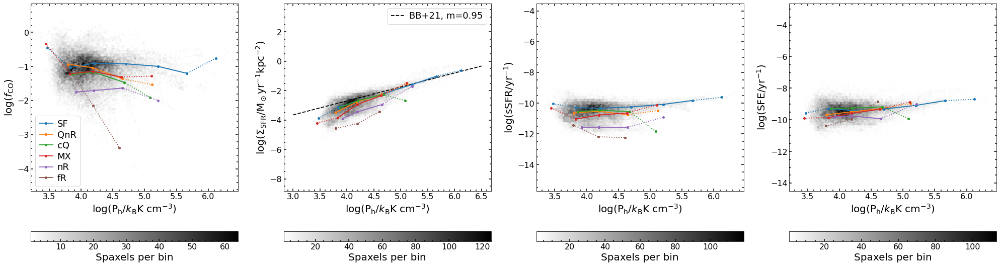

In [42]:
fig, axs = plt.subplots(1,4,figsize=(28,8))
axs[1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
#axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[1].legend(loc='best')
for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR','log_sSFR','log_SFE_O3'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h_O3'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label)#,size=15)
    #ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)')#,size=15)
    #a.append(ax.get_ylim())
axs[0].legend(loc='best')
fig.tight_layout()
plt.show()

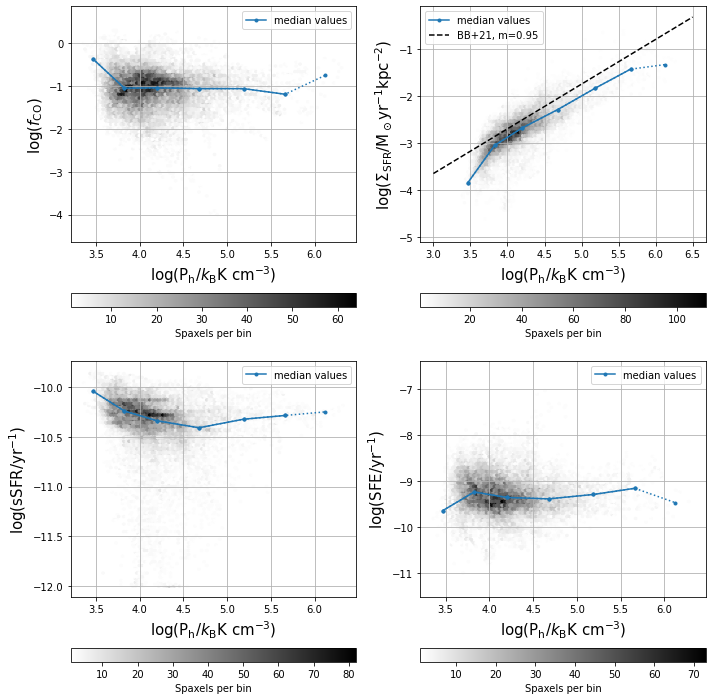

In [94]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_D4','log_sSFR_D4','log_SFE_O3_D4'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h_O3'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot(total_byPh_median['log_P_h_O3'].to_numpy(),total_byPh_median[name].to_numpy(),marker='.',ls=':',c='tab:blue')#,label='median values')
    count_mask = total_byPh.count()['Source']>=100
    ax.plot(total_byPh_median.loc[count_mask,'log_P_h_O3'].to_numpy(),total_byPh_median.loc[count_mask,name].to_numpy(),marker='.',label='median values')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.legend(loc='best')
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
#axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

In [33]:
a = []

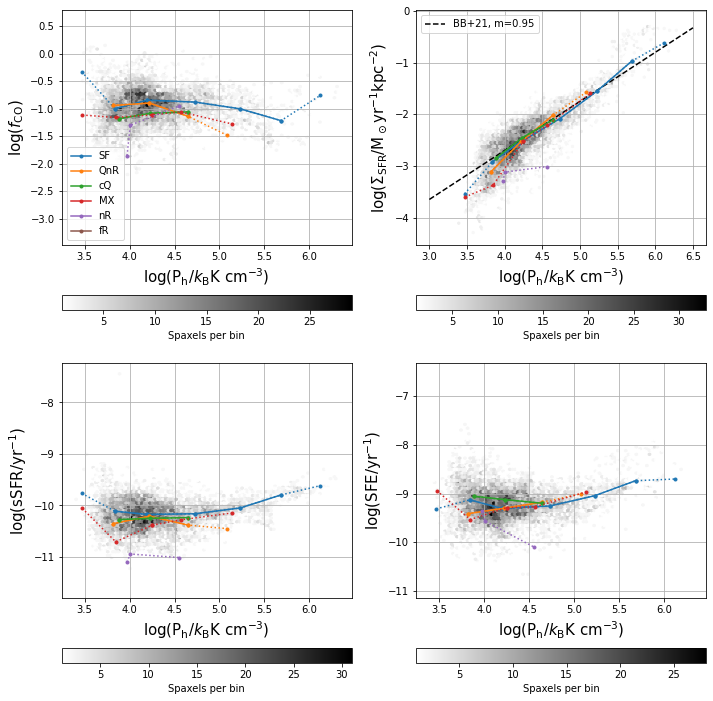

In [99]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
#axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR','log_sSFR','log_SFE_O3'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF['log_P_h_O3'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(SF_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                    SF_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = SF_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(SF_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                    SF_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    a.append(ax.get_ylim())
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

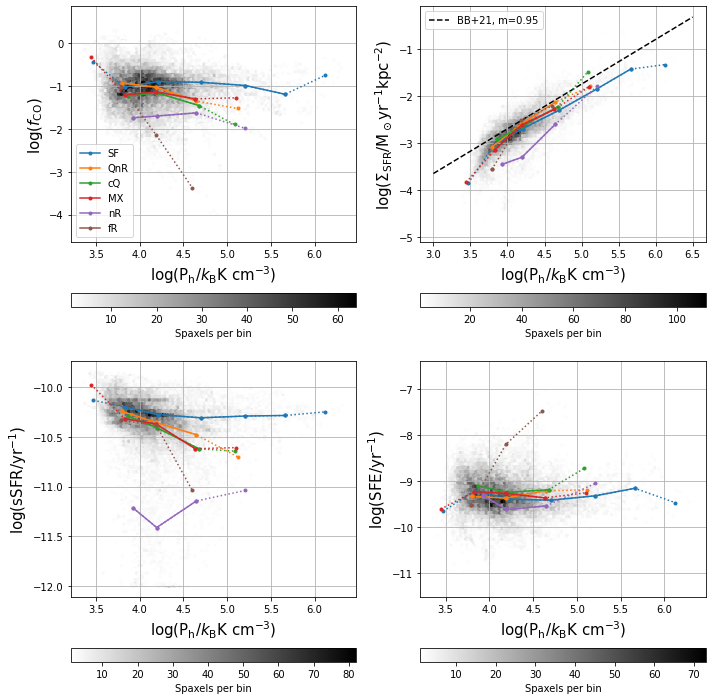

In [105]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
#axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label in zip(axs.ravel(),['log_f_CO_O3','log_S_SFR_D4','log_sSFR_D4','log_SFE_O3_D4'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h_O3'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h_O3'][count_mask].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    a.append(ax.get_ylim())
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

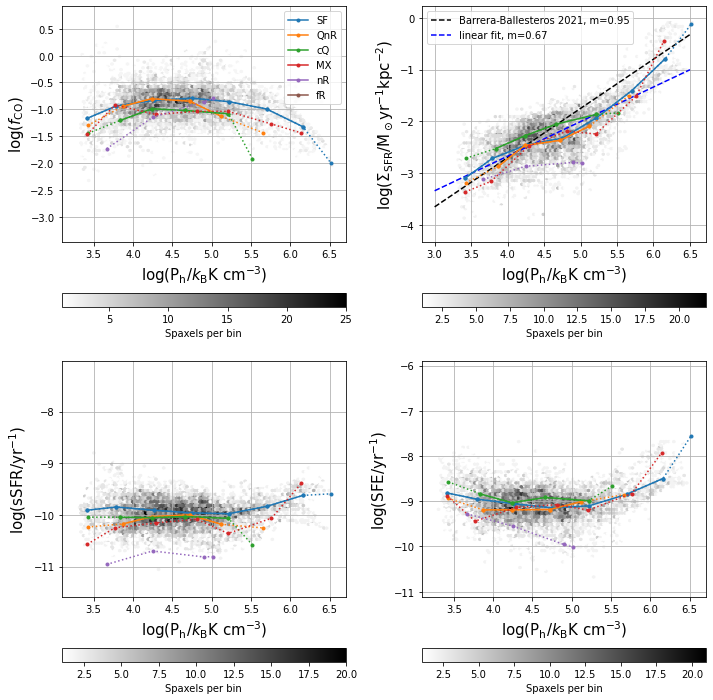

In [251]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF.loc[CO_mask_SF,'log_P_h'],Database_SF.loc[CO_mask_SF,name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(SF_byPh_QS_median.loc[(QS,),'log_P_h'].to_numpy(),
                    SF_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = SF_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(SF_byPh_QS_median.loc[(QS,),'log_P_h'][count_mask].to_numpy(),
                    SF_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    a.append(ax.get_ylim())
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

In [252]:
a

[(-3.4719693034498906, 0.9196366442357873),
 (-4.32803674074123, 0.220749104497311),
 (-11.591211343187538, -7.029288030794044),
 (-11.120960880033207, -5.907999861933233)]

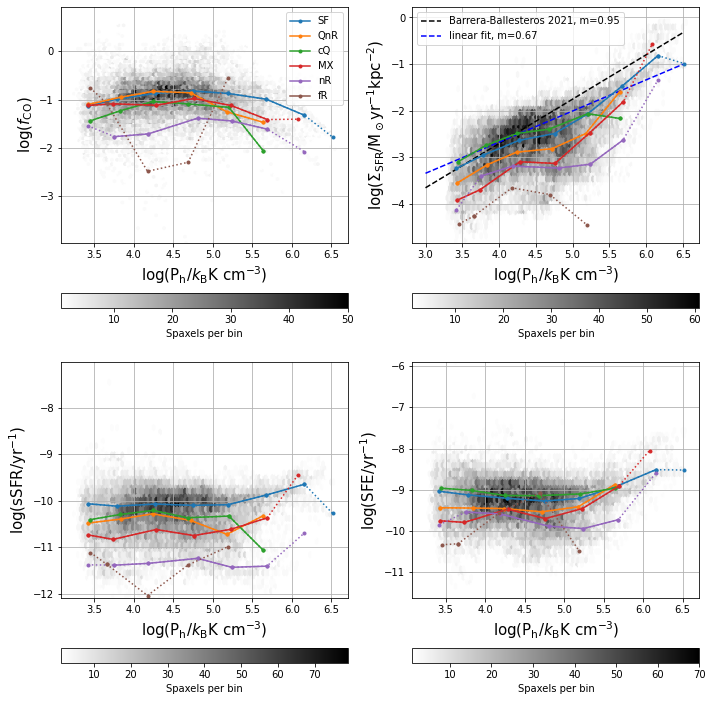

In [256]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label,i in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                               [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)'],np.arange(4)):
    im = ax.hexbin(Database['log_P_h'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h'].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h'][count_mask].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylim(ymin=a[i][0]-0.5,ymax=a[i][1])
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


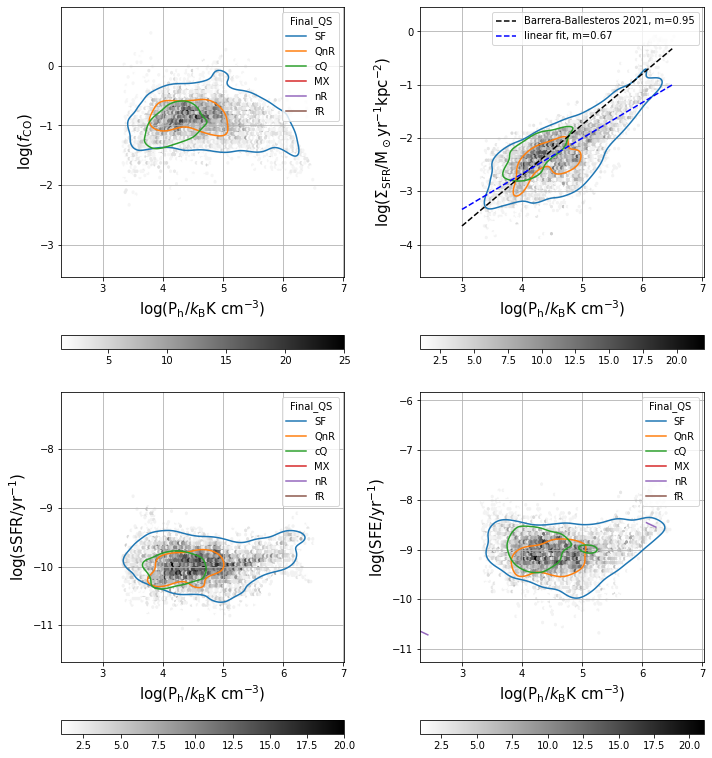

In [210]:
fig, axs = plt.subplots(2,2,figsize=(10,11))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                          [r'$f_\mathrm{mol}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF.loc[CO_mask_SF,'log_P_h'],Database_SF.loc[CO_mask_SF,name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database_SF, x="log_P_h", y=name,levels=[.35],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21'+f', $m$={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', $m$={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

# Dependence on R$_{gal}$/R$_{e}$

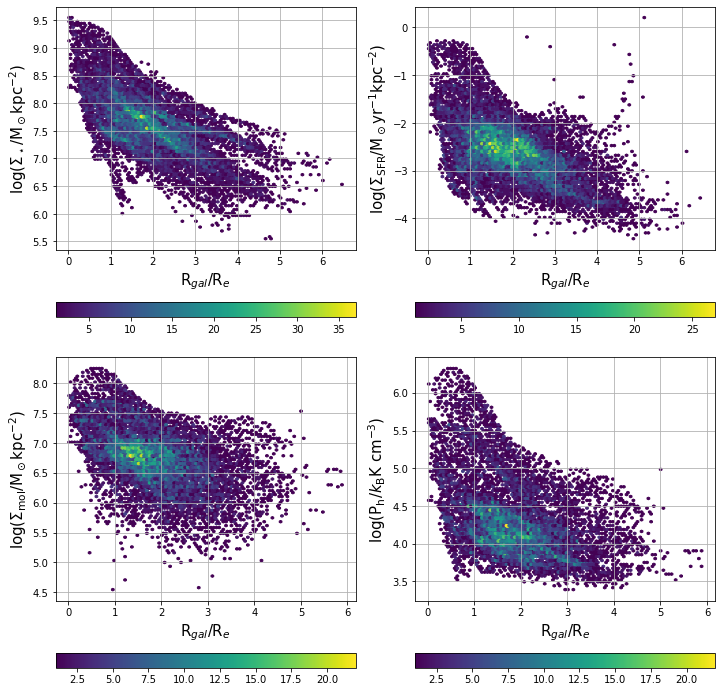

In [103]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3','log_P_h_O3'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

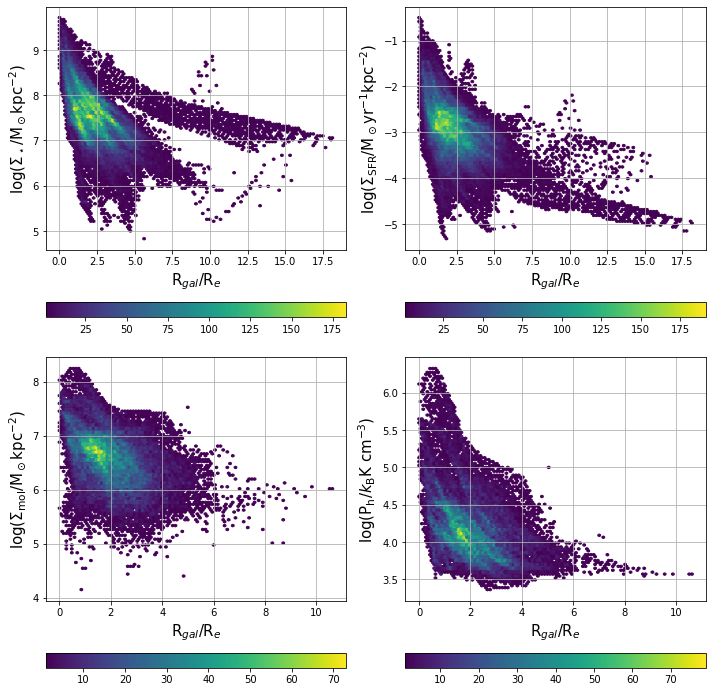

In [111]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR_D4','log_S_mol_O3','log_P_h_O3'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

In [107]:
median_quant_Rgal = ['Rgal_Re','log_S_Mstar','log_S_SFR','log_S_SFR_D4','log_S_mol_O3','log_f_CO_O3','log_sSFR','log_sSFR_D4','log_SFE_O3','log_SFE_O3_D4','log_P_h_O3','CO_vdisp','star_vdisp','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2']
#['Rgal_Re','log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']

In [108]:
Rgal_binwidth = 1.
SF_byRgal = Database_SF.groupby(create_bins(Database_SF.loc[:,'Rgal_Re'],Rgal_binwidth))
SF_byRgal_median = SF_byRgal[median_quant_Rgal].median()

In [109]:
Rgal_binwidth = 1.
SF_byRgal_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'Rgal_Re'],Rgal_binwidth)])
SF_byRgal_QS_median = SF_byRgal_QS[median_quant_Rgal].median()

In [112]:
Rgal_binwidth = 1.
total_byRgal = Database.groupby(create_bins(Database.loc[:,'Rgal_Re'],Rgal_binwidth))
total_byRgal_median = total_byRgal[median_quant_Rgal].median()

In [113]:
Rgal_binwidth = 1.
total_byRgal_QS = Database.groupby([Database.loc[:,'Final_QS'],create_bins(Database.loc[:,'Rgal_Re'],Rgal_binwidth)])
total_byRgal_QS_median = total_byRgal_QS[median_quant_Rgal].median()

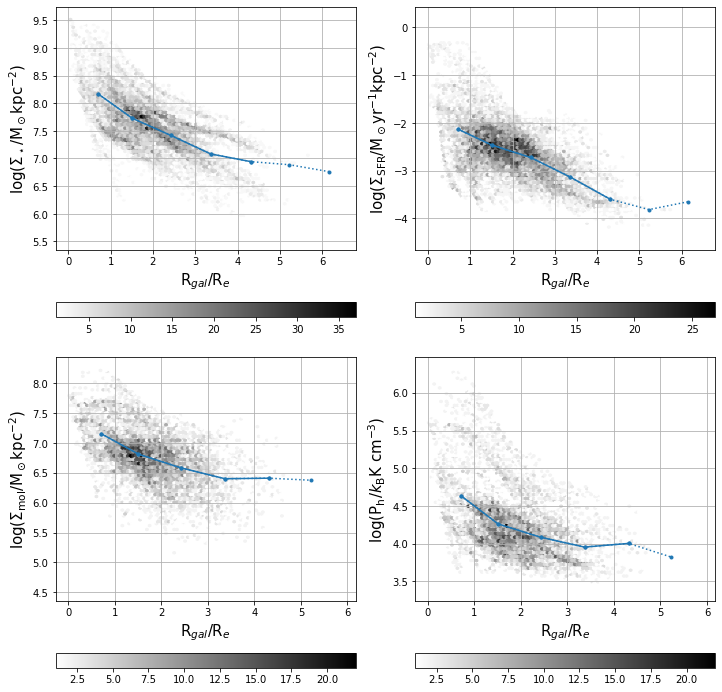

In [110]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3','log_P_h_O3'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.plot(SF_byRgal_median['Rgal_Re'].to_numpy(),SF_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    ax.plot(SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

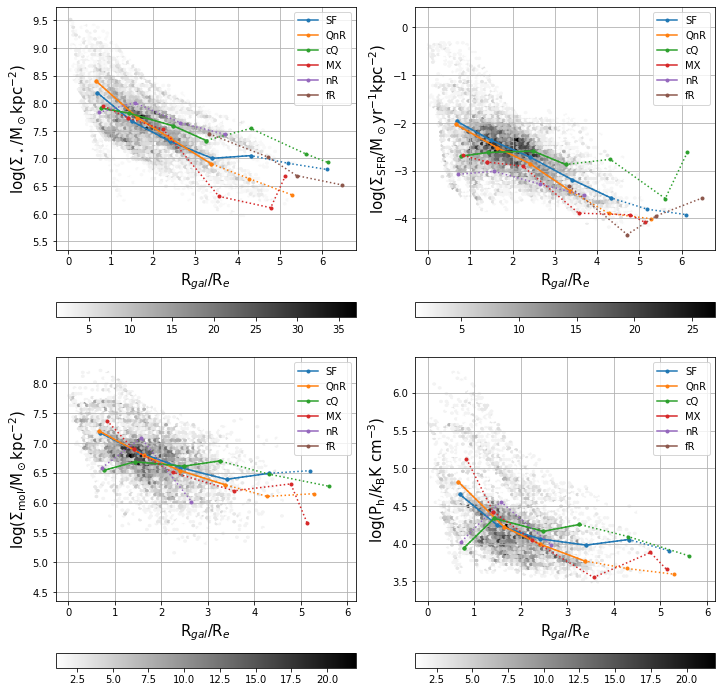

In [116]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3','log_P_h_O3'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(SF_byRgal_QS_median.loc[(QS,),'Rgal_Re'].to_numpy(),
                    SF_byRgal_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = SF_byRgal_QS.count().loc[(QS,),'Source']>=100
            ax.plot(SF_byRgal_QS_median.loc[(QS,),'Rgal_Re'][count_mask].to_numpy(),
                    SF_byRgal_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.legend(loc='best')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

In [47]:
np.unique(Database['Source'])

array(['CGCG429-012', 'IC1079', 'IC1528', 'IC2341', 'MCG-01-52-012',
       'MCG-02-02-030', 'NGC0001', 'NGC0155', 'NGC0171', 'NGC0180',
       'NGC0693', 'NGC0731', 'NGC0768', 'NGC1056', 'NGC1542', 'NGC2449',
       'NGC2540', 'NGC2554', 'NGC2595', 'NGC3300', 'NGC7025', 'NGC7194',
       'NGC7311', 'NGC7321', 'NGC7364', 'NGC7466', 'NGC7489', 'NGC7625',
       'NGC7716', 'UGC00312', 'UGC00335NED02', 'UGC02099', 'UGC04455',
       'UGC08781', 'UGC11649', 'UGC11680NED02', 'UGC12224', 'UGC12250',
       'UGC12274', 'UGC12348'], dtype=object)

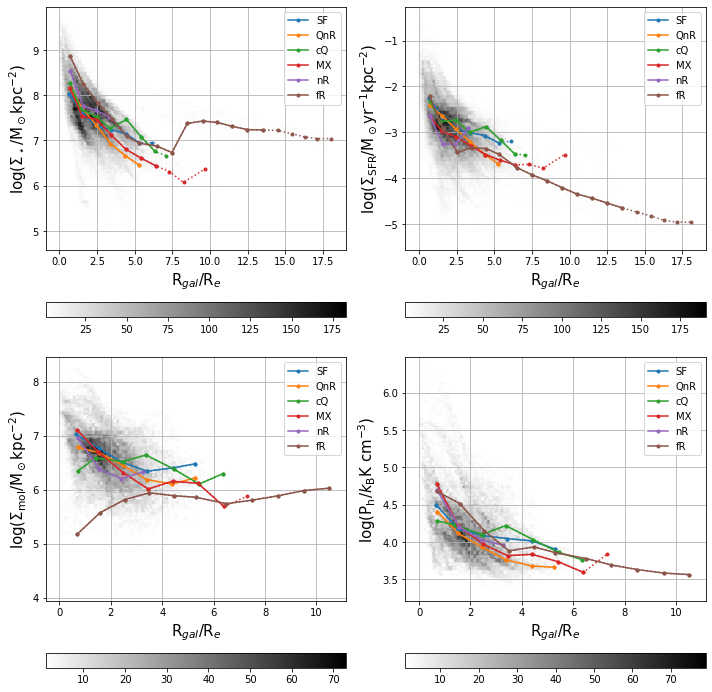

In [117]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR_D4','log_S_mol_O3','log_P_h_O3'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byRgal_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'][count_mask].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.legend(loc='best')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

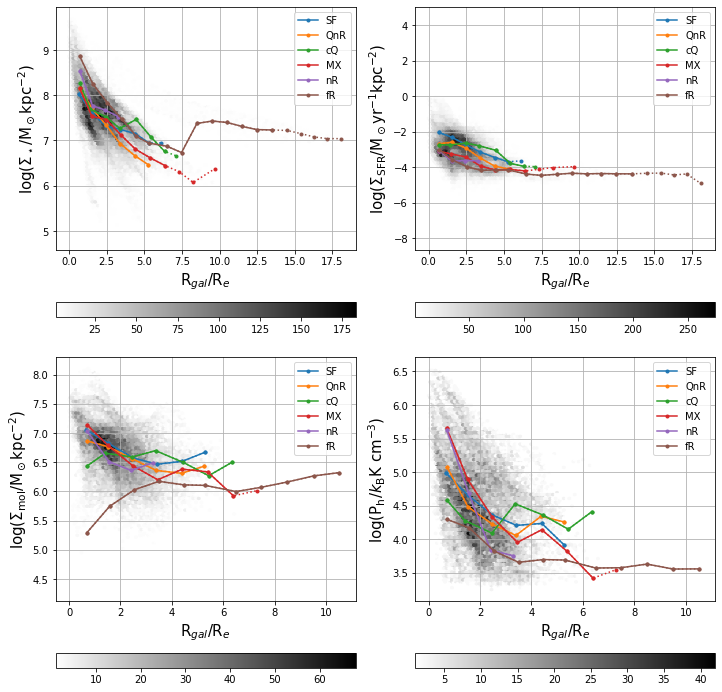

In [207]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byRgal_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'][count_mask].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.legend(loc='best')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


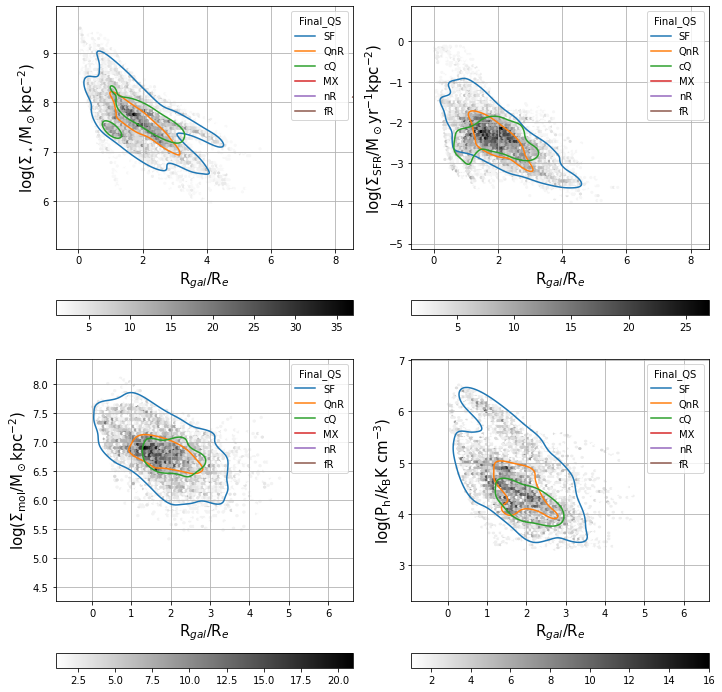

In [211]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database_SF, x="Rgal_Re", y=name,levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=ax)
    #ax.plot(SF_byRgal_median['Rgal_Re'].to_numpy(),SF_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    #ax.plot(SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


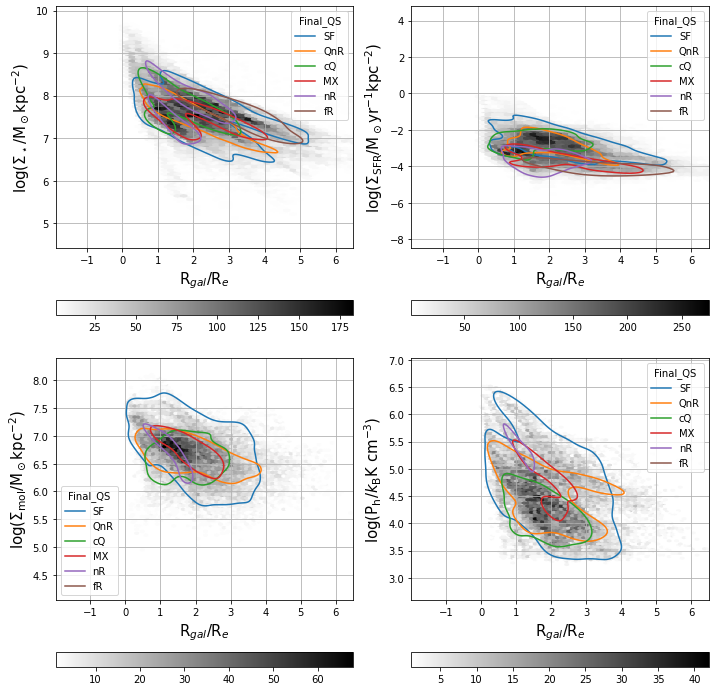

In [220]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database, x="Rgal_Re", y=name,levels=[.35],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
    #ax.plot(SF_byRgal_median['Rgal_Re'].to_numpy(),SF_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    #ax.plot(SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    ax.set_xlim(xmax=6.5)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

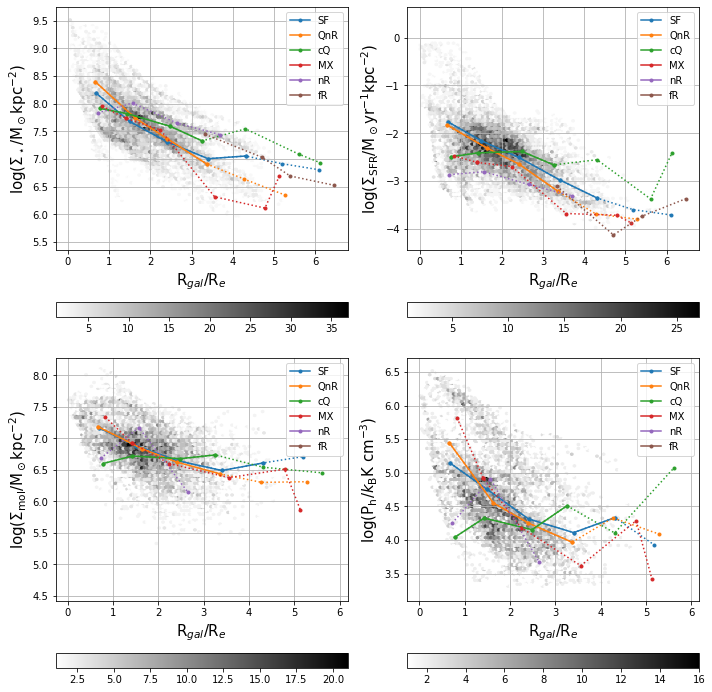

In [206]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(SF_byRgal_QS_median.loc[(QS,),'Rgal_Re'].to_numpy(),
                    SF_byRgal_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = SF_byRgal_QS.count().loc[(QS,),'Source']>=100
            ax.plot(SF_byRgal_QS_median.loc[(QS,),'Rgal_Re'][count_mask].to_numpy(),
                    SF_byRgal_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.legend(loc='best')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

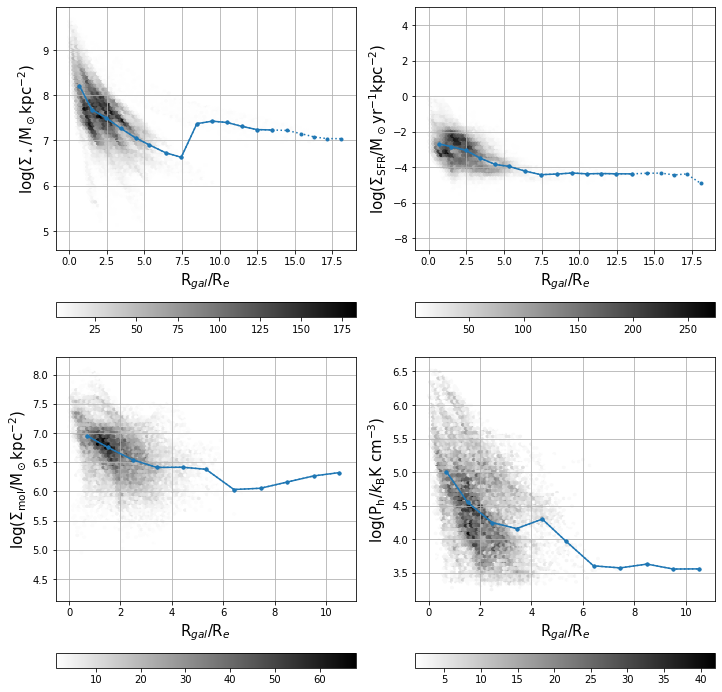

In [125]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.plot(total_byRgal_median['Rgal_Re'].to_numpy(),total_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    ax.plot(total_byRgal_median.loc[total_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),total_byRgal_median.loc[total_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

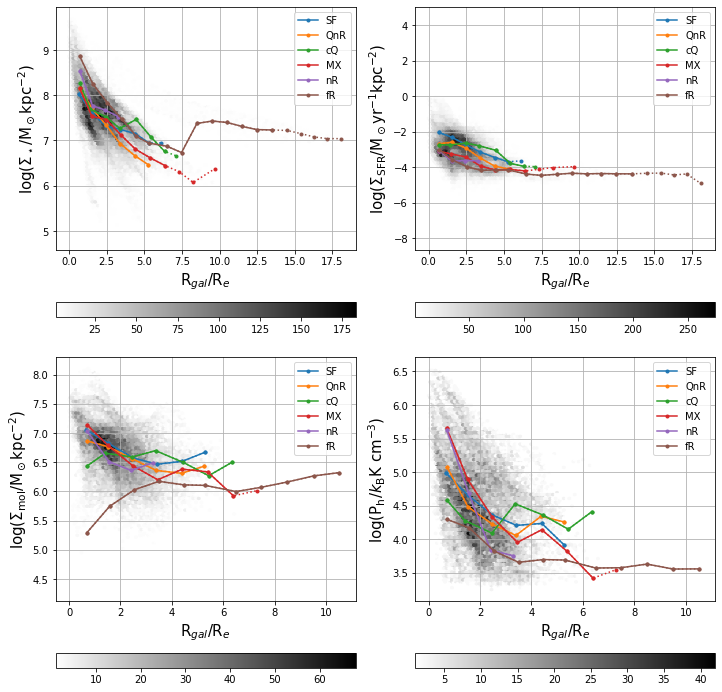

In [207]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byRgal_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'][count_mask].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.legend(loc='best')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

# Correlations between $\Sigma_\star$, $\Sigma_\mathrm{SFR}$, and $\Sigma_\mathrm{mol}$

In [213]:
mask = np.isfinite(Database_SF['log_S_SFR'])#SFR_mask_SF#
pearsonSF_SFR_Mstar = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_mol_O3N2'])#SFR_mask_SF&CO_mask_SF&Ph_mask_SF
pearsonSF_SFR_mol = linregress(Database_SF.loc[mask,'log_S_mol_O3N2'],Database_SF.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database_SF['log_S_mol_O3N2'])#CO_mask_SF&Ph_mask_SF
pearsonSF_mol_Mstar = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3N2'])

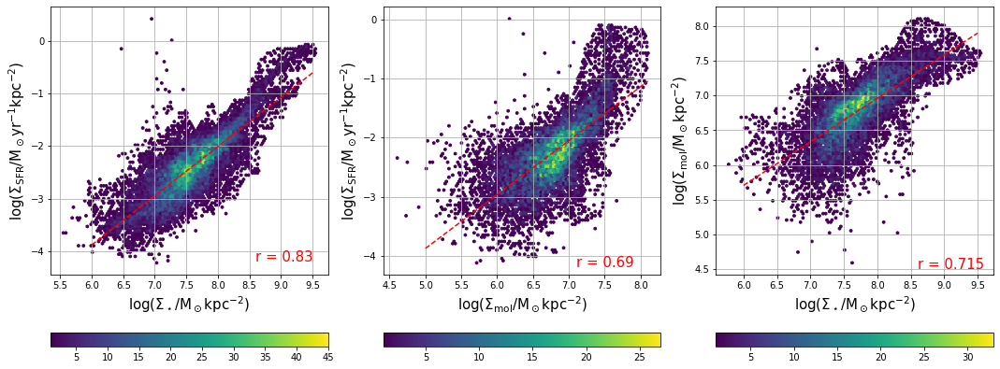

In [214]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsonSF_SFR_Mstar.intercept+6.*pearsonSF_SFR_Mstar.slope,pearsonSF_SFR_Mstar.intercept+9.5*pearsonSF_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'$r$ = {pearsonSF_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database_SF['log_S_mol_O3N2'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsonSF_SFR_mol.intercept+5.*pearsonSF_SFR_mol.slope,pearsonSF_SFR_mol.intercept+8.1*pearsonSF_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'$r$ = {pearsonSF_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3N2'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsonSF_mol_Mstar.intercept+6.*pearsonSF_mol_Mstar.slope,pearsonSF_mol_Mstar.intercept+9.5*pearsonSF_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'$r$ = {pearsonSF_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

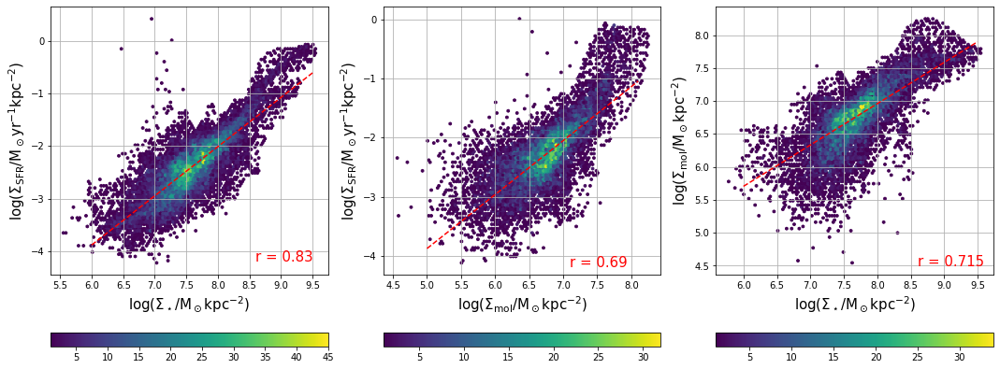

In [222]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsonSF_SFR_Mstar.intercept+6.*pearsonSF_SFR_Mstar.slope,pearsonSF_SFR_Mstar.intercept+9.5*pearsonSF_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'$r$ = {pearsonSF_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database_SF['log_S_mol_O3N2_new'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsonSF_SFR_mol.intercept+5.*pearsonSF_SFR_mol.slope,pearsonSF_SFR_mol.intercept+8.1*pearsonSF_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'$r$ = {pearsonSF_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3N2_new'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsonSF_mol_Mstar.intercept+6.*pearsonSF_mol_Mstar.slope,pearsonSF_mol_Mstar.intercept+9.5*pearsonSF_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'$r$ = {pearsonSF_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


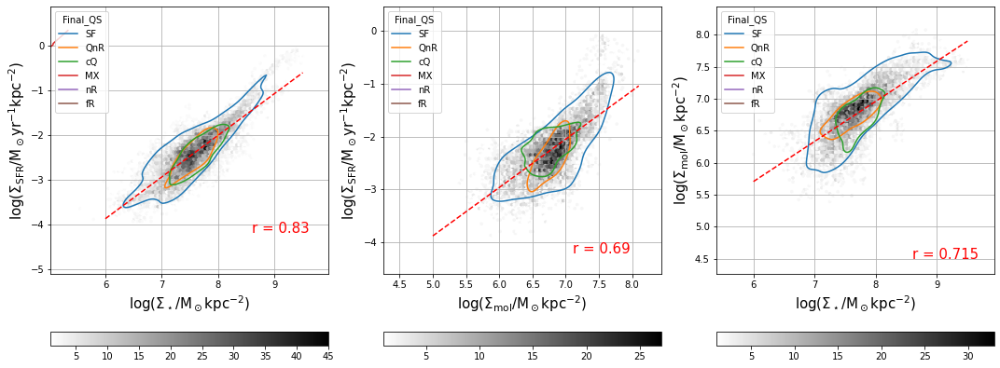

In [217]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsonSF_SFR_Mstar.intercept+6.*pearsonSF_SFR_Mstar.slope,pearsonSF_SFR_Mstar.intercept+9.5*pearsonSF_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'$r$ = {pearsonSF_SFR_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database_SF, x="log_S_Mstar", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[0])
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database_SF['log_S_mol_O3N2'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsonSF_SFR_mol.intercept+5.*pearsonSF_SFR_mol.slope,pearsonSF_SFR_mol.intercept+8.1*pearsonSF_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'$r$ = {pearsonSF_SFR_mol.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database_SF, x="log_S_mol_O3N2", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[1])
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3N2'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsonSF_mol_Mstar.intercept+6.*pearsonSF_mol_Mstar.slope,pearsonSF_mol_Mstar.intercept+9.5*pearsonSF_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'$r$ = {pearsonSF_mol_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database_SF, x="log_S_Mstar", y='log_S_mol_O3N2',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[2])
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

In [215]:
mask = np.isfinite(Database['log_S_SFR'])#SFR_mask_SF#
pearsontot_SFR_Mstar = linregress(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database['log_S_SFR'])&np.isfinite(Database['log_S_mol_O3N2'])#SFR_mask_SF&CO_mask_SF&Ph_mask_SF
pearsontot_SFR_mol = linregress(Database.loc[mask,'log_S_mol_O3N2'],Database.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database['log_S_mol_O3N2'])#CO_mask_SF&Ph_mask_SF
pearsontot_mol_Mstar = linregress(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_mol_O3N2'])

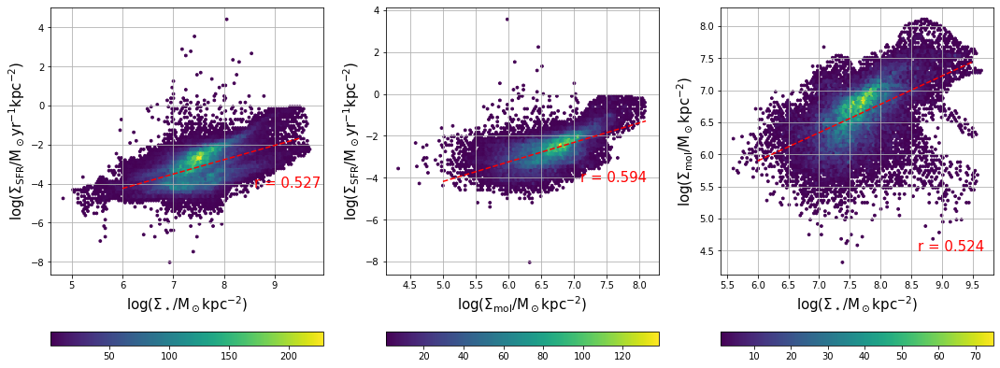

In [216]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database['log_S_Mstar'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsontot_SFR_Mstar.intercept+6.*pearsontot_SFR_Mstar.slope,pearsontot_SFR_Mstar.intercept+9.5*pearsontot_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'$r$ = {pearsontot_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database['log_S_mol_O3N2'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsontot_SFR_mol.intercept+5.*pearsontot_SFR_mol.slope,pearsontot_SFR_mol.intercept+8.1*pearsontot_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'$r$ = {pearsontot_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3N2'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsontot_mol_Mstar.intercept+6.*pearsontot_mol_Mstar.slope,pearsontot_mol_Mstar.intercept+9.5*pearsontot_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'$r$ = {pearsontot_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

In [223]:
Database['S_mol_O3N2_new'] = Database['S_mol_O3N2']*Database['R_21']/0.65
Database['log_S_mol_O3N2_new'] = np.log10(Database['S_mol_O3N2_new'])

/tmp/ipykernel_1377194/4020897520.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Database['S_mol_O3N2_new'] = Database['S_mol_O3N2']*Database['R_21']/0.65
/tmp/ipykernel_1377194/4020897520.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Database['log_S_mol_O3N2_new'] = np.log10(Database['S_mol_O3N2_new'])


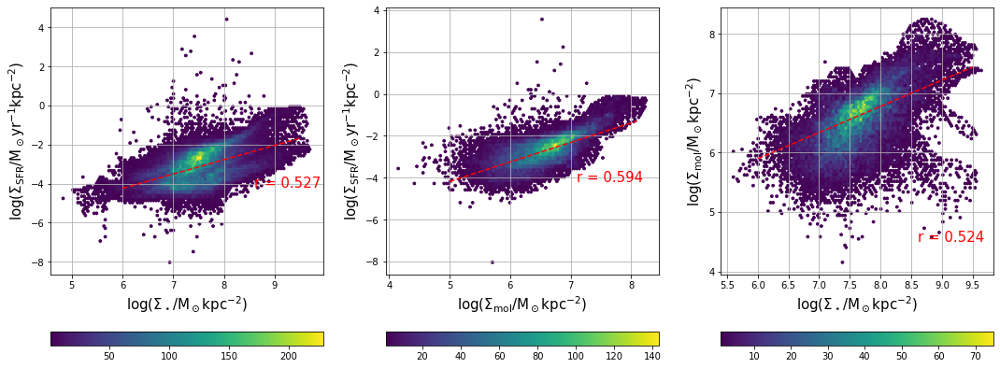

In [224]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database['log_S_Mstar'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsontot_SFR_Mstar.intercept+6.*pearsontot_SFR_Mstar.slope,pearsontot_SFR_Mstar.intercept+9.5*pearsontot_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'$r$ = {pearsontot_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database['log_S_mol_O3N2_new'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsontot_SFR_mol.intercept+5.*pearsontot_SFR_mol.slope,pearsontot_SFR_mol.intercept+8.1*pearsontot_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'$r$ = {pearsontot_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3N2_new'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsontot_mol_Mstar.intercept+6.*pearsontot_mol_Mstar.slope,pearsontot_mol_Mstar.intercept+9.5*pearsontot_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'$r$ = {pearsontot_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


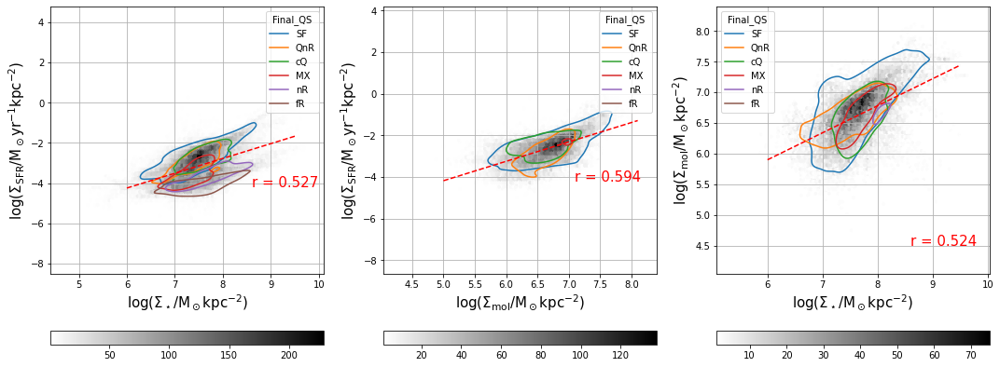

In [219]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database['log_S_Mstar'],Database['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsontot_SFR_Mstar.intercept+6.*pearsontot_SFR_Mstar.slope,pearsontot_SFR_Mstar.intercept+9.5*pearsontot_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'$r$ = {pearsontot_SFR_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database, x="log_S_Mstar", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[0])
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database['log_S_mol_O3N2'],Database['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsontot_SFR_mol.intercept+5.*pearsontot_SFR_mol.slope,pearsontot_SFR_mol.intercept+8.1*pearsontot_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'$r$ = {pearsontot_SFR_mol.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database, x="log_S_mol_O3N2", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[1])
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3N2'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsontot_mol_Mstar.intercept+6.*pearsontot_mol_Mstar.slope,pearsontot_mol_Mstar.intercept+9.5*pearsontot_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'$r$ = {pearsontot_mol_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database, x="log_S_Mstar", y='log_S_mol_O3N2',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[2])
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

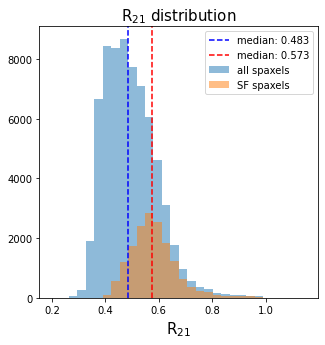

In [183]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Database['R_21'],bins=np.linspace(0.2,1.15,31),alpha=0.5,label=r'all spaxels')
ax.hist(Database_SF['R_21'],bins=np.linspace(0.2,1.15,31),alpha=0.5,label=r'SF spaxels')
median = np.nanmedian(Database['R_21'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
median = np.nanmedian(Database_SF['R_21'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'R$_\mathrm{21}$',size=15)
ax.set_title(r'R$_\mathrm{21}$ distribution',size=15)
ax.legend(loc='best')
plt.show()

In [40]:
alphaCO_MW = 4.3

## Tests of CO velocity dispersion ($\sigma_{V,CO}$)

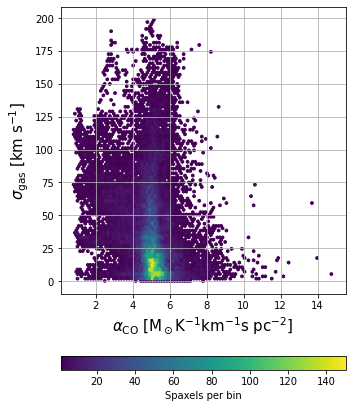

In [47]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = (Database['alphaCO_O3N2']<15)&(Database['CO_vdisp']<200)
im = ax.hexbin(Database.loc[mask,'alphaCO_O3N2'],Database.loc[mask,'CO_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.set_ylabel(r'$\sigma_\mathrm{gas}$ [km s$^{-1}$]',size=15)
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=15)
ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

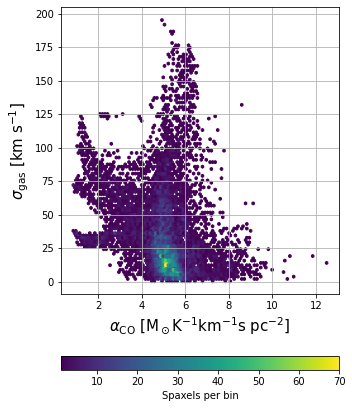

In [51]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = (Database_SF['alphaCO_O3N2']<15)&(Database_SF['CO_vdisp']<200)
im = ax.hexbin(Database_SF.loc[mask,'alphaCO_O3N2'],Database_SF.loc[mask,'CO_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.set_ylabel(r'$\sigma_\mathrm{gas}$ [km s$^{-1}$]',size=15)
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=15)
ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

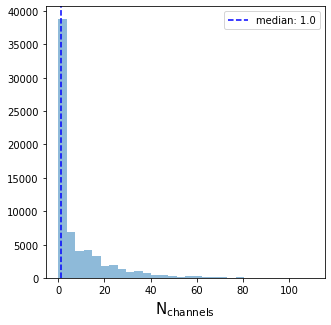

In [43]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Database['CO_nchannels'],alpha=0.5,bins=np.linspace(0.,110,31))
median = np.nanmedian(Database['CO_nchannels'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'N$_\mathrm{channels}$',size=15)
ax.legend(loc='best')
plt.show()

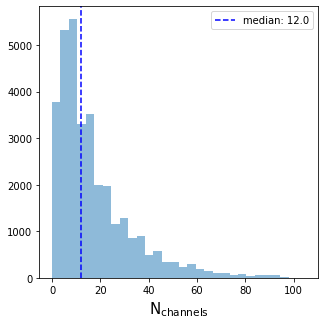

In [54]:
fig, ax = plt.subplots(figsize=(5,5))
mask = np.isfinite(Database['CO_int'])
ax.hist(Database.loc[mask,'CO_nchannels'],alpha=0.5,bins=np.linspace(0.,105,31))
median = np.nanmedian(Database.loc[mask,'CO_nchannels'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'N$_\mathrm{channels}$',size=15)
ax.legend(loc='best')
plt.show()

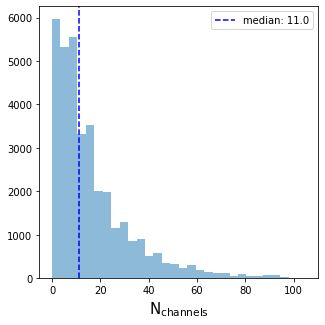

In [85]:
fig, ax = plt.subplots(figsize=(5,5))
mask = Database['CO_nchannels']>0
ax.hist(Database.loc[mask,'CO_nchannels'],alpha=0.5,bins=np.linspace(0.,105,31))
median = np.nanmedian(Database.loc[mask,'CO_nchannels'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'N$_\mathrm{channels}$',size=15)
ax.legend(loc='best')
plt.show()

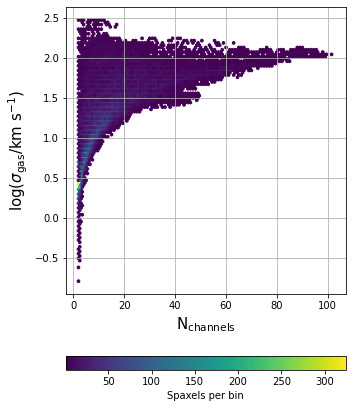

In [57]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = (Database['CO_vdisp']<300)
im = ax.hexbin(Database.loc[mask,'CO_nchannels'],np.log10(Database.loc[mask,'CO_vdisp']),mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.set_ylabel(r'log($\sigma_\mathrm{gas}$/km s$^{-1}$)',size=15)
ax.set_xlabel(r'N$_\mathrm{channels}$',size=15)
ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

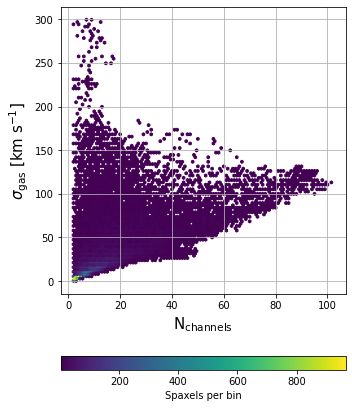

In [44]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = (Database['CO_vdisp']<300)
im = ax.hexbin(Database.loc[mask,'CO_nchannels'],Database.loc[mask,'CO_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.set_ylabel(r'$\sigma_\mathrm{gas}$ [km s$^{-1}$]',size=15)
ax.set_xlabel(r'N$_\mathrm{channels}$',size=15)
ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

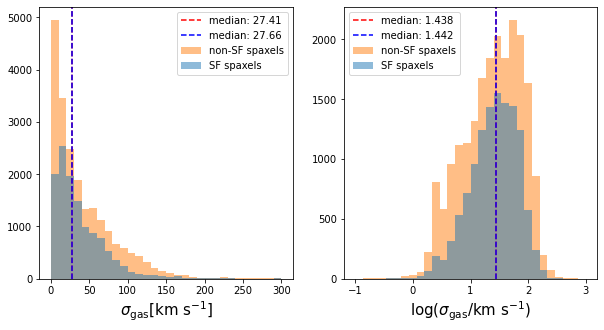

In [69]:
fig, axs = plt.subplots(1,2,figsize=(10,5))
for ax,passive,SF,bins,xlabel in zip(axs.ravel(),[Database_passive['CO_vdisp'],np.log10(Database_passive['CO_vdisp'])],
                                   [Database_SF['CO_vdisp'],np.log10(Database_SF['CO_vdisp'])],[np.linspace(0.,300,31),np.linspace(-1,3,31)],[r'$\sigma_\mathrm{gas}$[km s$^{-1}$]',r'log($\sigma_\mathrm{gas}$/km s$^{-1}$)']):
    ax.hist(passive,alpha=0.5,label=r'passive spaxels',color='tab:orange',bins=bins)
    median = np.nanmedian(passive)
    ax.axvline(median,ls='--',c='r',label=f'median: {median:.4}')
    ax.hist(SF,alpha=0.5,label=r'SF spaxels',bins=bins)
    median = np.nanmedian(SF)
    ax.axvline(median,ls='--',c='b',label=f'median: {median:.4}')
    ax.set_xlabel(xlabel,size=15)
    ax.legend(loc='best')
plt.show()

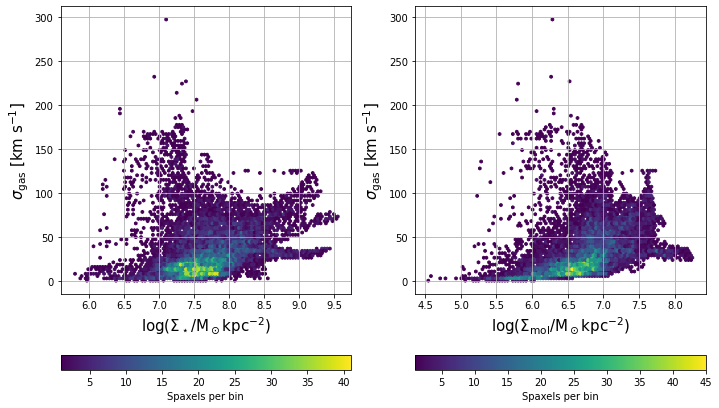

In [40]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
mask = (Database_SF['CO_vdisp']<200)
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_mol_O3'],[r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)']):
    im = ax.hexbin(Database_SF.loc[mask,name],Database_SF.loc[mask,'CO_vdisp'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.set_ylabel(r'$\sigma_\mathrm{gas}$ [km s$^{-1}$]',size=15)
    ax.set_xlabel(label,size=15)
    ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

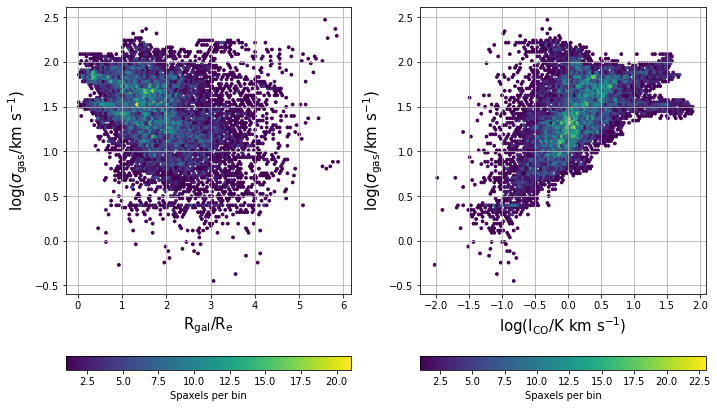

In [60]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
mask = (Database_SF['CO_vdisp']<300)
for ax,xdata,label in zip(axs.ravel(),[Database_SF.loc[mask,'Rgal_Re'],np.log10(Database_SF.loc[mask,'CO_int'])],
                         [r'R$_\mathrm{gal}$/R$_\mathrm{e}$',r'log(I$_\mathrm{CO}$/K km s$^{-1}$)']):
    im = ax.hexbin(xdata,np.log10(Database_SF.loc[mask,'CO_vdisp']),mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.set_ylabel(r'log($\sigma_\mathrm{gas}$/km s$^{-1}$)',size=15)
    ax.set_xlabel(label,size=15)
    ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

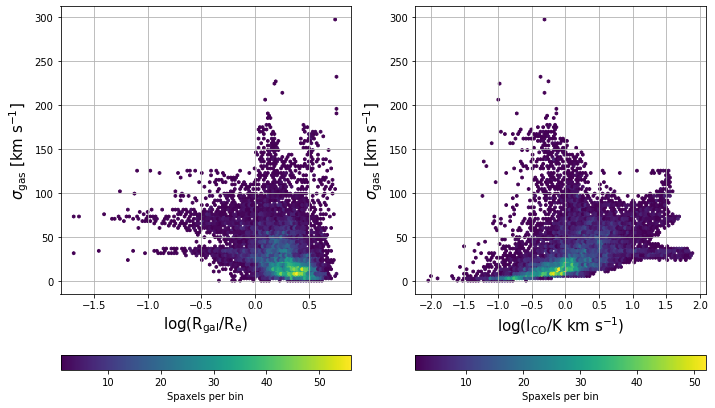

In [45]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
mask = (Database_SF['CO_vdisp']<300)
for ax,name,label in zip(axs.ravel(),['Rgal_Re','CO_int'],[r'log(R$_\mathrm{gal}$/R$_\mathrm{e}$)',r'log(I$_\mathrm{CO}$/K km s$^{-1})$']):
    im = ax.hexbin(np.log10(Database_SF.loc[mask,name]),Database_SF.loc[mask,'CO_vdisp'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.set_ylabel(r'$\sigma_\mathrm{gas}$ [km s$^{-1}$]',size=15)
    ax.set_xlabel(label,size=15)
    ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

## Tests of alphaCO

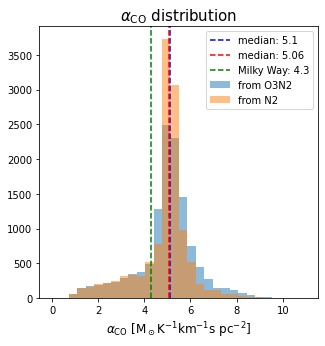

In [42]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Database_SF['alphaCO_O3N2'],bins=np.linspace(0.,11,31),alpha=0.5,label='from O3N2')
median1 = np.nanmedian(Database_SF['alphaCO_O3N2'])
ax.axvline(median1,ls='--',c='b',label=f'median: {median1:.3}')
ax.hist(Database_SF['alphaCO_N2'],bins=np.linspace(0.,11,31),alpha=0.5,label='from N2')
median2 = np.nanmedian(Database_SF['alphaCO_N2'])
ax.axvline(median2,ls='--',c='r',label=f'median: {median2:.3}')
ax.axvline(alphaCO_MW,ls='--',c='g',label=f'Milky Way: {alphaCO_MW:.3}')
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=12)
ax.set_title(r'$\alpha_\mathrm{CO}$ distribution',size=15)
ax.legend(loc='best')
#ax.set_yscale('log')
plt.show()

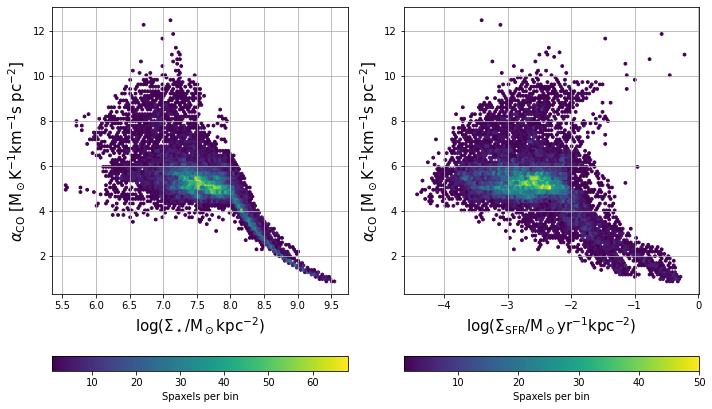

In [64]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
mask = (Database_SF['alphaCO_O3N2']<15)
for ax, name, label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR'],[r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)']):
    im = ax.hexbin(Database_SF.loc[mask,name],Database_SF.loc[mask,'alphaCO_O3N2'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.set_ylabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=15)
    ax.set_xlabel(label,size=15)
    ax.grid(True)
fig.tight_layout()
plt.show()

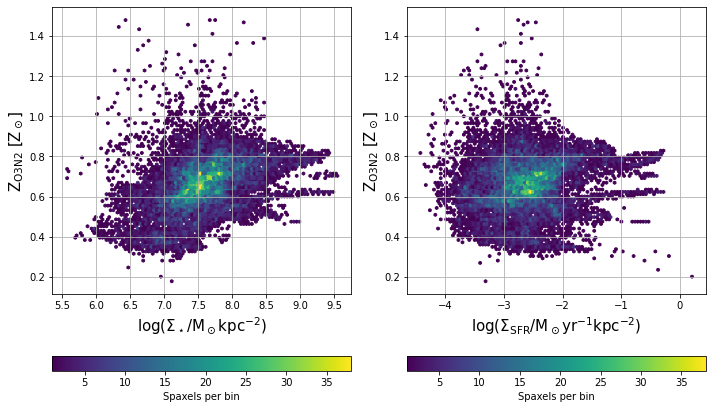

In [66]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
mask = (Database_SF['Z_O3N2']<1.5)
for ax, name, label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR'],[r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)']):
    im = ax.hexbin(Database_SF.loc[mask,name],Database_SF.loc[mask,'Z_O3N2'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.set_ylabel(r'Z$_\mathrm{O3N2}$ [Z$_\odot$]',size=15)
    ax.set_xlabel(label,size=15)
    ax.grid(True)
fig.tight_layout()
plt.show()

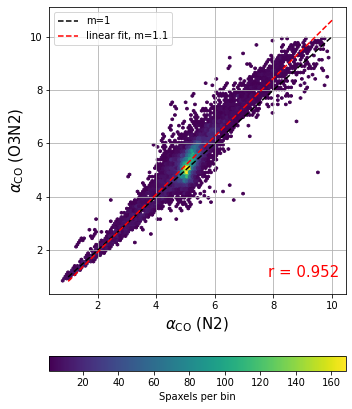

In [69]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = (Database_SF['alphaCO_O3N2']<10)&(Database_SF['alphaCO_N2']<10)
pearson = linregress(Database_SF.loc[mask,'alphaCO_N2'],Database_SF.loc[mask,'alphaCO_O3N2'])
im = ax.hexbin(Database_SF.loc[mask,'alphaCO_N2'],Database_SF.loc[mask,'alphaCO_O3N2'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([1.,10.],[1.,10.],c='k',ls='--',label='m=1')
ax.plot([1.,10.],[pearson.slope*1.+pearson.intercept,pearson.slope*10+pearson.intercept],c='r',ls='--',label='linear fit'+f', $m$={pearson.slope:.2}')
ax.text(7.8,1.,f'$r$ = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'$\alpha_\mathrm{CO}$ (O3N2)',size=15)
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ (N2)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

In [195]:
aca_table = pd.read_csv('/users/brodriguez/Documents/ACA_sourcelist.csv',sep=',',index_col=0)
aca_table.info()

,califa_file,Final_QS,Final_NA,RA,DEC,inclination_ACA,PA_ACA,z_ACA,Dist_Mpc_ACA,Re_arc_ACA,z_stars,inclination_califa,PA_califa,Re_arc_califa,Re_kpc_califa,log_Mass,log_SFR_SF
source,,,,,,,,,,,,,,,,,
CGCG429-012,CGCG429-012,fR,nonA,339.207500,14.386972,60,4,0.01751,84,5.3,0.017464,59.991884,96.449515,3.919392,1.371765,10.506506,-2.172429
IC1079,IC1079,MX,nonA,224.150417,9.369750,50,81,0.02907,114,19.3,0.029067,53.368636,172.896524,19.981980,11.484491,11.335791,-1.888618
IC1528,IC1528,SF,nonA,1.272083,-7.093417,70,72,0.01250,48,16.9,0.012518,69.618338,163.338896,16.030980,4.062060,10.446165,0.204624
IC2341,IC2341,fR,nonA,125.922500,21.434861,60,2,0.01701,75,8.0,0.016950,59.210044,92.323697,5.628132,1.907830,10.766219,-1.695772
MCG-01-01-012,MCG-01-01-012,MX,nonA,359.795000,-4.191833,90,70,0.01883,78,11.2,0.018803,73.160751,162.159184,11.401920,4.296295,11.037187,-0.543660
MCG-01-10-015,MCG-01-10-015,SF,nonA,54.662917,-5.347333,73,75,0.01343,90,11.8,0.013407,73.160751,165.127792,12.829824,3.454377,10.021195,-0.158798
MCG-01-52-012,MCG-01-52-012,nR,nonA,309.457917,-6.090750,43,72,0.01270,100,4.5,0.012703,39.246907,158.522822,15.220728,3.886221,10.479028,-1.940627
MCG-02-02-030,MCG-02-02-030,QnR,sAGN,7.530417,-11.113639,70,170,0.01179,42,13.9,0.011777,69.592464,258.366666,12.412584,2.930599,10.513107,-0.124999
MCG-02-51-004,MCG-02-51-004,SF,nonA,303.915833,-13.622028,68,159,0.01876,90,15.8,0.018759,70.360150,250.342809,11.645784,4.383835,10.977911,0.733868


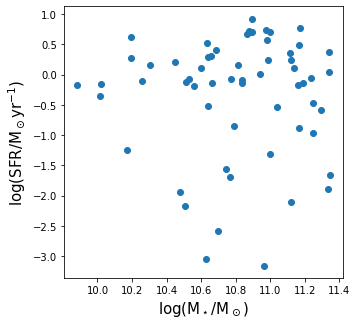

In [193]:
fig, ax = plt.subplots(figsize=(5,5))
ax.scatter(aca_table['log_Mass'].to_numpy(),aca_table['log_SFR_SF'].to_numpy())
ax.set_xlabel(r'log(M$_\star$/M$_\odot$)',size=15)
ax.set_ylabel(r'log(SFR/M$_\odot$yr$^{-1}$)',size=15)
plt.show()

In [59]:
sources = np.unique(Database_SF['Source'])

In [145]:
Ph_binwidth = 0.5
SF_byPh = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_P_h'],Ph_binwidth))
#means_Ph = grouped_Ph[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].mean()
SF_byPh_median = SF_byPh[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

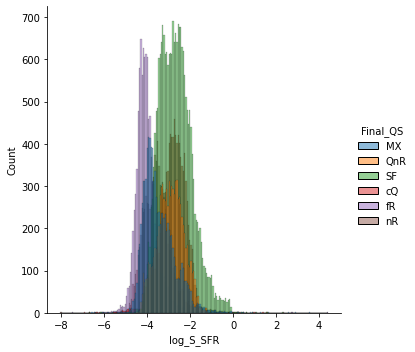

In [29]:
sns.displot(Database, x="log_S_SFR",hue="Final_QS")#,  kind="kde")#hue="Final_QS",

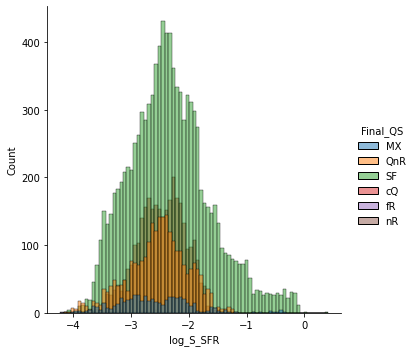

In [28]:
sns.displot(Database_SF, x="log_S_SFR",hue="Final_QS")#,  kind="kde")#hue="Final_QS",

In [91]:
S_SFR_binwidth = 1.
grouped_fCO = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_f_CO'],0.5))
medians_fCO = grouped_fCO[['log_f_CO','log_S_SFR']].median()
grouped_Mstar = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_S_Mstar'],0.5))
medians_Mstar = grouped_Mstar[['log_S_Mstar','log_S_SFR']].median()
grouped_Smol = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_S_mol_O3N2'],0.5))
medians_Smol = grouped_Smol[['log_S_SFR','log_S_mol_O3N2']].median()

In [97]:
#S_SFR_binwidth = 1.
#grouped_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(np.log10(Database_SF.loc[:,'P_h']),P_binwidth)])
grouped_fCO_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_f_CO'],0.5)])
medians_fCO_QS = grouped_fCO_QS[['log_f_CO','log_S_SFR']].median()
grouped_Mstar_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_S_Mstar'],0.5)])
medians_Mstar_QS = grouped_Mstar_QS[['log_S_Mstar','log_S_SFR']].median()
grouped_Smol_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_S_mol_O3N2'],0.5)])
medians_Smol_QS = grouped_Smol_QS[['log_S_SFR','log_S_mol_O3N2']].median()
grouped_Ph_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_P_h'],0.5)])
medians_Ph_QS = grouped_Ph_QS[['log_S_SFR','log_P_h']].median()

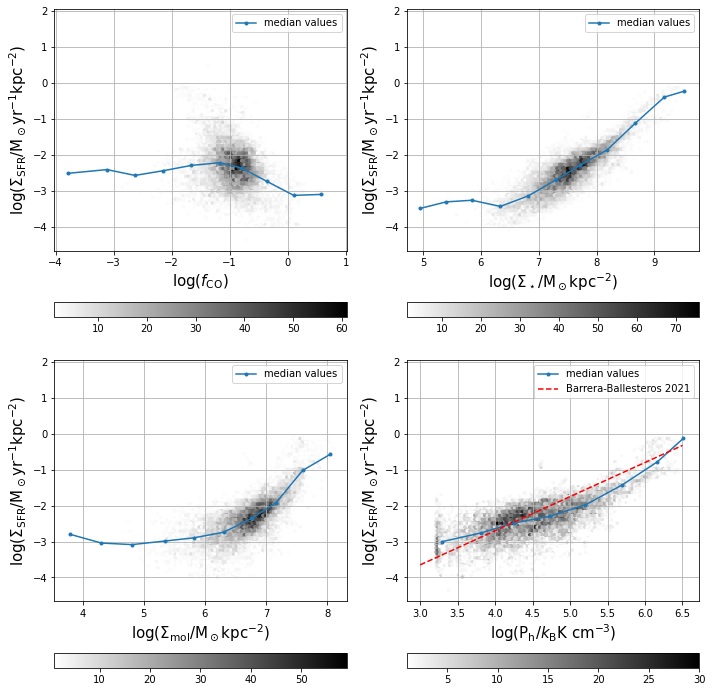

In [93]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label,medians in zip(axs.ravel(),['log_f_CO','log_S_Mstar','log_S_mol_O3N2','log_P_h'],
                          [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)'],
                           [medians_fCO,medians_Mstar,medians_Smol,medians_Ph]):
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    #print(stacked['P_h'].shape,frame.shape)
    #ax.plot(medians_SSFR[name].to_numpy(),medians_SSFR['log_S_SFR'].to_numpy(),marker='.',label='median values')
    ax.plot(medians[name].to_numpy(),medians['log_S_SFR'].to_numpy(),marker='.',label='median values')
    #ax.plot(np.log10(mean_stacked[name].to_numpy()),np.log10(mean_stacked['S_SFR'].to_numpy()),marker='.',label='mean values')
    ax.set_xlabel(label,size=15)
    ax.grid(True)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.legend(loc='best')
axs[1,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='r',ls='--',label='BB+21')
axs[1,1].legend(loc='best')
fig.tight_layout()
plt.show()

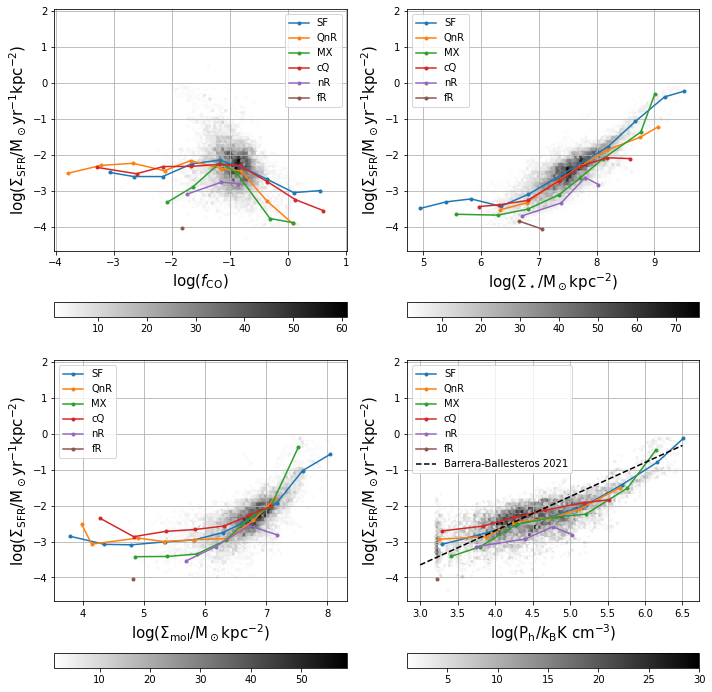

In [100]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label,medians in zip(axs.ravel(),['log_f_CO','log_S_Mstar','log_S_mol_O3N2','log_P_h'],
                          [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)'],
                           [medians_fCO_QS,medians_Mstar_QS,medians_Smol_QS,medians_Ph_QS]):
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    #print(stacked['P_h'].shape,frame.shape)
    for QS in ['SF','QnR','cQ','MX','nR','fR']:
        ax.plot(medians.loc[(QS,),name].to_numpy(),medians.loc[(QS,),'log_S_SFR'].to_numpy(),marker='.',label=QS)
    #ax.plot(medians[name].to_numpy(),medians['log_S_SFR'].to_numpy(),marker='.',label='median values')
    ax.set_xlabel(label,size=15)
    ax.grid(True)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.legend(loc='best')
axs[1,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='BB+21')
axs[1,1].legend(loc='best')
fig.tight_layout()
plt.show()

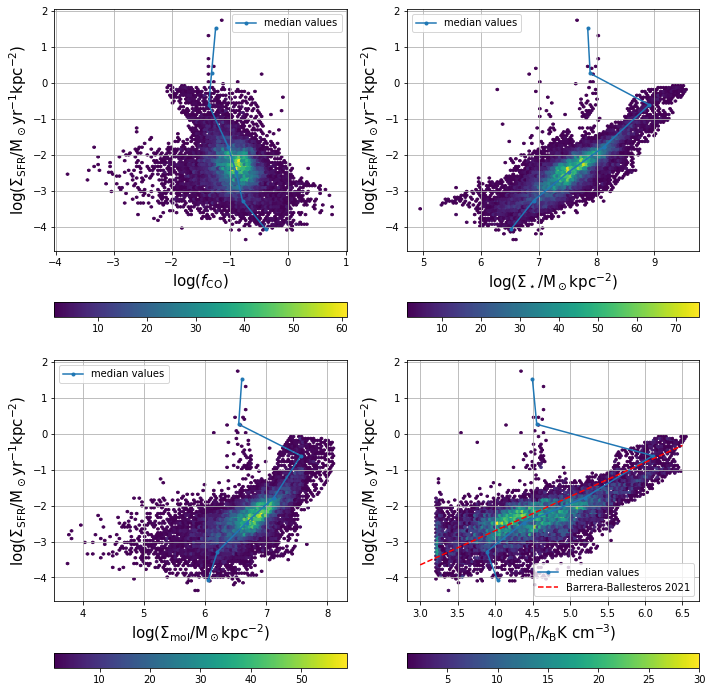

In [88]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_f_CO','log_S_Mstar','log_S_mol_O3N2','log_P_h'],
                          [r'log($f_\mathrm{mol}$)',r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)#,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    #print(stacked['P_h'].shape,frame.shape)
    ax.plot(medians_SSFR[name].to_numpy(),medians_SSFR['log_S_SFR'].to_numpy(),marker='.',label='median values')
    #ax.plot(np.log10(mean_stacked[name].to_numpy()),np.log10(mean_stacked['S_SFR'].to_numpy()),marker='.',label='mean values')
    ax.set_xlabel(label,size=15)
    ax.grid(True)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.legend(loc='best')
axs[1,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='r',ls='--',label='BB+21')
axs[1,1].legend(loc='best')
fig.tight_layout()
plt.show()

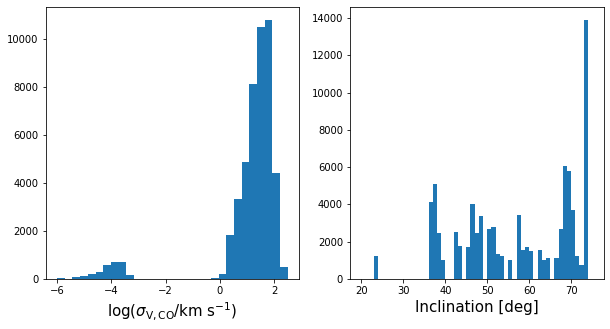

In [7]:
fig, axs = plt.subplots(1,2,figsize=(10,5))
axs[0].hist(np.log10(Database['CO_vdisp']),bins=np.linspace(-6,2.5,31))
axs[0].set_xlabel('log($\sigma_\mathrm{V,CO}$/km s$^{-1}$)',fontsize=15)
axs[1].hist(Database['Inclination'],bins=np.linspace(20,75,56))
axs[1].set_xlabel('Inclination [deg]',fontsize=15)
plt.show()

In [ ]:
Database.loc[np.log10(Database['CO_vdisp'])<=-1,['CO_vdisp','S_mol_O3N2','f_CO','SFE','P_h','P_DE']]=np.nan

/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


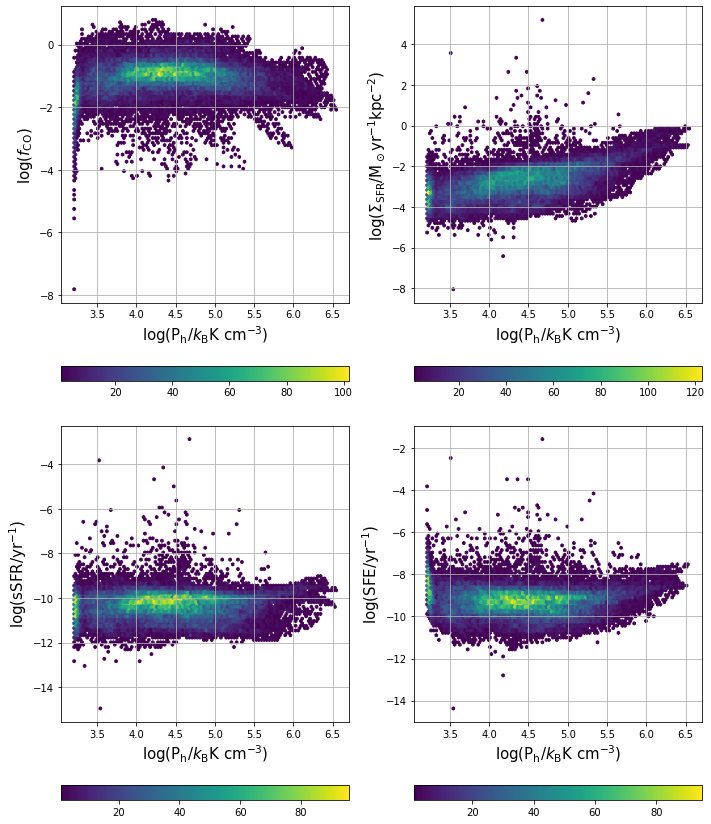

In [4]:
fig, axs = plt.subplots(2,2,figsize=(10,12))
for ax,frame,title,label in zip(axs.ravel(),[np.log10(Database['f_CO']),np.log10(Database['S_SFR']),np.log10(Database['sSFR']),np.log10(Database['SFE'])],
                          [r'$f_\mathrm{mol}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{mol}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(np.log10(Database['P_h']),frame,mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    #ax.legend(loc='best')
fig.tight_layout()
plt.show()